# Check Python version and upgrading

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:

#!pip install --upgrade pip

import sys
import os

init_dir = os.getcwd()

# !conda update -n base -c defaults conda -y
# !conda install -y pytorch torchvision -c pytorch

!pip uninstall -y numpy 
!pip install numpy

Found existing installation: numpy 1.23.1
Uninstalling numpy-1.23.1:
ERROR: Exception:
Traceback (most recent call last):
  File "/usr/lib/python3.8/shutil.py", line 791, in move
    os.rename(src, real_dst)
PermissionError: [Errno 13] Permission denied: '/usr/local/lib/python3.8/dist-packages/numpy-1.23.1-py3.8-linux-x86_64.egg' -> '/tmp/pip-uninstall-er_2uxwd'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/petrakov/.local/lib/python3.8/site-packages/pip/_internal/cli/base_command.py", line 167, in exc_logging_wrapper
    status = run_func(*args)
  File "/home/petrakov/.local/lib/python3.8/site-packages/pip/_internal/commands/uninstall.py", line 98, in run
    uninstall_pathset = req.uninstall(
  File "/home/petrakov/.local/lib/python3.8/site-packages/pip/_internal/req/req_install.py", line 658, in uninstall
    uninstalled_pathset.remove(auto_confirm, verbose)
  File "/home/petrakov/.local/lib/python3.8/site-pack

# Installations of 3 key libraries: KILT, GENRE and fairseq

In [3]:
init_dir

'/home/petrakov/control_experiment/mGENRE_MEL'

In [4]:
#KILT
%rm -rf KILT
!git clone https://github.com/facebookresearch/KILT.git
%cd KILT
!pip install -r requirements.txt
!python setup.py install
sys.path.append(os.getcwd())
%cd ..

#GENRE
%rm -rf GENRE
!git clone https://github.com/facebookresearch/GENRE.git
%cd GENRE
!pip install ./
!python ./setup.py build develop install
!pip install sentencepiece marisa_trie
sys.path.append(os.getcwd())
%cd ..

# fairseq
%rm -rf fairseq
!git clone --branch fixing_prefix_allowed_tokens_fn https://github.com/nicola-decao/fairseq
%cd fairseq
!sed -i -e '26,27d' fairseq/registry.py
!pip install --editable ./
!python setup.py build develop
!python setup.py install
sys.path.append(os.getcwd())
%cd ..

!pip install kilt

#####
%cd fairseq
!pip install --editable ./
%cd ..

!pip uninstall -y numpy 
!pip install numpy

!pip install gdown
!pip install stanza

Cloning into 'KILT'...
remote: Enumerating objects: 401, done.
remote: Counting objects: 100% (151/151), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 401 (delta 108), reused 92 (delta 92), pack-reused 250
Receiving objects: 100% (401/401), 829.97 KiB | 3.74 MiB/s, done.
Resolving deltas: 100% (224/224), done.
/home/petrakov/control_experiment/mGENRE_MEL/KILT
Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
Traceback (most recent call last):
  File "setup.py", line 8, in <module>
    import setuptools
ImportError: No module named setuptools
/home/petrakov/control_experiment/mGENRE_MEL
Cloning into 'GENRE'...
remote: Enumerating objects: 457, done.
remote: Counting objects: 100% (173/173), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 457 (delta 114), reused 102 (delta 79), pack-reused 284
Receiving objects: 100% (457

## import libraries

In [5]:
import gdown
import json
import pickle
import torch
import gc
import re
from wikidata.client import Client
import pandas as pd
import numpy as np
import random
import scipy.stats
import string
import json
from itertools import compress
from datetime import datetime
import matplotlib.pyplot as plt
import stanza
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

## Upload data and model (comment cell below if already downloaded)

In [6]:
# # pretrained model
# ! rm -rf fairseq_multilingual_entity_disambiguation*
# ! wget https://dl.fbaipublicfiles.com/GENRE/fairseq_multilingual_entity_disambiguation.tar.gz
# ! tar -xvf fairseq_multilingual_entity_disambiguation.tar.gz

# # data
# ! wget https://dl.fbaipublicfiles.com/GENRE/lang_title2wikidataID-normalized_with_redirect.pkl
# ! wget http://dl.fbaipublicfiles.com/GENRE/titles_lang_all105_marisa_trie_with_redirect.pkl

In [7]:
%cd $init_dir

/home/petrakov/control_experiment/mGENRE_MEL


In original version there were serious of troubles that's why correct version we add here from external google drive

In [8]:
%%writefile fairseq_model.py
# Copyright (c) Facebook, Inc. and its affiliates.
# All rights reserved.
#
# This source code is licensed under the license found in the
# LICENSE file in the root directory of this source tree.

import copy
import logging
import os
from collections import defaultdict
from typing import Dict, List

import torch
from fairseq import search, utils
from fairseq.models.bart import BARTHubInterface, BARTModel
from omegaconf import open_dict

logger = logging.getLogger(__name__)


class GENREHubInterface(BARTHubInterface):
    def sample(
        self,
        sentences: List[str],
        beam: int = 5,
        verbose: bool = False,
        text_to_id=None,
        marginalize=False,
        marginalize_lenpen=0.5,
        max_len_a=1024,
        max_len_b=1024,
        **kwargs,
    ) -> List[str]:
        if isinstance(sentences, str):
            return self.sample([sentences], beam=beam, verbose=verbose, **kwargs)[0]
        tokenized_sentences = [self.encode(sentence) for sentence in sentences]

        batched_hypos = self.generate(
            tokenized_sentences,
            beam,
            verbose,
            max_len_a=max_len_a,
            max_len_b=max_len_b,
            **kwargs,
        )
        #print("batched_hypos", batched_hypos)
        
        outputs = [
            [
                {"text": self.decode(hypo["tokens"]), "score": hypo["score"]}
                for hypo in hypos
            ]
            for hypos in batched_hypos
        ]
        if text_to_id:
            outputs = [
                [{**hypo, "id": text_to_id(hypo["text"])} for hypo in hypos]
                for hypos in outputs
            ]

            if marginalize:
                for (i, hypos), hypos_tok in zip(enumerate(outputs), batched_hypos):
                    outputs_dict = defaultdict(list)
                    for hypo, hypo_tok in zip(hypos, hypos_tok):
                        outputs_dict[hypo["id"]].append(
                            {**hypo, "len": len(hypo_tok["tokens"])}
                        )

                    outputs[i] = sorted(
                        [
                            {
                                "id": _id,
                                "texts": [hypo["text"] for hypo in hypos],
                                "scores": torch.stack(
                                    [hypo["score"] for hypo in hypos]
                                ),
                                "score": torch.stack(
                                    [
                                        hypo["score"]
                                        * hypo["len"]
                                        / (hypo["len"] ** marginalize_lenpen)
                                        for hypo in hypos
                                    ]
                                ).logsumexp(-1),
                            }
                            for _id, hypos in outputs_dict.items()
                        ],
                        key=lambda x: x["score"],
                        reverse=True,
                    )

        return outputs

    def generate(self, *args, **kwargs) -> List[List[Dict[str, torch.Tensor]]]:
        return super(BARTHubInterface, self).generate(*args, **kwargs)

    def encode(self, sentence) -> torch.LongTensor:
        tokens = super(BARTHubInterface, self).encode(sentence)
        tokens[
            tokens >= len(self.task.target_dictionary)
        ] = self.task.target_dictionary.unk_index
        if tokens[0] != self.task.target_dictionary.bos_index:
            return torch.cat(
                (torch.tensor([self.task.target_dictionary.bos_index]), tokens)
            )
        else:
            return tokens

    
class GENRE(BARTModel):
    @classmethod
    def from_pretrained(
        cls,
        model_name_or_path,
        checkpoint_file="model.pt",
        data_name_or_path=".",
        bpe="gpt2",
        **kwargs,
    ):
        from fairseq import hub_utils

        x = hub_utils.from_pretrained(
            model_name_or_path,
            checkpoint_file,
            data_name_or_path,
            archive_map=cls.hub_models(),
            bpe=bpe,
            load_checkpoint_heads=True,
            **kwargs,
        )
        return GENREHubInterface(x["args"], x["task"], x["models"][0])


class mGENRE(BARTModel):
    @classmethod
    def from_pretrained(
        cls,
        model_name_or_path,
        sentencepiece_model="spm_256000.model",
        checkpoint_file="model.pt",
        data_name_or_path=".",
        bpe="sentencepiece",
        layernorm_embedding=True,
        **kwargs,
    ):
        from fairseq import hub_utils

        x = hub_utils.from_pretrained(
            model_name_or_path,
            checkpoint_file,
            data_name_or_path,
            archive_map=cls.hub_models(),
            bpe=bpe,
            load_checkpoint_heads=True,
            sentencepiece_model=os.path.join(model_name_or_path, sentencepiece_model),
            **kwargs,
        )
        return GENREHubInterface(x["args"], x["task"], x["models"][0])


Overwriting fairseq_model.py


In [9]:
%mv fairseq_model.py GENRE/genre
%cd $init_dir

/home/petrakov/control_experiment/mGENRE_MEL


In [10]:
%cd $init_dir/fairseq/fairseq/models

/home/petrakov/control_experiment/mGENRE_MEL/fairseq/fairseq/models


In [11]:
%%writefile fairseq_model.py
# Copyright (c) Facebook, Inc. and its affiliates.
#
# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.
"""
Base classes for various fairseq models.
"""

import logging
from argparse import Namespace
from typing import Dict, List, Optional, Tuple

import torch
import torch.nn as nn
import torch.nn.functional as F
from fairseq import utils
from fairseq.data import Dictionary
from fairseq.dataclass.utils import (
    convert_namespace_to_omegaconf,
    gen_parser_from_dataclass,
)
from fairseq.models import FairseqDecoder, FairseqEncoder
from omegaconf import DictConfig
from torch import Tensor


logger = logging.getLogger(__name__)


class BaseFairseqModel(nn.Module):
    """Base class for fairseq models."""

    def __init__(self):
        super().__init__()
        self._is_generation_fast = False

    @classmethod
    def add_args(cls, parser):
        """Add model-specific arguments to the parser."""
        dc = getattr(cls, "__dataclass", None)
        if dc is not None:
            # do not set defaults so that settings defaults from various architectures still works
            gen_parser_from_dataclass(parser, dc(), delete_default=True)

    @classmethod
    def build_model(cls, args, task):
        """Build a new model instance."""
        raise NotImplementedError("Model must implement the build_model method")

    def get_targets(self, sample, net_output):
        """Get targets from either the sample or the net's output."""
        return sample["target"]

    def get_normalized_probs(
        self,
        net_output: Tuple[Tensor, Optional[Dict[str, List[Optional[Tensor]]]]],
        log_probs: bool,
        sample: Optional[Dict[str, Tensor]] = None,
    ):
        """Get normalized probabilities (or log probs) from a net's output."""
        return self.get_normalized_probs_scriptable(net_output, log_probs, sample)

    # TorchScript doesn't support super() method so that the scriptable Subclass
    # can't access the base class model in Torchscript.
    # Current workaround is to add a helper function with different name and
    # call the helper function from scriptable Subclass.
    def get_normalized_probs_scriptable(
        self,
        net_output: Tuple[Tensor, Optional[Dict[str, List[Optional[Tensor]]]]],
        log_probs: bool,
        sample: Optional[Dict[str, Tensor]] = None,
    ):
        """Scriptable helper function for get_normalized_probs in ~BaseFairseqModel"""
        if hasattr(self, "decoder"):
            return self.decoder.get_normalized_probs(net_output, log_probs, sample)
        elif torch.is_tensor(net_output):
            # syntactic sugar for simple models which don't have a decoder
            # (e.g., the classification tutorial)
            logits = net_output.float()
            if log_probs:
                return F.log_softmax(logits, dim=-1)
            else:
                return F.softmax(logits, dim=-1)
        raise NotImplementedError

    def extract_features(self, *args, **kwargs):
        """Similar to *forward* but only return features."""
        return self(*args, **kwargs)

    def max_positions(self):
        """Maximum length supported by the model."""
        return None

    def load_state_dict(
        self,
        state_dict,
        strict=True,
        model_cfg: Optional[DictConfig] = None,
        args: Optional[Namespace] = None,
    ):
        """Copies parameters and buffers from *state_dict* into this module and
        its descendants.

        Overrides the method in :class:`nn.Module`. Compared with that method
        this additionally "upgrades" *state_dicts* from old checkpoints.
        """

        if model_cfg is None and args is not None:
            logger.warn("using 'args' is deprecated, please update your code to use dataclass config")
            model_cfg = convert_namespace_to_omegaconf(args).model

        self.upgrade_state_dict(state_dict)

        from fairseq.checkpoint_utils import prune_state_dict

        new_state_dict = prune_state_dict(state_dict, model_cfg)
        return super().load_state_dict(new_state_dict, strict)

    def upgrade_state_dict(self, state_dict):
        """Upgrade old state dicts to work with newer code."""
        self.upgrade_state_dict_named(state_dict, "")

    def upgrade_state_dict_named(self, state_dict, name):
        """Upgrade old state dicts to work with newer code.

        Args:
            state_dict (dict): state dictionary to upgrade, in place
            name (str): the state dict key corresponding to the current module
        """
        assert state_dict is not None

        def do_upgrade(m, prefix):
            if len(prefix) > 0:
                prefix += "."

            for n, c in m.named_children():
                name = prefix + n
                if hasattr(c, "upgrade_state_dict_named"):
                    c.upgrade_state_dict_named(state_dict, name)
                elif hasattr(c, "upgrade_state_dict"):
                    c.upgrade_state_dict(state_dict)
                do_upgrade(c, name)

        do_upgrade(self, name)

    def set_num_updates(self, num_updates):
        """State from trainer to pass along to model at every update."""

        def _apply(m):
            if hasattr(m, "set_num_updates") and m != self:
                m.set_num_updates(num_updates)

        self.apply(_apply)

    def prepare_for_inference_(self, cfg: DictConfig):
        """Prepare model for inference."""
        kwargs = {}
        kwargs["beamable_mm_beam_size"] = (
            None
            if getattr(cfg.generation, "no_beamable_mm", False)
            else getattr(cfg.generation, "beam", 5)
        )
        kwargs["need_attn"] = getattr(cfg.generation, "print_alignment", False)
        if getattr(cfg.generation, "retain_dropout", False):
            kwargs["retain_dropout"] = cfg.generation.retain_dropout
            kwargs["retain_dropout_modules"] = cfg.generation.retain_dropout_modules
        self.make_generation_fast_(**kwargs)

    def make_generation_fast_(self, **kwargs):
        """
        Legacy entry point to optimize model for faster generation.
        Prefer prepare_for_inference_.
        """
        if self._is_generation_fast:
            return  # only apply once
        self._is_generation_fast = True

        # remove weight norm from all modules in the network
        def apply_remove_weight_norm(module):
            try:
                nn.utils.remove_weight_norm(module)
            except (AttributeError, ValueError):  # this module didn't have weight norm
                return

        self.apply(apply_remove_weight_norm)

        def apply_make_generation_fast_(module, prefix):
            if len(prefix) > 0:
                prefix += "."

            base_func = BaseFairseqModel.make_generation_fast_
            for n, m in module.named_modules():
                if (
                    m != self
                    and hasattr(m, "make_generation_fast_")
                    # don't call this implementation again, e.g., if
                    # children modules also inherit from BaseFairseqModel
                    and m.make_generation_fast_.__func__ is not base_func
                ):
                    name = prefix + n
                    m.make_generation_fast_(name=name, **kwargs)

        apply_make_generation_fast_(self, "")

        def train(mode=True):
            self.model.train()
            self.train = train
            self.train()

    def prepare_for_onnx_export_(self, **kwargs):
        """Make model exportable via ONNX trace."""
        seen = set()

        def apply_prepare_for_onnx_export_(module):
            if (
                module != self
                and hasattr(module, "prepare_for_onnx_export_")
                and module not in seen
            ):
                seen.add(module)
                module.prepare_for_onnx_export_(**kwargs)

        self.apply(apply_prepare_for_onnx_export_)

    @classmethod
    def from_pretrained(
        cls,
        model_name_or_path,
        checkpoint_file="model.pt",
        data_name_or_path=".",
        **kwargs,
    ):
        """
        Load a :class:`~fairseq.models.FairseqModel` from a pre-trained model
        file. Downloads and caches the pre-trained model file if needed.

        The base implementation returns a
        :class:`~fairseq.hub_utils.GeneratorHubInterface`, which can be used to
        generate translations or sample from language models. The underlying
        :class:`~fairseq.models.FairseqModel` can be accessed via the
        *generator.models* attribute.

        Other models may override this to implement custom hub interfaces.

        Args:
            model_name_or_path (str): either the name of a pre-trained model to
                load or a path/URL to a pre-trained model state dict
            checkpoint_file (str, optional): colon-separated list of checkpoint
                files in the model archive to ensemble (default: 'model.pt')
            data_name_or_path (str, optional): point args.data to the archive
                at the given path/URL. Can start with '.' or './' to reuse the
                model archive path.
        """
        from fairseq import hub_utils

        x = hub_utils.from_pretrained(
            model_name_or_path,
            checkpoint_file,
            data_name_or_path,
            archive_map=cls.hub_models(),
            **kwargs,
        )
        logger.info(x["args"])
        return hub_utils.GeneratorHubInterface(x["args"], x["task"], x["models"])

    @classmethod
    def hub_models(cls):
        return {}


class FairseqEncoderDecoderModel(BaseFairseqModel):
    """Base class for encoder-decoder models.

    Args:
        encoder (FairseqEncoder): the encoder
        decoder (FairseqDecoder): the decoder
    """

    def __init__(self, encoder, decoder):
        super().__init__()

        self.encoder = encoder
        self.decoder = decoder
        assert isinstance(self.encoder, FairseqEncoder)
        assert isinstance(self.decoder, FairseqDecoder)

    def forward(self, src_tokens, src_lengths, prev_output_tokens, **kwargs):
        """
        Run the forward pass for an encoder-decoder model.

        First feed a batch of source tokens through the encoder. Then, feed the
        encoder output and previous decoder outputs (i.e., teacher forcing) to
        the decoder to produce the next outputs::

            encoder_out = self.encoder(src_tokens, src_lengths)
            return self.decoder(prev_output_tokens, encoder_out)

        Args:
            src_tokens (LongTensor): tokens in the source language of shape
                `(batch, src_len)`
            src_lengths (LongTensor): source sentence lengths of shape `(batch)`
            prev_output_tokens (LongTensor): previous decoder outputs of shape
                `(batch, tgt_len)`, for teacher forcing

        Returns:
            tuple:
                - the decoder's output of shape `(batch, tgt_len, vocab)`
                - a dictionary with any model-specific outputs
        """
        encoder_out = self.encoder(src_tokens, src_lengths=src_lengths, **kwargs)
        decoder_out = self.decoder(
            prev_output_tokens, encoder_out=encoder_out, **kwargs
        )
        return decoder_out

    def forward_decoder(self, prev_output_tokens, **kwargs):
        return self.decoder(prev_output_tokens, **kwargs)

    def extract_features(self, src_tokens, src_lengths, prev_output_tokens, **kwargs):
        """
        Similar to *forward* but only return features.

        Returns:
            tuple:
                - the decoder's features of shape `(batch, tgt_len, embed_dim)`
                - a dictionary with any model-specific outputs
        """
        encoder_out = self.encoder(src_tokens, src_lengths=src_lengths, **kwargs)
        features = self.decoder.extract_features(
            prev_output_tokens, encoder_out=encoder_out, **kwargs
        )
        return features

    def output_layer(self, features, **kwargs):
        """Project features to the default output size (typically vocabulary size)."""
        return self.decoder.output_layer(features, **kwargs)

    def max_positions(self):
        """Maximum length supported by the model."""
        return (self.encoder.max_positions(), self.decoder.max_positions())

    def max_decoder_positions(self):
        """Maximum length supported by the decoder."""
        return self.decoder.max_positions()


class FairseqModel(FairseqEncoderDecoderModel):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        utils.deprecation_warning(
            "FairseqModel is deprecated, please use FairseqEncoderDecoderModel "
            "or BaseFairseqModel instead",
            stacklevel=4,
        )


class FairseqMultiModel(BaseFairseqModel):
    """Base class for combining multiple encoder-decoder models."""

    def __init__(self, encoders, decoders):
        super().__init__()
        assert encoders.keys() == decoders.keys()
        self.keys = list(encoders.keys())
        for key in self.keys:
            assert isinstance(encoders[key], FairseqEncoder)
            assert isinstance(decoders[key], FairseqDecoder)

        self.models = nn.ModuleDict(
            {
                key: FairseqEncoderDecoderModel(encoders[key], decoders[key])
                for key in self.keys
            }
        )

    @staticmethod
    def build_shared_embeddings(
        dicts: Dict[str, Dictionary],
        langs: List[str],
        embed_dim: int,
        build_embedding: callable,
        pretrained_embed_path: Optional[str] = None,
    ):
        """
        Helper function to build shared embeddings for a set of languages after
        checking that all dicts corresponding to those languages are equivalent.

        Args:
            dicts: Dict of lang_id to its corresponding Dictionary
            langs: languages that we want to share embeddings for
            embed_dim: embedding dimension
            build_embedding: callable function to actually build the embedding
            pretrained_embed_path: Optional path to load pretrained embeddings
        """
        shared_dict = dicts[langs[0]]
        if any(dicts[lang] != shared_dict for lang in langs):
            raise ValueError(
                "--share-*-embeddings requires a joined dictionary: "
                "--share-encoder-embeddings requires a joined source "
                "dictionary, --share-decoder-embeddings requires a joined "
                "target dictionary, and --share-all-embeddings requires a "
                "joint source + target dictionary."
            )
        return build_embedding(shared_dict, embed_dim, pretrained_embed_path)

    def forward(self, src_tokens, src_lengths, prev_output_tokens, **kwargs):
        raise NotImplementedError

    def max_positions(self):
        """Maximum length supported by the model."""
        return {
            key: (
                self.models[key].encoder.max_positions(),
                self.models[key].decoder.max_positions(),
            )
            for key in self.keys
        }

    def max_decoder_positions(self):
        """Maximum length supported by the decoder."""
        return min(model.decoder.max_positions() for model in self.models.values())

    @property
    def encoder(self):
        return self.models[self.keys[0]].encoder

    @property
    def decoder(self):
        return self.models[self.keys[0]].decoder

    def forward_decoder(self, prev_output_tokens, **kwargs):
        return self.decoder(prev_output_tokens, **kwargs)

    def load_state_dict(
        self,
        state_dict,
        strict=True,
        model_cfg=None,
        args: Optional[Namespace] = None,
    ):
        """Copies parameters and buffers from *state_dict* into this module and
        its descendants.

        Overrides the method in :class:`nn.Module`. Compared with that method
        this additionally "upgrades" *state_dicts* from old checkpoints.
        """

        if model_cfg is None and args is not None:
            logger.warn("using 'args' is deprecated, please update your code to use dataclass config")
            model_cfg = convert_namespace_to_omegaconf(args).model

        self.upgrade_state_dict(state_dict)

        from fairseq.checkpoint_utils import prune_state_dict

        new_state_dict = prune_state_dict(state_dict, model_cfg)
        return super().load_state_dict(new_state_dict, strict)


class FairseqLanguageModel(BaseFairseqModel):
    """Base class for decoder-only models.

    Args:
        decoder (FairseqDecoder): the decoder
    """

    def __init__(self, decoder):
        super().__init__()
        self.decoder = decoder
        assert isinstance(self.decoder, FairseqDecoder)

    def forward(self, src_tokens, **kwargs):
        """
        Run the forward pass for a decoder-only model.

        Feeds a batch of tokens through the decoder to predict the next tokens.

        Args:
            src_tokens (LongTensor): tokens on which to condition the decoder,
                of shape `(batch, tgt_len)`
            src_lengths (LongTensor): source sentence lengths of shape `(batch)`

        Returns:
            tuple:
                - the decoder's output of shape `(batch, seq_len, vocab)`
                - a dictionary with any model-specific outputs
        """
        return self.decoder(src_tokens, **kwargs)

    def forward_decoder(self, prev_output_tokens, **kwargs):
        return self.decoder(prev_output_tokens, **kwargs)

    def extract_features(self, src_tokens, **kwargs):
        """
        Similar to *forward* but only return features.

        Returns:
            tuple:
                - the decoder's features of shape `(batch, seq_len, embed_dim)`
                - a dictionary with any model-specific outputs
        """
        return self.decoder.extract_features(src_tokens, **kwargs)

    def output_layer(self, features, **kwargs):
        """Project features to the default output size (typically vocabulary size)."""
        return self.decoder.output_layer(features, **kwargs)

    def max_positions(self):
        """Maximum length supported by the model."""
        return self.decoder.max_positions()

    def max_decoder_positions(self):
        """Maximum length supported by the decoder."""
        return self.decoder.max_positions()

    @property
    def supported_targets(self):
        return {"future"}


class FairseqEncoderModel(BaseFairseqModel):
    """Base class for encoder-only models.

    Args:
        encoder (FairseqEncoder): the encoder
    """

    def __init__(self, encoder):
        super().__init__()
        self.encoder = encoder
        assert isinstance(self.encoder, FairseqEncoder)

    def forward(self, src_tokens, src_lengths, **kwargs):
        """
        Run the forward pass for a encoder-only model.

        Feeds a batch of tokens through the encoder to generate features.

        Args:
            src_tokens (LongTensor): input tokens of shape `(batch, src_len)`
            src_lengths (LongTensor): source sentence lengths of shape `(batch)`

        Returns:
            the encoder's output, typically of shape `(batch, src_len, features)`
        """
        return self.encoder(src_tokens, src_lengths, **kwargs)

    def get_normalized_probs(self, net_output, log_probs, sample=None):
        """Get normalized probabilities (or log probs) from a net's output."""
        encoder_out = net_output["encoder_out"]
        if torch.is_tensor(encoder_out):
            logits = encoder_out.float()
            if log_probs:
                return F.log_softmax(logits, dim=-1)
            else:
                return F.softmax(logits, dim=-1)
        raise NotImplementedError

    def max_positions(self):
        """Maximum length supported by the model."""
        return self.encoder.max_positions()


Overwriting fairseq_model.py


In [12]:
%cd $init_dir

/home/petrakov/control_experiment/mGENRE_MEL


# Quick Start. Multilingual Autoregressive Entity Linking. ,GENRE

We are starting with importing our model mGENRE and it's important part, it was slightly changed in previous cells in order to reach stable work

In [13]:
from GENRE.genre.trie import Trie, MarisaTrie
from GENRE.genre.fairseq_model import mGENRE

Here we load data that connects titles with wikidata ids and trie that is an important part of the model

In [14]:
with open("lang_title2wikidataID-normalized_with_redirect.pkl", "rb") as f:
    lang_title2wikidataID = pickle.load(f)
  
# with open("titles_lang_all105_trie_with_redirect.pkl", "rb") as f:
#     trie = Trie.load_from_dict(pickle.load(f))

with open("titles_lang_all105_marisa_trie_with_redirect.pkl", "rb") as f:
    trie = pickle.load(f)

### Using GPU leads to faster inference, so if possible it is recommended

Here we chosen 4 because there were lot's of free memory on our own server, you can check the memory available for you using the command below

In [15]:
!nvidia-cdl

Driver version: 515.65.01
------------------- Device 0 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 18915MiB / 24576MiB
Temperature: 60C
Running processes not found

------------------- Device 1 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 24327MiB / 24576MiB
Temperature: 58C
Running processes not found

------------------- Device 2 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 13646MiB / 24576MiB
Temperature: 22C
Running processes not found

------------------- Device 3 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage:  3012MiB / 24576MiB
Temperature: 21C
Running processes not found

------------------- Device 4 -------------------
Name: NVIDIA GeForce RTX 2080 Ti
Memory usage:  3145MiB / 11264MiB
Temperature: 29C
Running processes not found

------------------- Device 5 -------------------
Name: NVIDIA GeForce RTX 2080 Ti
Memory usage:   248MiB / 11264MiB
Temperature: 25C
Running processes not found



In [16]:
device = torch.device('cuda:5' if torch.cuda.is_available() else 'cpu')
# generate Wikipedia titles and language IDs
model_mGENRE = mGENRE.from_pretrained("fairseq_multilingual_entity_disambiguation").eval()
model_mGENRE.to(device)

GENREHubInterface(
  (models): ModuleList(
    (0): BARTModel(
      (encoder): TransformerEncoder(
        (dropout_module): FairseqDropout()
        (embed_tokens): Embedding(256001, 1024, padding_idx=1)
        (embed_positions): LearnedPositionalEmbedding(1026, 1024, padding_idx=1)
        (layernorm_embedding): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (layers): ModuleList(
          (0): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (dropout_module): FairseqDropout()
              (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
            )
            (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
            (dropout_module): FairseqDro

Example of model result

In [17]:
sentences = ["[START] The founder of the theory of relativity [END] received the Nobel Prize."]
model_mGENRE.sample(
    sentences,
    beam = 5,
    prefix_allowed_tokens_fn=lambda batch_id, sent: [
        e for e in trie.get(sent.tolist())
        if e < len(model_mGENRE.task.target_dictionary)
    ],
    text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
    marginalize=True,
    verbose = True
)

[[{'id': 'Q937',
   'texts': ['Albert Einstein >> en'],
   'scores': tensor([-0.7137], device='cuda:5'),
   'score': tensor(-1.5959, device='cuda:5')},
  {'id': 'Q363005',
   'texts': ['John Singleton >> en'],
   'scores': tensor([-0.7909], device='cuda:5'),
   'score': tensor(-1.9374, device='cuda:5')},
  {'id': 'Q7374',
   'texts': ['Alfred Hitchcock >> en'],
   'scores': tensor([-0.8762], device='cuda:5'),
   'score': tensor(-2.3182, device='cuda:5')},
  {'id': 'Q715110',
   'texts': ['Robert Maynard >> en'],
   'scores': tensor([-0.8954], device='cuda:5'),
   'score': tensor(-2.3689, device='cuda:5')},
  {'id': 'Q9353',
   'texts': ['John Locke >> en'],
   'scores': tensor([-1.0060], device='cuda:5'),
   'score': tensor(-2.4641, device='cuda:5')}]]

Results above demonstrate that each *text* has it's own id and via marginalization procedure we have unique score for predicted entity

# Uncertainty estimation

## Data uploading (Simple Questions)

In [18]:
# %cd $init_dir
# %cd ..
# !git clone https://github.com/askplatypus/wikidata-simplequestions
# %cd $init_dir

We are using test dataset

In [19]:
path_to_train_simple_questions = "/home/petrakov/wikidata-simplequestions/annotated_wd_data_test_answerable.txt"
data = pd.read_table(path_to_train_simple_questions, header=None).rename(columns = {0:"subject", 1:"property", 2:"object", 3:"question"})
data

,subject,property,object,question
0,Q7358590,P20,Q1637790,Where did roger marquis die
1,Q154335,P509,Q12152,what was the cause of death of yves klein
2,Q2747238,P413,Q5059480,What position does carlos gomez play?
3,Q62498,P21,Q6581097,how does engelbert zaschka identify
4,Q182485,P413,Q1143358,what position does pee wee reese play in baseball
...,...,...,...,...
5617,Q1492,R19,Q11923043,Who is a notable figure that was born in barce...
5618,Q2870425,R1431,Q18162623,what films have been produced by jun lana?
5619,Q445899,P19,Q1748,Where was gunnar johansen born in Denmark?
5620,Q582715,P31,Q3863,what celestial object is 2974 holden


## Data uploading (Simple Questions with 1 answer)

In [20]:
# %cd $init_dir
# %cd ..
# !git clone https://github.com/SergeyPetrakov/annotated_wd_data_test_answerable_answer_counts
# %cd $init_dir

In [21]:
path_to_annotated_wd_data_test_answerable_answer_counts = "/home/petrakov/annotated_wd_data_test_answerable_answer_counts/annotated_wd_data_test_answerable_answer_counts.txt"
data_clean = pd.read_table(path_to_annotated_wd_data_test_answerable_answer_counts, header=None).rename(columns = {0:"subject", 1:"property", 2:"object", 3:"question"})
data_clean.rename(columns = {4: "number_of_answers"}, inplace = True)
data_clean = data_clean[data_clean["number_of_answers"] == 1]
data_clean = data_clean.drop(["number_of_answers"], axis = 1)
data_clean


,subject,property,object,question
0,Q7358590,P20,Q1637790,Where did roger marquis die
1,Q154335,P509,Q12152,what was the cause of death of yves klein
2,Q2747238,P413,Q5059480,What position does carlos gomez play?
3,Q62498,P21,Q6581097,how does engelbert zaschka identify
4,Q182485,P413,Q1143358,what position does pee wee reese play in baseball
...,...,...,...,...
5615,Q4938547,P20,Q1754,Where did ellen lundström die
5616,Q7142651,P495,Q145,which country filmed passing shadows
5619,Q445899,P19,Q1748,Where was gunnar johansen born in Denmark?
5620,Q582715,P31,Q3863,what celestial object is 2974 holden


### Batch approach to add observations

In [22]:
# n = 400
# start_time = datetime.now()

# divider = 80

# mGENRE_results = []
# for i in range(divider):

#     mGENRE_results_i = model_mGENRE.sample(
#                                         list(data.sample(n = 5, replace = False, random_state=i).loc[:, "question"]),
#                                         beam = 3,
#                                         prefix_allowed_tokens_fn=lambda batch_id, sent: [
#                                             e for e in trie.get(sent.tolist())
#                                             if e < len(model_mGENRE.task.target_dictionary)
#                                         ],
#                                         text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
#                                         marginalize=True,
#                                         verbose = True
#                                     )
#     mGENRE_results.append(mGENRE_results_i)
#     print("part ", i, " done!")


# end_time = datetime.now()
# print('Duration: {}'.format(end_time - start_time))


In [23]:
# mGENRE_results = sum(mGENRE_results, [])

# objects = []
# for i in range(divider): 
#     objects.append(list(data.sample(n = 5, replace = False, random_state=i).loc[:, "object"]))
    
# objects = sum(objects, [])

# thresholds = [-10, -3, -2, -1.5, -1, -0.75, -0.6, -0.4, -0.2, -0.1]
# accuracy_400_top_1 = []
# share_of_observations_400_top_1 = []

# for threshold in thresholds:
#     certain_out = [i[0]['id'] for i in mGENRE_results if i[0]['score'] > threshold]
#     indexes = [1 if i[0]['score'] > threshold else 0 for i in mGENRE_results]
#     y_true = list(compress(objects, indexes))
#     result = [x in certain_out for x in y_true] 
#     accuracy = np.round(sum(result)/len(result), 2)*100
#     accuracy_400_top_1.append(accuracy)
#     share = np.round(len(result)/n*100, 2)
#     share_of_observations_400_top_1.append(share)
    
#     print("threshold = ", threshold, "\t",
#           "accuracy = ", accuracy, "%\t", 
#           "number of observations = ", len(result), '\t',
#           "share of observations = ", share, "%")

# plt.figure(figsize = (12,8))
# plt.xlabel("rejection rate, %", fontsize = 20)
# plt.ylabel("accuracy, %", fontsize = 20)
# plt.title("mGENRE certainty basing on 400 random samples")
# plt.plot(share_of_observations_400_top_1[::-1], accuracy_400_top_1, marker = '.', markersize = 15);


# MC Dropout

In [24]:
%cd $init_dir/GENRE/genre

/home/petrakov/control_experiment/mGENRE_MEL/GENRE/genre


#### Necessary changes in files in order to make MC Dropout possible

In [25]:
%%writefile fairseq_model.py
import copy
import logging
import os
from collections import defaultdict
from typing import Dict, List

import random
import numpy as np
import torch
from fairseq import search, utils
from fairseq.models.bart import BARTHubInterface, BARTModel
from omegaconf import open_dict

logger = logging.getLogger(__name__)




class GENREHubInterface(BARTHubInterface):
#     def set_seed(self, seed):
#         random.seed(seed)
#         torch.manual_seed(seed)
#         np.random.seed(seed)
    
    def sample(
        self,
        sentences: List[str],
        beam: int = 5,
        verbose: bool = False,
        text_to_id=None,
        marginalize=False,
        marginalize_lenpen=0.5,
        max_len_a=1024,
        max_len_b=1024,
        #seed=13,
        **kwargs,
    ) -> List[str]:
        
        
        if isinstance(sentences, str):
            return self.sample([sentences], beam=beam, verbose=verbose, **kwargs)[0]
        tokenized_sentences = [self.encode(sentence) for sentence in sentences]
        
        #self.set_seed(seed)
        
        batched_hypos = self.generate(
            tokenized_sentences,
            beam,
            verbose,
            max_len_a=max_len_a,
            max_len_b=max_len_b,
            **kwargs,
        )
    
        
        outputs = [
            [
                {"text": self.decode(hypo["tokens"]), "score": hypo["score"]}
                for hypo in hypos
            ]
            for hypos in batched_hypos
        ]
        if text_to_id:
            outputs = [
                [{**hypo, "id": text_to_id(hypo["text"])} for hypo in hypos]
                for hypos in outputs
            ]

            if marginalize:
                for (i, hypos), hypos_tok in zip(enumerate(outputs), batched_hypos):
                    outputs_dict = defaultdict(list)
                    for hypo, hypo_tok in zip(hypos, hypos_tok):
                        outputs_dict[hypo["id"]].append(
                            {**hypo, "len": len(hypo_tok["tokens"])}
                        )

                    outputs[i] = sorted(
                        [
                            {
                                "id": _id,
                                "texts": [hypo["text"] for hypo in hypos],
                                "scores": torch.stack(
                                    [hypo["score"] for hypo in hypos]
                                ),
                                "score": torch.stack(
                                    [
                                        hypo["score"]
                                        * hypo["len"]
                                        / (hypo["len"] ** marginalize_lenpen)
                                        for hypo in hypos
                                    ]
                                ).logsumexp(-1),
                            }
                            for _id, hypos in outputs_dict.items()
                        ],
                        key=lambda x: x["score"],
                        reverse=True,
                    )

        return outputs

    def generate(self, *args, **kwargs) -> List[List[Dict[str, torch.Tensor]]]:
        return super(BARTHubInterface, self).generate(*args, **kwargs)

    def encode(self, sentence) -> torch.LongTensor:
        tokens = super(BARTHubInterface, self).encode(sentence)
        tokens[
            tokens >= len(self.task.target_dictionary)
        ] = self.task.target_dictionary.unk_index
        if tokens[0] != self.task.target_dictionary.bos_index:
            return torch.cat(
                (torch.tensor([self.task.target_dictionary.bos_index]), tokens)
            )
        else:
            return tokens

    
class GENRE(BARTModel):
    @classmethod
    def from_pretrained(
        cls,
        model_name_or_path,
        checkpoint_file="model.pt",
        data_name_or_path=".",
        bpe="gpt2",
        **kwargs,
    ):
        from fairseq import hub_utils

        x = hub_utils.from_pretrained(
            model_name_or_path,
            checkpoint_file,
            data_name_or_path,
            archive_map=cls.hub_models(),
            bpe=bpe,
            load_checkpoint_heads=True,
            **kwargs,
        )
        return GENREHubInterface(x["args"], x["task"], x["models"][0])


class mGENRE(BARTModel):
    @classmethod
    def from_pretrained(
        cls,
        model_name_or_path,
        sentencepiece_model="spm_256000.model",
        checkpoint_file="model.pt",
        data_name_or_path=".",
        bpe="sentencepiece",
        layernorm_embedding=True,
        **kwargs,
    ):
        from fairseq import hub_utils

        x = hub_utils.from_pretrained(
            model_name_or_path,
            checkpoint_file,
            data_name_or_path,
            archive_map=cls.hub_models(),
            bpe=bpe,
            load_checkpoint_heads=True,
            sentencepiece_model=os.path.join(model_name_or_path, sentencepiece_model),
            **kwargs,
        )
        
        return GENREHubInterface(x["args"], x["task"], x["models"][0])


Overwriting fairseq_model.py


In [26]:
%cd $init_dir

/home/petrakov/control_experiment/mGENRE_MEL


In [27]:
%cat $init_dir/GENRE/genre/fairseq_model.py

import copy
import logging
import os
from collections import defaultdict
from typing import Dict, List

import random
import numpy as np
import torch
from fairseq import search, utils
from fairseq.models.bart import BARTHubInterface, BARTModel
from omegaconf import open_dict

logger = logging.getLogger(__name__)




class GENREHubInterface(BARTHubInterface):
#     def set_seed(self, seed):
#         random.seed(seed)
#         torch.manual_seed(seed)
#         np.random.seed(seed)
    
    def sample(
        self,
        sentences: List[str],
        beam: int = 5,
        verbose: bool = False,
        text_to_id=None,
        marginalize=False,
        marginalize_lenpen=0.5,
        max_len_a=1024,
        max_len_b=1024,
        #seed=13,
        **kwargs,
    ) -> List[str]:
        
        
        if isinstance(sentences, str):
            return self.sample([sentences], beam=beam, verbose=verbose, **kwargs)[0]
        tokenized_sentences = [self.encode(sentence) for sentence

!!!If cell above run too long, just press bottom "interrupt the kernel" and continue (it is expected to behave like this)

In [28]:
%cd $init_dir/fairseq/fairseq

/home/petrakov/control_experiment/mGENRE_MEL/fairseq/fairseq


In [29]:
%%writefile checkpoint_utils.py
# Copyright (c) Facebook, Inc. and its affiliates.
#
# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.

import ast
import collections
import contextlib
import logging
import os
import re
import traceback
from collections import OrderedDict
from typing import Any, Dict, Optional, Union

import torch
from fairseq.dataclass.configs import CheckpointConfig, FairseqConfig
from fairseq.dataclass.utils import (
    convert_namespace_to_omegaconf,
    overwrite_args_by_name,
)
from fairseq.file_io import PathManager
from fairseq.models import FairseqDecoder, FairseqEncoder
from omegaconf import Container, DictConfig, open_dict, OmegaConf


logger = logging.getLogger(__name__)


def save_checkpoint(cfg: CheckpointConfig, trainer, epoch_itr, val_loss):
    from fairseq import meters

    # only one worker should attempt to create the required dir
    if cfg.distributed_rank == 0:
        os.makedirs(cfg.save_dir, exist_ok=True)

    prev_best = getattr(save_checkpoint, "best", val_loss)
    if val_loss is not None:
        best_function = max if cfg.maximize_best_checkpoint_metric else min
        save_checkpoint.best = best_function(val_loss, prev_best)

    if cfg.no_save:
        return

    trainer.consolidate_optimizer()

    if not trainer.is_data_parallel_master:
        return

    write_timer = meters.StopwatchMeter()
    write_timer.start()

    epoch = epoch_itr.epoch
    end_of_epoch = epoch_itr.end_of_epoch()
    updates = trainer.get_num_updates()

    logger.info(f"Preparing to save checkpoint for epoch {epoch} @ {updates} updates")

    def is_better(a, b):
        return a >= b if cfg.maximize_best_checkpoint_metric else a <= b

    suffix = cfg.checkpoint_suffix or ""
    checkpoint_conds = collections.OrderedDict()
    checkpoint_conds["checkpoint{}{}.pt".format(epoch, suffix)] = (
        end_of_epoch and not cfg.no_epoch_checkpoints and epoch % cfg.save_interval == 0
    )
    checkpoint_conds["checkpoint_{}_{}{}.pt".format(epoch, updates, suffix)] = (
        not end_of_epoch
        and cfg.save_interval_updates > 0
        and updates % cfg.save_interval_updates == 0
    )
    checkpoint_conds["checkpoint_best{}.pt".format(suffix)] = val_loss is not None and (
        not hasattr(save_checkpoint, "best")
        or is_better(val_loss, save_checkpoint.best)
    )
    if val_loss is not None and cfg.keep_best_checkpoints > 0:
        checkpoint_conds[
            "checkpoint.best_{}_{:.2f}.pt".format(cfg.best_checkpoint_metric, val_loss)
        ] = not hasattr(save_checkpoint, "best") or is_better(
            val_loss, save_checkpoint.best
        )
    checkpoint_conds[
        "checkpoint_last{}.pt".format(suffix)
    ] = not cfg.no_last_checkpoints

    extra_state = {"train_iterator": epoch_itr.state_dict(), "val_loss": val_loss}
    if hasattr(save_checkpoint, "best"):
        extra_state.update({"best": save_checkpoint.best})

    checkpoints = [
        os.path.join(cfg.save_dir, fn) for fn, cond in checkpoint_conds.items() if cond
    ]
    if len(checkpoints) > 0:
        trainer.save_checkpoint(checkpoints[0], extra_state)
        for cp in checkpoints[1:]:
            if cfg.write_checkpoints_asynchronously:
                # TODO[ioPath]: Need to implement a delayed asynchronous
                # file copying/moving feature.
                logger.warning(
                    f"ioPath is not copying {checkpoints[0]} to {cp} "
                    "since async write mode is on."
                )
            else:
                assert PathManager.copy(
                    checkpoints[0], cp, overwrite=True
                ), f"Failed to copy {checkpoints[0]} to {cp}"

        write_timer.stop()
        logger.info(
            "Saved checkpoint {} (epoch {} @ {} updates, score {}) (writing took {} seconds)".format(
                checkpoints[0], epoch, updates, val_loss, write_timer.sum
            )
        )

    if not end_of_epoch and cfg.keep_interval_updates > 0:
        # remove old checkpoints; checkpoints are sorted in descending order
        checkpoints = checkpoint_paths(
            cfg.save_dir, pattern=r"checkpoint_\d+_(\d+)\.pt"
        )
        for old_chk in checkpoints[cfg.keep_interval_updates :]:
            if os.path.lexists(old_chk):
                os.remove(old_chk)

    if cfg.keep_last_epochs > 0:
        # remove old epoch checkpoints; checkpoints are sorted in descending order
        checkpoints = checkpoint_paths(cfg.save_dir, pattern=r"checkpoint(\d+)\.pt")
        for old_chk in checkpoints[cfg.keep_last_epochs :]:
            if os.path.lexists(old_chk):
                os.remove(old_chk)

    if cfg.keep_best_checkpoints > 0:
        # only keep the best N checkpoints according to validation metric
        checkpoints = checkpoint_paths(
            cfg.save_dir,
            pattern=r"checkpoint\.best_{}_(\d+\.?\d*)\.pt".format(
                cfg.best_checkpoint_metric
            ),
        )
        if not cfg.maximize_best_checkpoint_metric:
            checkpoints = checkpoints[::-1]
        for old_chk in checkpoints[cfg.keep_best_checkpoints :]:
            if os.path.lexists(old_chk):
                os.remove(old_chk)


def load_checkpoint(cfg: CheckpointConfig, trainer, **passthrough_args):
    """
    Load a checkpoint and restore the training iterator.

    *passthrough_args* will be passed through to
    ``trainer.get_train_iterator``.
    """

    reset_optimizer = cfg.reset_optimizer
    reset_lr_scheduler = cfg.reset_lr_scheduler
    optimizer_overrides = ast.literal_eval(cfg.optimizer_overrides)
    reset_meters = cfg.reset_meters
    reset_dataloader = cfg.reset_dataloader

    if cfg.finetune_from_model is not None and (
        reset_optimizer or reset_lr_scheduler or reset_meters or reset_dataloader
    ):
        raise ValueError(
            "--finetune-from-model can not be set together with either --reset-optimizer"
            " or reset_lr_scheduler or reset_meters or reset_dataloader"
        )

    suffix = cfg.checkpoint_suffix
    if (
        cfg.restore_file == "checkpoint_last.pt"
    ):  # default value of restore_file is 'checkpoint_last.pt'
        checkpoint_path = os.path.join(
            cfg.save_dir, "checkpoint_last{}.pt".format(suffix)
        )
        first_launch = not PathManager.exists(checkpoint_path)
        if cfg.finetune_from_model is not None and first_launch:
            # if there is no last checkpoint to restore, start the finetune from pretrained model
            # else just use usual logic to load checkpoint, e.g. restart from last checkpoint and etc.
            if PathManager.exists(cfg.finetune_from_model):
                checkpoint_path = cfg.finetune_from_model
                reset_optimizer = True
                reset_lr_scheduler = True
                reset_meters = True
                reset_dataloader = True
                logger.info(
                    f"loading pretrained model from {checkpoint_path}: "
                    "optimizer, lr scheduler, meters, dataloader will be reset"
                )
            else:
                raise ValueError(
                    f"--funetune-from-model {cfg.finetune_from_model} does not exist"
                )
    elif cfg.model_parallel_size > 1:
        checkpoint_path = cfg.restore_file.replace(".pt", suffix + ".pt")
    else:
        checkpoint_path = cfg.restore_file

    if cfg.restore_file != "checkpoint_last.pt" and cfg.finetune_from_model:
        raise ValueError(
            "--finetune-from-model and --restore-file (non-default value) "
            "can not be specified together: " + str(cfg)
        )

    extra_state = trainer.load_checkpoint(
        checkpoint_path,
        reset_optimizer,
        reset_lr_scheduler,
        optimizer_overrides,
        reset_meters=reset_meters,
    )

    if (
        extra_state is not None
        and "best" in extra_state
        and not reset_optimizer
        and not reset_meters
    ):
        save_checkpoint.best = extra_state["best"]

    if extra_state is not None and not reset_dataloader:
        # restore iterator from checkpoint
        itr_state = extra_state["train_iterator"]
        epoch_itr = trainer.get_train_iterator(
            epoch=itr_state["epoch"], load_dataset=True, **passthrough_args
        )
        epoch_itr.load_state_dict(itr_state)
    else:
        epoch_itr = trainer.get_train_iterator(
            epoch=1, load_dataset=True, **passthrough_args
        )

    trainer.lr_step(epoch_itr.epoch)

    return extra_state, epoch_itr


def load_checkpoint_to_cpu(path, arg_overrides=None, load_on_all_ranks=False):
    """Loads a checkpoint to CPU (with upgrading for backward compatibility).

    If doing single-GPU training or if the checkpoint is only being loaded by at
    most one process on each node (current default behavior is for only rank 0
    to read the checkpoint from disk), load_on_all_ranks should be False to
    avoid errors from torch.distributed not having been initialized or
    torch.distributed.barrier() hanging.

    If all processes on each node may be loading the checkpoint
    simultaneously, load_on_all_ranks should be set to True to avoid I/O
    conflicts.

    There's currently no support for > 1 but < all processes loading the
    checkpoint on each node.
    """
    local_path = PathManager.get_local_path(path)
    # The locally cached file returned by get_local_path() may be stale for
    # remote files that are periodically updated/overwritten (ex:
    # checkpoint_last.pt) - so we remove the local copy, sync across processes
    # (if needed), and then download a fresh copy.
    if local_path != path and PathManager.path_requires_pathmanager(path):
        try:
            os.remove(local_path)
        except FileNotFoundError:
            # With potentially multiple processes removing the same file, the
            # file being missing is benign (missing_ok isn't available until
            # Python 3.8).
            pass
        if load_on_all_ranks:
            torch.distributed.barrier()
        local_path = PathManager.get_local_path(path)

    with open(local_path, "rb") as f:
        state = torch.load(f, map_location=torch.device("cpu"))

    if "args" in state and state["args"] is not None and arg_overrides is not None:
        args = state["args"]
        for arg_name, arg_val in arg_overrides.items():
            setattr(args, arg_name, arg_val)

    if "cfg" in state and state["cfg"] is not None:

        # hack to be able to set Namespace in dict config. this should be removed when we update to newer
        # omegaconf version that supports object flags, or when we migrate all existing models
        from omegaconf import _utils

        old_primitive = _utils.is_primitive_type
        _utils.is_primitive_type = lambda _: True

        state["cfg"] = OmegaConf.create(state["cfg"])

        _utils.is_primitive_type = old_primitive
        OmegaConf.set_struct(state["cfg"], True)

        if arg_overrides is not None:
            overwrite_args_by_name(state["cfg"], arg_overrides)

    state = _upgrade_state_dict(state)
    return state


def load_model_ensemble(
    filenames,
    arg_overrides: Optional[Dict[str, Any]] = None,
    task=None,
    strict=True,
    suffix="",
    num_shards=1,
    state=None,
):
    """Loads an ensemble of models.

    Args:
        filenames (List[str]): checkpoint files to load
        arg_overrides (Dict[str,Any], optional): override model args that
            were used during model training
        task (fairseq.tasks.FairseqTask, optional): task to use for loading
    """
    assert not (
        strict and num_shards > 1
    ), "Cannot load state dict with strict=True and checkpoint shards > 1"
    ensemble, args, _task = load_model_ensemble_and_task(
        filenames,
        arg_overrides,
        task,
        strict,
        suffix,
        num_shards,
        state,
    )
    return ensemble, args


def load_model_ensemble_and_task(
    filenames,
    arg_overrides: Optional[Dict[str, Any]] = None,
    task=None,
    strict=True,
    suffix="",
    num_shards=1,
    state=None,
):
    assert state is None or len(filenames) == 1

    from fairseq import tasks

    assert not (
        strict and num_shards > 1
    ), "Cannot load state dict with strict=True and checkpoint shards > 1"
    ensemble = []
    cfg = None
    for filename in filenames:
        orig_filename = filename
        assert num_shards > 0
        for shard_idx in range(num_shards):
            if num_shards == 1:
                filename = filename.replace(".pt", suffix + ".pt")
            else:
                filename = orig_filename[:-3] + f"_part{shard_idx}.pt"

            if not PathManager.exists(filename):
                raise IOError("Model file not found: {}".format(filename))
            if state is None:
                state = load_checkpoint_to_cpu(filename, arg_overrides)
            if "args" in state and state["args"] is not None:
                cfg = convert_namespace_to_omegaconf(state["args"])
            elif "cfg" in state and state["cfg"] is not None:
                cfg = state["cfg"]
            else:
                raise RuntimeError(
                    f"Neither args nor cfg exist in state keys = {state.keys()}"
                )

            if task is None:
                task = tasks.setup_task(cfg.task)

            if "task_state" in state:
                task.load_state_dict(state["task_state"])

            # build model for ensemble
            model = task.build_model(cfg.model)

            model.load_state_dict(state["model"], strict=strict, model_cfg=cfg.model)

            # reset state so it gets loaded for the next model in ensemble
            state = None

        ensemble.append(model.train())
    return ensemble, cfg, task


def checkpoint_paths(path, pattern=r"checkpoint(\d+)\.pt"):
    """Retrieves all checkpoints found in `path` directory.

    Checkpoints are identified by matching filename to the specified pattern. If
    the pattern contains groups, the result will be sorted by the first group in
    descending order.
    """
    pt_regexp = re.compile(pattern)
    files = os.listdir(path)

    entries = []
    for i, f in enumerate(files):
        m = pt_regexp.fullmatch(f)
        if m is not None:
            idx = float(m.group(1)) if len(m.groups()) > 0 else i
            entries.append((idx, m.group(0)))
    return [os.path.join(path, x[1]) for x in sorted(entries, reverse=True)]


def torch_persistent_save(cfg: CheckpointConfig, obj, filename):
    if cfg.write_checkpoints_asynchronously:
        with PathManager.opena(filename, "wb") as f:
            _torch_persistent_save(obj, f)
    else:
        if PathManager.supports_rename(filename):
            # do atomic save
            with PathManager.open(filename + ".tmp", "wb") as f:
                _torch_persistent_save(obj, f)
            PathManager.rename(filename + ".tmp", filename)
        else:
            # fallback to non-atomic save
            with PathManager.open(filename, "wb") as f:
                _torch_persistent_save(obj, f)


def _torch_persistent_save(obj, f):
    if isinstance(f, str):
        with PathManager.open(f, "wb") as h:
            torch_persistent_save(obj, h)
        return
    for i in range(3):
        try:
            return torch.save(obj, f)
        except Exception:
            if i == 2:
                logger.error(traceback.format_exc())


def save_state(
    filename,
    cfg: FairseqConfig,
    model_state_dict,
    criterion,
    optimizer,
    lr_scheduler,
    num_updates,
    optim_history=None,
    extra_state=None,
    task=None,
    **kwargs,
):
    from fairseq import utils

    if optim_history is None:
        optim_history = []
    if extra_state is None:
        extra_state = {}
    state_dict = {
        "cfg": OmegaConf.to_container(cfg) if OmegaConf.is_config(cfg) else cfg,
        "args": kwargs.get("args", None),
        "model": model_state_dict or {},
        "optimizer_history": optim_history
        + [
            {
                "criterion_name": criterion.__class__.__name__,
                "optimizer_name": optimizer.__class__.__name__,
                "lr_scheduler_state": lr_scheduler.state_dict(),
                "num_updates": num_updates,
            }
        ],
        "extra_state": extra_state,
        "task_state": task.state_dict() if task is not None else {},
    }
    if utils.has_parameters(criterion):
        state_dict["criterion"] = criterion.state_dict()

    if cfg is None:
        cfg = state_dict["args"]
        assert cfg is not None, "must provide cfg or args"

    if isinstance(cfg, DictConfig):
        no_save_optimizer_state = cfg.checkpoint.no_save_optimizer_state
    else:
        no_save_optimizer_state = cfg.no_save_optimizer_state
    if not no_save_optimizer_state:
        state_dict["last_optimizer_state"] = optimizer.state_dict()

    # keep everything on CPU
    state_dict = utils.move_to_cpu(state_dict)

    torch_persistent_save(cfg.checkpoint, state_dict, filename)


def _upgrade_state_dict(state):
    """Helper for upgrading old model checkpoints."""
    from fairseq import models, registry, tasks

    # add optimizer_history
    if "optimizer_history" not in state:
        state["optimizer_history"] = [
            {"criterion_name": "CrossEntropyCriterion", "best_loss": state["best_loss"]}
        ]
        state["last_optimizer_state"] = state["optimizer"]
        del state["optimizer"]
        del state["best_loss"]
    # move extra_state into sub-dictionary
    if "epoch" in state and "extra_state" not in state:
        state["extra_state"] = {
            "epoch": state["epoch"],
            "batch_offset": state["batch_offset"],
            "val_loss": state["val_loss"],
        }
        del state["epoch"]
        del state["batch_offset"]
        del state["val_loss"]
    # reduce optimizer history's memory usage (only keep the last state)
    if "optimizer" in state["optimizer_history"][-1]:
        state["last_optimizer_state"] = state["optimizer_history"][-1]["optimizer"]
        for optim_hist in state["optimizer_history"]:
            del optim_hist["optimizer"]
    # record the optimizer class name
    if "optimizer_name" not in state["optimizer_history"][-1]:
        state["optimizer_history"][-1]["optimizer_name"] = "FairseqNAG"
    # move best_loss into lr_scheduler_state
    if "lr_scheduler_state" not in state["optimizer_history"][-1]:
        state["optimizer_history"][-1]["lr_scheduler_state"] = {
            "best": state["optimizer_history"][-1]["best_loss"]
        }
        del state["optimizer_history"][-1]["best_loss"]
    # keep track of number of updates
    if "num_updates" not in state["optimizer_history"][-1]:
        state["optimizer_history"][-1]["num_updates"] = 0
    # old model checkpoints may not have separate source/target positions
    if hasattr(state["args"], "max_positions") and not hasattr(
        state["args"], "max_source_positions"
    ):
        state["args"].max_source_positions = state["args"].max_positions
        state["args"].max_target_positions = state["args"].max_positions
    # use stateful training data iterator
    if "train_iterator" not in state["extra_state"]:
        state["extra_state"]["train_iterator"] = {
            "epoch": state["extra_state"]["epoch"],
            "iterations_in_epoch": state["extra_state"].get("batch_offset", 0),
        }

    # backward compatibility, cfg updates
    if "args" in state and state["args"] is not None:
        # default to translation task
        if not hasattr(state["args"], "task"):
            state["args"].task = "translation"
        # --raw-text and --lazy-load are deprecated
        if getattr(state["args"], "raw_text", False):
            state["args"].dataset_impl = "raw"
        elif getattr(state["args"], "lazy_load", False):
            state["args"].dataset_impl = "lazy"
        # epochs start at 1
        if state["extra_state"]["train_iterator"] is not None:
            state["extra_state"]["train_iterator"]["epoch"] = max(
                state["extra_state"]["train_iterator"].get("epoch", 1), 1
            )
        # --remove-bpe ==> --postprocess
        if hasattr(state["args"], "remove_bpe"):
            state["args"].post_process = state["args"].remove_bpe
        # --min-lr ==> --stop-min-lr
        if hasattr(state["args"], "min_lr"):
            state["args"].stop_min_lr = state["args"].min_lr
            del state["args"].min_lr
        # binary_cross_entropy => wav2vec criterion
        if (
            hasattr(state["args"], "criterion")
            and state["args"].criterion == "binary_cross_entropy"
        ):
            state["args"].criterion = "wav2vec"
        # speech_pretraining => audio pretraining
        if (
            hasattr(state["args"], "task")
            and state["args"].task == "speech_pretraining"
        ):
            state["args"].task = "audio_pretraining"
        # audio_cpc => wav2vec
        if hasattr(state["args"], "arch") and state["args"].arch == "audio_cpc":
            state["args"].arch = "wav2vec"
        # convert legacy float learning rate to List[float]
        if hasattr(state["args"], "lr") and isinstance(state["args"].lr, float):
            state["args"].lr = [state["args"].lr]
        # convert task data arg to a string instead of List[string]
        if (
            hasattr(state["args"], "data")
            and isinstance(state["args"].data, list)
            and len(state["args"].data) > 0
        ):
            state["args"].data = state["args"].data[0]

        state["cfg"] = convert_namespace_to_omegaconf(state["args"])

    if "cfg" in state and state["cfg"] is not None:
        cfg = state["cfg"]
        with open_dict(cfg):
            # any upgrades for Hydra-based configs
            if (
                "task" in cfg
                and "eval_wer_config" in cfg.task
                and isinstance(cfg.task.eval_wer_config.print_alignment, bool)
            ):
                cfg.task.eval_wer_config.print_alignment = "hard"
            if "generation" in cfg and isinstance(cfg.generation.print_alignment, bool):
                cfg.generation.print_alignment = "hard"
            if (
                "model" in cfg
                and "w2v_args" in cfg.model
                and cfg.model.w2v_args is not None
                and (
                    hasattr(cfg.model.w2v_args, "task") or "task" in cfg.model.w2v_args
                )
                and isinstance(
                    cfg.model.w2v_args.task.eval_wer_config.print_alignment, bool
                )
            ):
                cfg.model.w2v_args.task.eval_wer_config.print_alignment = "hard"

    return state


def prune_state_dict(state_dict, model_cfg: Optional[DictConfig]):
    """Prune the given state_dict if desired for LayerDrop
    (https://arxiv.org/abs/1909.11556).

    Training with LayerDrop allows models to be robust to pruning at inference
    time. This function prunes state_dict to allow smaller models to be loaded
    from a larger model and re-maps the existing state_dict for this to occur.

    It's called by functions that load models from checkpoints and does not
    need to be called directly.
    """
    arch = None
    if model_cfg is not None:
        arch = (
            model_cfg._name
            if isinstance(model_cfg, DictConfig)
            else getattr(model_cfg, "arch", None)
        )

    if not model_cfg or arch is None or arch == "ptt_transformer":
        # args should not be none, but don't crash if it is.
        return state_dict

    encoder_layers_to_keep = getattr(model_cfg, "encoder_layers_to_keep", None)
    decoder_layers_to_keep = getattr(model_cfg, "decoder_layers_to_keep", None)

    if not encoder_layers_to_keep and not decoder_layers_to_keep:
        return state_dict

    # apply pruning
    logger.info(
        "Pruning model to specified layer configuration - this works best if the model was trained with LayerDrop"
    )

    def create_pruning_pass(layers_to_keep, layer_name):
        keep_layers = sorted(
            int(layer_string) for layer_string in layers_to_keep.split(",")
        )
        mapping_dict = {}
        for i in range(len(keep_layers)):
            mapping_dict[str(keep_layers[i])] = str(i)

        regex = re.compile(r"^{layer}.*\.layers\.(\d+)".format(layer=layer_name))
        return {"substitution_regex": regex, "mapping_dict": mapping_dict}

    pruning_passes = []
    if encoder_layers_to_keep:
        pruning_passes.append(create_pruning_pass(encoder_layers_to_keep, "encoder"))
    if decoder_layers_to_keep:
        pruning_passes.append(create_pruning_pass(decoder_layers_to_keep, "decoder"))

    new_state_dict = {}
    for layer_name in state_dict.keys():
        match = re.search(r"\.layers\.(\d+)\.", layer_name)
        # if layer has no number in it, it is a supporting layer, such as an
        # embedding
        if not match:
            new_state_dict[layer_name] = state_dict[layer_name]
            continue

        # otherwise, layer should be pruned.
        original_layer_number = match.group(1)
        # figure out which mapping dict to replace from
        for pruning_pass in pruning_passes:
            if original_layer_number in pruning_pass["mapping_dict"] and pruning_pass[
                "substitution_regex"
            ].search(layer_name):
                new_layer_number = pruning_pass["mapping_dict"][original_layer_number]
                substitution_match = pruning_pass["substitution_regex"].search(
                    layer_name
                )
                new_state_key = (
                    layer_name[: substitution_match.start(1)]
                    + new_layer_number
                    + layer_name[substitution_match.end(1) :]
                )
                new_state_dict[new_state_key] = state_dict[layer_name]

    # Since layers are now pruned, *_layers_to_keep are no longer needed.
    # This is more of "It would make it work fix" rather than a proper fix.
    if isinstance(model_cfg, DictConfig):
        context = open_dict(model_cfg)
    else:
        context = contextlib.ExitStack()
    with context:
        if hasattr(model_cfg, "encoder_layers_to_keep"):
            model_cfg.encoder_layers_to_keep = None
        if hasattr(model_cfg, "decoder_layers_to_keep"):
            model_cfg.decoder_layers_to_keep = None

    return new_state_dict


def load_pretrained_component_from_model(
    component: Union[FairseqEncoder, FairseqDecoder], checkpoint: str
):
    """
    Load a pretrained FairseqEncoder or FairseqDecoder from checkpoint into the
    provided `component` object. If state_dict fails to load, there may be a
    mismatch in the architecture of the corresponding `component` found in the
    `checkpoint` file.
    """
    if not PathManager.exists(checkpoint):
        raise IOError("Model file not found: {}".format(checkpoint))
    state = load_checkpoint_to_cpu(checkpoint)
    if isinstance(component, FairseqEncoder):
        component_type = "encoder"
    elif isinstance(component, FairseqDecoder):
        component_type = "decoder"
    else:
        raise ValueError(
            "component to load must be either a FairseqEncoder or "
            "FairseqDecoder. Loading other component types are not supported."
        )
    component_state_dict = OrderedDict()
    for key in state["model"].keys():
        if key.startswith(component_type):
            # encoder.input_layers.0.0.weight --> input_layers.0.0.weight
            component_subkey = key[len(component_type) + 1 :]
            component_state_dict[component_subkey] = state["model"][key]
    component.load_state_dict(component_state_dict, strict=True)
    return component


def verify_checkpoint_directory(save_dir: str) -> None:
    if not os.path.exists(save_dir):
        os.makedirs(save_dir, exist_ok=True)
    temp_file_path = os.path.join(save_dir, "dummy")
    try:
        with open(temp_file_path, "w"):
            pass
    except OSError as e:
        logger.warning(
            "Unable to access checkpoint save directory: {}".format(save_dir)
        )
        raise e
    else:
        os.remove(temp_file_path)


Overwriting checkpoint_utils.py


In [30]:
%cd $init_dir

/home/petrakov/control_experiment/mGENRE_MEL


In [31]:
%%writefile sequence_generator.py
# Copyright (c) Facebook, Inc. and its affiliates.
#
# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.

import math
from typing import Dict, List, Optional

import torch
import torch.nn as nn
from fairseq import search, utils
from fairseq.data import data_utils
from fairseq.models import FairseqIncrementalDecoder
from torch import Tensor
from fairseq.ngram_repeat_block import NGramRepeatBlock


class SequenceGenerator(nn.Module):
    def __init__(
        self,
        models,
        tgt_dict,
        beam_size=1,
        max_len_a=0,
        max_len_b=200,
        min_len=1,
        normalize_scores=True,
        len_penalty=1.0,
        unk_penalty=0.0,
        temperature=1.0,
        match_source_len=False,
        no_repeat_ngram_size=0,
        search_strategy=None,
        eos=None,
        symbols_to_strip_from_output=None,
        lm_model=None,
        lm_weight=1.0,
    ):
        """Generates translations of a given source sentence.

        Args:
            models (List[~fairseq.models.FairseqModel]): ensemble of models,
                currently support fairseq.models.TransformerModel for scripting
            beam_size (int, optional): beam width (default: 1)
            max_len_a/b (int, optional): generate sequences of maximum length
                ax + b, where x is the source length
            min_len (int, optional): the minimum length of the generated output
                (not including end-of-sentence)
            normalize_scores (bool, optional): normalize scores by the length
                of the output (default: True)
            len_penalty (float, optional): length penalty, where <1.0 favors
                shorter, >1.0 favors longer sentences (default: 1.0)
            unk_penalty (float, optional): unknown word penalty, where <0
                produces more unks, >0 produces fewer (default: 0.0)
            temperature (float, optional): temperature, where values
                >1.0 produce more uniform samples and values <1.0 produce
                sharper samples (default: 1.0)
            match_source_len (bool, optional): outputs should match the source
                length (default: False)
        """
        super().__init__()
        if isinstance(models, EnsembleModel):
            self.model = models
        else:
            self.model = EnsembleModel(models)
        self.tgt_dict = tgt_dict
        self.pad = tgt_dict.pad()
        self.unk = tgt_dict.unk()
        self.eos = tgt_dict.eos() if eos is None else eos
        self.symbols_to_strip_from_output = (
            symbols_to_strip_from_output.union({self.eos})
            if symbols_to_strip_from_output is not None
            else {self.eos}
        )
        self.vocab_size = len(tgt_dict)
        self.beam_size = beam_size
        # the max beam size is the dictionary size - 1, since we never select pad
        self.beam_size = min(beam_size, self.vocab_size - 1)
        self.max_len_a = max_len_a
        self.max_len_b = max_len_b
        self.min_len = min_len

        self.normalize_scores = normalize_scores
        self.len_penalty = len_penalty
        self.unk_penalty = unk_penalty
        self.temperature = temperature
        self.match_source_len = match_source_len

        if no_repeat_ngram_size > 0:
            self.repeat_ngram_blocker = NGramRepeatBlock(no_repeat_ngram_size)
        else:
            self.repeat_ngram_blocker = None

        assert temperature > 0, "--temperature must be greater than 0"

        self.search = (
            search.BeamSearch(tgt_dict) if search_strategy is None else search_strategy
        )
        # We only need to set src_lengths in LengthConstrainedBeamSearch.
        # As a module attribute, setting it would break in multithread
        # settings when the model is shared.
        self.should_set_src_lengths = (
            hasattr(self.search, "needs_src_lengths") and self.search.needs_src_lengths
        )

        self.model.train()
        
        self.lm_model = lm_model
        self.lm_weight = lm_weight
        if self.lm_model is not None:
            self.lm_model.train()

    def cuda(self):
        self.model.cuda()
        return self

    @torch.no_grad()
    def forward(
        self,
        sample: Dict[str, Dict[str, Tensor]],
        prefix_tokens: Optional[Tensor] = None,
        bos_token: Optional[int] = None,
    ):
        """Generate a batch of translations.

        Args:
            sample (dict): batch
            prefix_tokens (torch.LongTensor, optional): force decoder to begin
                with these tokens
            bos_token (int, optional): beginning of sentence token
                (default: self.eos)
        """
        return self._generate(sample, prefix_tokens, bos_token=bos_token)

    # TODO(myleott): unused, deprecate after pytorch-translate migration
    def generate_batched_itr(self, data_itr, beam_size=None, cuda=False, timer=None):
        """Iterate over a batched dataset and yield individual translations.
        Args:
            cuda (bool, optional): use GPU for generation
            timer (StopwatchMeter, optional): time generations
        """
        for sample in data_itr:
            s = utils.move_to_cuda(sample) if cuda else sample
            if "net_input" not in s:
                continue
            input = s["net_input"]
            # model.forward normally channels prev_output_tokens into the decoder
            # separately, but SequenceGenerator directly calls model.encoder
            encoder_input = {
                k: v for k, v in input.items() if k != "prev_output_tokens"
            }
            if timer is not None:
                timer.start()
            with torch.no_grad():
                hypos = self.generate(encoder_input)
            if timer is not None:
                timer.stop(sum(len(h[0]["tokens"]) for h in hypos))
            for i, id in enumerate(s["id"].data):
                # remove padding
                src = utils.strip_pad(input["src_tokens"].data[i, :], self.pad)
                ref = (
                    utils.strip_pad(s["target"].data[i, :], self.pad)
                    if s["target"] is not None
                    else None
                )
                yield id, src, ref, hypos[i]

    @torch.no_grad()
    def generate(self, models, sample: Dict[str, Dict[str, Tensor]], **kwargs):
        """Generate translations. Match the api of other fairseq generators.

        Args:
            models (List[~fairseq.models.FairseqModel]): ensemble of models
            sample (dict): batch
            prefix_tokens (torch.LongTensor, optional): force decoder to begin
                with these tokens
            constraints (torch.LongTensor, optional): force decoder to include
                the list of constraints
            bos_token (int, optional): beginning of sentence token
                (default: self.eos)
        """
        return self._generate(sample, **kwargs)

    def _generate(
        self,
        sample: Dict[str, Dict[str, Tensor]],
        prefix_tokens: Optional[Tensor] = None,
        constraints: Optional[Tensor] = None,
        bos_token: Optional[int] = None,
    ):
        incremental_states = torch.jit.annotate(
            List[Dict[str, Dict[str, Optional[Tensor]]]],
            [
                torch.jit.annotate(Dict[str, Dict[str, Optional[Tensor]]], {})
                for i in range(self.model.models_size)
            ],
        )
        net_input = sample["net_input"]

        if "src_tokens" in net_input:
            src_tokens = net_input["src_tokens"]
            # length of the source text being the character length except EndOfSentence and pad
            src_lengths = (
                (src_tokens.ne(self.eos) & src_tokens.ne(self.pad)).long().sum(dim=1)
            )
        elif "source" in net_input:
            src_tokens = net_input["source"]
            src_lengths = (
                net_input["padding_mask"].size(-1) - net_input["padding_mask"].sum(-1)
                if net_input["padding_mask"] is not None
                else torch.tensor(src_tokens.size(-1)).to(src_tokens)
            )
        else:
            raise Exception("expected src_tokens or source in net input")

        # bsz: total number of sentences in beam
        # Note that src_tokens may have more than 2 dimensions (i.e. audio features)
        bsz, src_len = src_tokens.size()[:2]
        beam_size = self.beam_size

        if constraints is not None and not self.search.supports_constraints:
            raise NotImplementedError(
                "Target-side constraints were provided, but search method doesn't support them"
            )

        # Initialize constraints, when active
        self.search.init_constraints(constraints, beam_size)

        max_len: int = -1
        if self.match_source_len:
            max_len = src_lengths.max().item()
        else:
            max_len = min(
                int(self.max_len_a * src_len + self.max_len_b),
                # exclude the EOS marker
                self.model.max_decoder_positions() - 1,
            )
        assert (
            self.min_len <= max_len
        ), "min_len cannot be larger than max_len, please adjust these!"
        # compute the encoder output for each beam
        encoder_outs = self.model.forward_encoder(net_input)

        # placeholder of indices for bsz * beam_size to hold tokens and accumulative scores
        new_order = torch.arange(bsz).view(-1, 1).repeat(1, beam_size).view(-1)
        new_order = new_order.to(src_tokens.device).long()
        encoder_outs = self.model.reorder_encoder_out(encoder_outs, new_order)
        # ensure encoder_outs is a List.
        assert encoder_outs is not None

        # initialize buffers
        scores = (
            torch.zeros(bsz * beam_size, max_len + 1).to(src_tokens).float()
        )  # +1 for eos; pad is never chosen for scoring
        tokens = (
            torch.zeros(bsz * beam_size, max_len + 2)
            .to(src_tokens)
            .long()
            .fill_(self.pad)
        )  # +2 for eos and pad
        tokens[:, 0] = self.eos if bos_token is None else bos_token
        attn: Optional[Tensor] = None

        # A list that indicates candidates that should be ignored.
        # For example, suppose we're sampling and have already finalized 2/5
        # samples. Then cands_to_ignore would mark 2 positions as being ignored,
        # so that we only finalize the remaining 3 samples.
        cands_to_ignore = (
            torch.zeros(bsz, beam_size).to(src_tokens).eq(-1)
        )  # forward and backward-compatible False mask

        # list of completed sentences
        finalized = torch.jit.annotate(
            List[List[Dict[str, Tensor]]],
            [torch.jit.annotate(List[Dict[str, Tensor]], []) for i in range(bsz)],
        )  # contains lists of dictionaries of infomation about the hypothesis being finalized at each step

        finished = [
            False for i in range(bsz)
        ]  # a boolean array indicating if the sentence at the index is finished or not
        num_remaining_sent = bsz  # number of sentences remaining

        # number of candidate hypos per step
        cand_size = 2 * beam_size  # 2 x beam size in case half are EOS

        # offset arrays for converting between different indexing schemes
        bbsz_offsets = (
            (torch.arange(0, bsz) * beam_size)
            .unsqueeze(1)
            .type_as(tokens)
            .to(src_tokens.device)
        )
        cand_offsets = torch.arange(0, cand_size).type_as(tokens).to(src_tokens.device)

        reorder_state: Optional[Tensor] = None
        batch_idxs: Optional[Tensor] = None

        original_batch_idxs: Optional[Tensor] = None
        if "id" in sample and isinstance(sample["id"], Tensor):
            original_batch_idxs = sample["id"]
        else:
            original_batch_idxs = torch.arange(0, bsz).type_as(tokens)

        for step in range(max_len + 1):  # one extra step for EOS marker
            # reorder decoder internal states based on the prev choice of beams
            if reorder_state is not None:
                if batch_idxs is not None:
                    # update beam indices to take into account removed sentences
                    corr = batch_idxs - torch.arange(batch_idxs.numel()).type_as(
                        batch_idxs
                    )
                    reorder_state.view(-1, beam_size).add_(
                        corr.unsqueeze(-1) * beam_size
                    )
                    original_batch_idxs = original_batch_idxs[batch_idxs]
                self.model.reorder_incremental_state(incremental_states, reorder_state)
                encoder_outs = self.model.reorder_encoder_out(
                    encoder_outs, reorder_state
                )

            lprobs, avg_attn_scores = self.model.forward_decoder(
                tokens[:, : step + 1],
                encoder_outs,
                incremental_states,
                self.temperature,
            )

            if self.lm_model is not None:
                lm_out = self.lm_model(tokens[:, : step + 1])
                probs = self.lm_model.get_normalized_probs(
                    lm_out, log_probs=True, sample=None
                )
                probs = probs[:, -1, :] * self.lm_weight
                lprobs += probs

            lprobs[lprobs != lprobs] = torch.tensor(-math.inf).to(lprobs)

            lprobs[:, self.pad] = -math.inf  # never select pad
            lprobs[:, self.unk] -= self.unk_penalty  # apply unk penalty

            # handle max length constraint
            if step >= max_len:
                lprobs[:, : self.eos] = -math.inf
                lprobs[:, self.eos + 1 :] = -math.inf

            # handle prefix tokens (possibly with different lengths)
            if (
                prefix_tokens is not None
                and step < prefix_tokens.size(1)
                and step < max_len
            ):
                lprobs, tokens, scores = self._prefix_tokens(
                    step, lprobs, scores, tokens, prefix_tokens, beam_size
                )
            elif step < self.min_len:
                # minimum length constraint (does not apply if using prefix_tokens)
                lprobs[:, self.eos] = -math.inf

            # Record attention scores, only support avg_attn_scores is a Tensor
            if avg_attn_scores is not None:
                if attn is None:
                    attn = torch.empty(
                        bsz * beam_size, avg_attn_scores.size(1), max_len + 2
                    ).to(scores)
                attn[:, :, step + 1].copy_(avg_attn_scores)

            scores = scores.type_as(lprobs)
            eos_bbsz_idx = torch.empty(0).to(
                tokens
            )  # indices of hypothesis ending with eos (finished sentences)
            eos_scores = torch.empty(0).to(
                scores
            )  # scores of hypothesis ending with eos (finished sentences)

            if self.should_set_src_lengths:
                self.search.set_src_lengths(src_lengths)

            if self.repeat_ngram_blocker is not None:
                lprobs = self.repeat_ngram_blocker(tokens, lprobs, bsz, beam_size, step)

            # Shape: (batch, cand_size)
            cand_scores, cand_indices, cand_beams = self.search.step(
                step,
                lprobs.view(bsz, -1, self.vocab_size),
                scores.view(bsz, beam_size, -1)[:, :, :step],
                tokens[:, : step + 1],
                original_batch_idxs,
            )

            # cand_bbsz_idx contains beam indices for the top candidate
            # hypotheses, with a range of values: [0, bsz*beam_size),
            # and dimensions: [bsz, cand_size]
            cand_bbsz_idx = cand_beams.add(bbsz_offsets)

            # finalize hypotheses that end in eos
            # Shape of eos_mask: (batch size, beam size)
            eos_mask = cand_indices.eq(self.eos) & cand_scores.ne(-math.inf)
            eos_mask[:, :beam_size][cands_to_ignore] = torch.tensor(0).to(eos_mask)

            # only consider eos when it's among the top beam_size indices
            # Now we know what beam item(s) to finish
            # Shape: 1d list of absolute-numbered
            eos_bbsz_idx = torch.masked_select(
                cand_bbsz_idx[:, :beam_size], mask=eos_mask[:, :beam_size]
            )

            finalized_sents: List[int] = []
            if eos_bbsz_idx.numel() > 0:
                eos_scores = torch.masked_select(
                    cand_scores[:, :beam_size], mask=eos_mask[:, :beam_size]
                )

                finalized_sents = self.finalize_hypos(
                    step,
                    eos_bbsz_idx,
                    eos_scores,
                    tokens,
                    scores,
                    finalized,
                    finished,
                    beam_size,
                    attn,
                    src_lengths,
                    max_len,
                )
                num_remaining_sent -= len(finalized_sents)

            assert num_remaining_sent >= 0
            if num_remaining_sent == 0:
                break
            if self.search.stop_on_max_len and step >= max_len:
                break
            assert step < max_len, f"{step} < {max_len}"

            # Remove finalized sentences (ones for which {beam_size}
            # finished hypotheses have been generated) from the batch.
            if len(finalized_sents) > 0:
                new_bsz = bsz - len(finalized_sents)

                # construct batch_idxs which holds indices of batches to keep for the next pass
                batch_mask = torch.ones(
                    bsz, dtype=torch.bool, device=cand_indices.device
                )
                batch_mask[finalized_sents] = False
                # TODO replace `nonzero(as_tuple=False)` after TorchScript supports it
                batch_idxs = torch.arange(
                    bsz, device=cand_indices.device
                ).masked_select(batch_mask)

                # Choose the subset of the hypothesized constraints that will continue
                self.search.prune_sentences(batch_idxs)

                eos_mask = eos_mask[batch_idxs]
                cand_beams = cand_beams[batch_idxs]
                bbsz_offsets.resize_(new_bsz, 1)
                cand_bbsz_idx = cand_beams.add(bbsz_offsets)
                cand_scores = cand_scores[batch_idxs]
                cand_indices = cand_indices[batch_idxs]

                if prefix_tokens is not None:
                    prefix_tokens = prefix_tokens[batch_idxs]
                src_lengths = src_lengths[batch_idxs]
                cands_to_ignore = cands_to_ignore[batch_idxs]

                scores = scores.view(bsz, -1)[batch_idxs].view(new_bsz * beam_size, -1)
                tokens = tokens.view(bsz, -1)[batch_idxs].view(new_bsz * beam_size, -1)
                if attn is not None:
                    attn = attn.view(bsz, -1)[batch_idxs].view(
                        new_bsz * beam_size, attn.size(1), -1
                    )
                bsz = new_bsz
            else:
                batch_idxs = None

            # Set active_mask so that values > cand_size indicate eos hypos
            # and values < cand_size indicate candidate active hypos.
            # After, the min values per row are the top candidate active hypos

            # Rewrite the operator since the element wise or is not supported in torchscript.

            eos_mask[:, :beam_size] = ~((~cands_to_ignore) & (~eos_mask[:, :beam_size]))
            active_mask = torch.add(
                eos_mask.type_as(cand_offsets) * cand_size,
                cand_offsets[: eos_mask.size(1)],
            )

            # get the top beam_size active hypotheses, which are just
            # the hypos with the smallest values in active_mask.
            # {active_hypos} indicates which {beam_size} hypotheses
            # from the list of {2 * beam_size} candidates were
            # selected. Shapes: (batch size, beam size)
            new_cands_to_ignore, active_hypos = torch.topk(
                active_mask, k=beam_size, dim=1, largest=False
            )

            # update cands_to_ignore to ignore any finalized hypos.
            cands_to_ignore = new_cands_to_ignore.ge(cand_size)[:, :beam_size]
            # Make sure there is at least one active item for each sentence in the batch.
            assert (~cands_to_ignore).any(dim=1).all()

            # update cands_to_ignore to ignore any finalized hypos

            # {active_bbsz_idx} denotes which beam number is continued for each new hypothesis (a beam
            # can be selected more than once).
            active_bbsz_idx = torch.gather(cand_bbsz_idx, dim=1, index=active_hypos)
            active_scores = torch.gather(cand_scores, dim=1, index=active_hypos)

            active_bbsz_idx = active_bbsz_idx.view(-1)
            active_scores = active_scores.view(-1)

            # copy tokens and scores for active hypotheses

            # Set the tokens for each beam (can select the same row more than once)
            tokens[:, : step + 1] = torch.index_select(
                tokens[:, : step + 1], dim=0, index=active_bbsz_idx
            )
            # Select the next token for each of them
            tokens.view(bsz, beam_size, -1)[:, :, step + 1] = torch.gather(
                cand_indices, dim=1, index=active_hypos
            )
            if step > 0:
                scores[:, :step] = torch.index_select(
                    scores[:, :step], dim=0, index=active_bbsz_idx
                )
            scores.view(bsz, beam_size, -1)[:, :, step] = torch.gather(
                cand_scores, dim=1, index=active_hypos
            )

            # Update constraints based on which candidates were selected for the next beam
            self.search.update_constraints(active_hypos)

            # copy attention for active hypotheses
            if attn is not None:
                attn[:, :, : step + 2] = torch.index_select(
                    attn[:, :, : step + 2], dim=0, index=active_bbsz_idx
                )

            # reorder incremental state in decoder
            reorder_state = active_bbsz_idx

        # sort by score descending
        for sent in range(len(finalized)):
            scores = torch.tensor(
                [float(elem["score"].item()) for elem in finalized[sent]]
            )
            _, sorted_scores_indices = torch.sort(scores, descending=True)
            finalized[sent] = [finalized[sent][ssi] for ssi in sorted_scores_indices]
            finalized[sent] = torch.jit.annotate(
                List[Dict[str, Tensor]], finalized[sent]
            )
        return finalized

    def _prefix_tokens(
        self, step: int, lprobs, scores, tokens, prefix_tokens, beam_size: int
    ):
        """Handle prefix tokens"""
        prefix_toks = prefix_tokens[:, step].unsqueeze(-1).repeat(1, beam_size).view(-1)
        prefix_lprobs = lprobs.gather(-1, prefix_toks.unsqueeze(-1))
        prefix_mask = prefix_toks.ne(self.pad)
        lprobs[prefix_mask] = torch.tensor(-math.inf).to(lprobs)
        lprobs[prefix_mask] = lprobs[prefix_mask].scatter(
            -1, prefix_toks[prefix_mask].unsqueeze(-1), prefix_lprobs[prefix_mask]
        )
        # if prefix includes eos, then we should make sure tokens and
        # scores are the same across all beams
        eos_mask = prefix_toks.eq(self.eos)
        if eos_mask.any():
            # validate that the first beam matches the prefix
            first_beam = tokens[eos_mask].view(-1, beam_size, tokens.size(-1))[
                :, 0, 1 : step + 1
            ]
            eos_mask_batch_dim = eos_mask.view(-1, beam_size)[:, 0]
            target_prefix = prefix_tokens[eos_mask_batch_dim][:, :step]
            assert (first_beam == target_prefix).all()

            # copy tokens, scores and lprobs from the first beam to all beams
            tokens = self.replicate_first_beam(tokens, eos_mask_batch_dim, beam_size)
            scores = self.replicate_first_beam(scores, eos_mask_batch_dim, beam_size)
            lprobs = self.replicate_first_beam(lprobs, eos_mask_batch_dim, beam_size)
        return lprobs, tokens, scores

    def replicate_first_beam(self, tensor, mask, beam_size: int):
        tensor = tensor.view(-1, beam_size, tensor.size(-1))
        tensor[mask] = tensor[mask][:, :1, :]
        return tensor.view(-1, tensor.size(-1))

    def finalize_hypos(
        self,
        step: int,
        bbsz_idx,
        eos_scores,
        tokens,
        scores,
        finalized: List[List[Dict[str, Tensor]]],
        finished: List[bool],
        beam_size: int,
        attn: Optional[Tensor],
        src_lengths,
        max_len: int,
    ):
        """Finalize hypothesis, store finalized information in `finalized`, and change `finished` accordingly.
        A sentence is finalized when {beam_size} finished items have been collected for it.

        Returns number of sentences (not beam items) being finalized.
        These will be removed from the batch and not processed further.
        Args:
            bbsz_idx (Tensor):
        """
        assert bbsz_idx.numel() == eos_scores.numel()

        # clone relevant token and attention tensors.
        # tokens is (batch * beam, max_len). So the index_select
        # gets the newly EOS rows, then selects cols 1..{step + 2}
        tokens_clone = tokens.index_select(0, bbsz_idx)[
            :, 1 : step + 2
        ]  # skip the first index, which is EOS

        tokens_clone[:, step] = self.eos
        attn_clone = (
            attn.index_select(0, bbsz_idx)[:, :, 1 : step + 2]
            if attn is not None
            else None
        )

        # compute scores per token position
        pos_scores = scores.index_select(0, bbsz_idx)[:, : step + 1]
        pos_scores[:, step] = eos_scores
        # convert from cumulative to per-position scores
        pos_scores[:, 1:] = pos_scores[:, 1:] - pos_scores[:, :-1]

        # normalize sentence-level scores
        if self.normalize_scores:
            eos_scores /= (step + 1) ** self.len_penalty

        # cum_unfin records which sentences in the batch are finished.
        # It helps match indexing between (a) the original sentences
        # in the batch and (b) the current, possibly-reduced set of
        # sentences.
        cum_unfin: List[int] = []
        prev = 0
        for f in finished:
            if f:
                prev += 1
            else:
                cum_unfin.append(prev)

        # The keys here are of the form "{sent}_{unfin_idx}", where
        # "unfin_idx" is the index in the current (possibly reduced)
        # list of sentences, and "sent" is the index in the original,
        # unreduced batch
        # set() is not supported in script export
        sents_seen: Dict[str, Optional[Tensor]] = {}

        # For every finished beam item
        for i in range(bbsz_idx.size()[0]):
            idx = bbsz_idx[i]
            score = eos_scores[i]
            # sentence index in the current (possibly reduced) batch
            unfin_idx = idx // beam_size
            # sentence index in the original (unreduced) batch
            sent = unfin_idx + cum_unfin[unfin_idx]
            # Cannot create dict for key type '(int, int)' in torchscript.
            # The workaround is to cast int to string
            seen = str(sent.item()) + "_" + str(unfin_idx.item())
            if seen not in sents_seen:
                sents_seen[seen] = None

            if self.match_source_len and step > src_lengths[unfin_idx]:
                score = torch.tensor(-math.inf).to(score)

            # An input sentence (among those in a batch) is finished when
            # beam_size hypotheses have been collected for it
            if len(finalized[sent]) < beam_size:
                if attn_clone is not None:
                    # remove padding tokens from attn scores
                    hypo_attn = attn_clone[i]
                else:
                    hypo_attn = torch.empty(0)

                finalized[sent].append(
                    {
                        "tokens": tokens_clone[i],
                        "score": score,
                        "attention": hypo_attn,  # src_len x tgt_len
                        "alignment": torch.empty(0),
                        "positional_scores": pos_scores[i],
                    }
                )

        newly_finished: List[int] = []

        for seen in sents_seen.keys():
            # check termination conditions for this sentence
            sent: int = int(float(seen.split("_")[0]))
            unfin_idx: int = int(float(seen.split("_")[1]))

            if not finished[sent] and self.is_finished(
                step, unfin_idx, max_len, len(finalized[sent]), beam_size
            ):
                finished[sent] = True
                newly_finished.append(unfin_idx)

        return newly_finished

    def is_finished(
        self,
        step: int,
        unfin_idx: int,
        max_len: int,
        finalized_sent_len: int,
        beam_size: int,
    ):
        """
        Check whether decoding for a sentence is finished, which
        occurs when the list of finalized sentences has reached the
        beam size, or when we reach the maximum length.
        """
        assert finalized_sent_len <= beam_size
        if finalized_sent_len == beam_size or step == max_len:
            return True
        return False


class EnsembleModel(nn.Module):
    """A wrapper around an ensemble of models."""

    def __init__(self, models):
        super().__init__()
        self.models_size = len(models)
        # method '__len__' is not supported in ModuleList for torch script
        self.single_model = models[0]
        self.models = nn.ModuleList(models)

        self.has_incremental: bool = False
        if all(
            hasattr(m, "decoder") and isinstance(m.decoder, FairseqIncrementalDecoder)
            for m in models
        ):
            self.has_incremental = True

    def forward(self):
        pass

    def has_encoder(self):
        return hasattr(self.single_model, "encoder")

    def has_incremental_states(self):
        return self.has_incremental

    def max_decoder_positions(self):
        return min([m.max_decoder_positions() for m in self.models])

    @torch.jit.export
    def forward_encoder(self, net_input: Dict[str, Tensor]):
        if not self.has_encoder():
            return None
        return [model.encoder.forward_torchscript(net_input) for model in self.models]

    @torch.jit.export
    def forward_decoder(
        self,
        tokens,
        encoder_outs: List[Dict[str, List[Tensor]]],
        incremental_states: List[Dict[str, Dict[str, Optional[Tensor]]]],
        temperature: float = 1.0,
    ):
        log_probs = []
        avg_attn: Optional[Tensor] = None
        encoder_out: Optional[Dict[str, List[Tensor]]] = None
        for i, model in enumerate(self.models):
            if self.has_encoder():
                encoder_out = encoder_outs[i]
            # decode each model
            if self.has_incremental_states():
                decoder_out = model.decoder.forward(
                    tokens,
                    encoder_out=encoder_out,
                    incremental_state=incremental_states[i],
                )
            else:
                decoder_out = model.decoder.forward(tokens, encoder_out=encoder_out)

            attn: Optional[Tensor] = None
            decoder_len = len(decoder_out)
            if decoder_len > 1 and decoder_out[1] is not None:
                if isinstance(decoder_out[1], Tensor):
                    attn = decoder_out[1]
                else:
                    attn_holder = decoder_out[1]["attn"]
                    if isinstance(attn_holder, Tensor):
                        attn = attn_holder
                    elif attn_holder is not None:
                        attn = attn_holder[0]
                if attn is not None:
                    attn = attn[:, -1, :]

            decoder_out_tuple = (
                decoder_out[0][:, -1:, :].div_(temperature),
                None if decoder_len <= 1 else decoder_out[1],
            )

            probs = model.get_normalized_probs(
                decoder_out_tuple, log_probs=True, sample=None
            )
            probs = probs[:, -1, :]
            if self.models_size == 1:
                return probs, attn

            log_probs.append(probs)
            if attn is not None:
                if avg_attn is None:
                    avg_attn = attn
                else:
                    avg_attn.add_(attn)

        avg_probs = torch.logsumexp(torch.stack(log_probs, dim=0), dim=0) - math.log(
            self.models_size
        )

        if avg_attn is not None:
            avg_attn.div_(self.models_size)
        return avg_probs, avg_attn

    @torch.jit.export
    def reorder_encoder_out(
        self, encoder_outs: Optional[List[Dict[str, List[Tensor]]]], new_order
    ):
        """
        Reorder encoder output according to *new_order*.

        Args:
            encoder_out: output from the ``forward()`` method
            new_order (LongTensor): desired order

        Returns:
            *encoder_out* rearranged according to *new_order*
        """
        new_outs: List[Dict[str, List[Tensor]]] = []
        if not self.has_encoder():
            return new_outs
        for i, model in enumerate(self.models):
            assert encoder_outs is not None
            new_outs.append(
                model.encoder.reorder_encoder_out(encoder_outs[i], new_order)
            )
        return new_outs

    @torch.jit.export
    def reorder_incremental_state(
        self,
        incremental_states: List[Dict[str, Dict[str, Optional[Tensor]]]],
        new_order,
    ):
        if not self.has_incremental_states():
            return
        for i, model in enumerate(self.models):
            model.decoder.reorder_incremental_state_scripting(
                incremental_states[i], new_order
            )


class SequenceGeneratorWithAlignment(SequenceGenerator):
    def __init__(
        self, models, tgt_dict, left_pad_target=False, print_alignment="hard", **kwargs
    ):
        """Generates translations of a given source sentence.

        Produces alignments following "Jointly Learning to Align and
        Translate with Transformer Models" (Garg et al., EMNLP 2019).

        Args:
            left_pad_target (bool, optional): Whether or not the
                hypothesis should be left padded or not when they are
                teacher forced for generating alignments.
        """
        super().__init__(EnsembleModelWithAlignment(models), tgt_dict, **kwargs)
        self.left_pad_target = left_pad_target

        if print_alignment == "hard":
            self.extract_alignment = utils.extract_hard_alignment
        elif print_alignment == "soft":
            self.extract_alignment = utils.extract_soft_alignment

    @torch.no_grad()
    def generate(self, models, sample, **kwargs):
        finalized = super()._generate(sample, **kwargs)

        src_tokens = sample["net_input"]["src_tokens"]
        bsz = src_tokens.shape[0]
        beam_size = self.beam_size
        (
            src_tokens,
            src_lengths,
            prev_output_tokens,
            tgt_tokens,
        ) = self._prepare_batch_for_alignment(sample, finalized)
        if any(getattr(m, "full_context_alignment", False) for m in self.model.models):
            attn = self.model.forward_align(src_tokens, src_lengths, prev_output_tokens)
        else:
            attn = [
                finalized[i // beam_size][i % beam_size]["attention"].transpose(1, 0)
                for i in range(bsz * beam_size)
            ]

        if src_tokens.device != "cpu":
            src_tokens = src_tokens.to("cpu")
            tgt_tokens = tgt_tokens.to("cpu")
            attn = [i.to("cpu") for i in attn]

        # Process the attn matrix to extract hard alignments.
        for i in range(bsz * beam_size):
            alignment = self.extract_alignment(
                attn[i], src_tokens[i], tgt_tokens[i], self.pad, self.eos
            )
            finalized[i // beam_size][i % beam_size]["alignment"] = alignment
        return finalized

    def _prepare_batch_for_alignment(self, sample, hypothesis):
        src_tokens = sample["net_input"]["src_tokens"]
        bsz = src_tokens.shape[0]
        src_tokens = (
            src_tokens[:, None, :]
            .expand(-1, self.beam_size, -1)
            .contiguous()
            .view(bsz * self.beam_size, -1)
        )
        src_lengths = sample["net_input"]["src_lengths"]
        src_lengths = (
            src_lengths[:, None]
            .expand(-1, self.beam_size)
            .contiguous()
            .view(bsz * self.beam_size)
        )
        prev_output_tokens = data_utils.collate_tokens(
            [beam["tokens"] for example in hypothesis for beam in example],
            self.pad,
            self.eos,
            self.left_pad_target,
            move_eos_to_beginning=True,
        )
        tgt_tokens = data_utils.collate_tokens(
            [beam["tokens"] for example in hypothesis for beam in example],
            self.pad,
            self.eos,
            self.left_pad_target,
            move_eos_to_beginning=False,
        )
        return src_tokens, src_lengths, prev_output_tokens, tgt_tokens


class EnsembleModelWithAlignment(EnsembleModel):
    """A wrapper around an ensemble of models."""

    def __init__(self, models):
        super().__init__(models)

    def forward_align(self, src_tokens, src_lengths, prev_output_tokens):
        avg_attn = None
        for model in self.models:
            decoder_out = model(src_tokens, src_lengths, prev_output_tokens)
            attn = decoder_out[1]["attn"][0]
            if avg_attn is None:
                avg_attn = attn
            else:
                avg_attn.add_(attn)
        if len(self.models) > 1:
            avg_attn.div_(len(self.models))
        return avg_attn


Writing sequence_generator.py


In [32]:
%mv sequence_generator.py /home/petrakov/mGENRE_MEL/fairseq/fairseq

In [33]:
%%writefile hub_interface.py
# Copyright (c) Facebook, Inc. and its affiliates.
#
# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.

import copy
import logging
from typing import Dict, List

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from fairseq import utils
from fairseq.data import encoders
from fairseq.hub_utils import GeneratorHubInterface
from omegaconf import open_dict


logger = logging.getLogger(__name__)


class BARTHubInterface(GeneratorHubInterface):
    """A simple PyTorch Hub interface to BART.
    Usage: https://github.com/pytorch/fairseq/tree/main/examples/bart
    """

    def __init__(self, cfg, task, model):
        super().__init__(cfg, task, [model])
        self.model = self.models[0]
        self.model.train()

    def encode(
        self, sentence: str, *addl_sentences, no_separator=True
    ) -> torch.LongTensor:
        """
        BPE-encode a sentence (or multiple sentences).
        Every sequence begins with a beginning-of-sentence (`<s>`) symbol.
        Every sentence ends with an end-of-sentence (`</s>`).
        Example (single sentence): `<s> a b c </s>`
        Example (sentence pair): `<s> d e f </s> 1 2 3 </s>`
        The BPE encoding follows GPT-2. One subtle detail is that the GPT-2 BPE
        requires leading spaces. For example::
            >>> bart.encode('Hello world').tolist()
            [0, 31414, 232, 2]
            >>> bart.encode(' world').tolist()
            [0, 232, 2]
            >>> bart.encode('world').tolist()
            [0, 8331, 2]
        """
        self.model.train()
        tokens = self.bpe.encode(sentence)
        if len(tokens.split(" ")) > min(self.max_positions) - 2:
            tokens = " ".join(tokens.split(" ")[: min(self.max_positions) - 2])
        bpe_sentence = "<s> " + tokens + " </s>"
        for s in addl_sentences:
            bpe_sentence += " </s>" if not no_separator else ""
            bpe_sentence += " " + self.bpe.encode(s) + " </s>"
        tokens = self.task.source_dictionary.encode_line(bpe_sentence, append_eos=False)
        return tokens.long()

    def decode(self, tokens: torch.LongTensor):
        self.model.train()
        assert tokens.dim() == 1
        tokens = tokens.cpu().numpy()
        if tokens[0] == self.task.source_dictionary.bos():
            tokens = tokens[1:]  # remove <s>
        eos_mask = tokens == self.task.source_dictionary.eos()
        doc_mask = eos_mask[1:] & eos_mask[:-1]
        sentences = np.split(tokens, doc_mask.nonzero()[0] + 1)
        sentences = [
            self.bpe.decode(self.task.source_dictionary.string(s)) for s in sentences
        ]
        if len(sentences) == 1:
            return sentences[0]
        return sentences

    def _build_sample(self, src_tokens: List[torch.LongTensor]):
        # assert torch.is_tensor(src_tokens)
        self.model.train()
        dataset = self.task.build_dataset_for_inference(
            src_tokens,
            [x.numel() for x in src_tokens],
        )
        sample = dataset.collater(dataset)
        sample = utils.apply_to_sample(lambda tensor: tensor.to(self.device), sample)
        return sample

    def generate(
        self,
        tokenized_sentences: List[torch.LongTensor],
        *args,
        inference_step_args=None,
        skip_invalid_size_inputs=False,
        **kwargs
    ) -> List[List[Dict[str, torch.Tensor]]]:
        self.model.train()
        inference_step_args = inference_step_args or {}
        if "prefix_tokens" in inference_step_args:
            raise NotImplementedError("prefix generation not implemented for BART")
        res = []
        for batch in self._build_batches(tokenized_sentences, skip_invalid_size_inputs):
            src_tokens = batch["net_input"]["src_tokens"]
            inference_step_args["prefix_tokens"] = src_tokens.new_full(
                (src_tokens.size(0), 1), fill_value=self.task.source_dictionary.bos()
            ).to(device=self.device)
            results = super().generate(
                src_tokens,
                *args,
                inference_step_args=inference_step_args,
                skip_invalid_size_inputs=skip_invalid_size_inputs,
                **kwargs
            )
            for id, hypos in zip(batch["id"].tolist(), results):
                res.append((id, hypos))
        res = [hypos for _, hypos in sorted(res, key=lambda x: x[0])]
        return res

    def extract_features(
        self, tokens: torch.LongTensor, return_all_hiddens: bool = False
    ) -> torch.Tensor:
        self.model.train()
        if tokens.dim() == 1:
            tokens = tokens.unsqueeze(0)
        if tokens.size(-1) > min(self.model.max_positions()):
            raise ValueError(
                "tokens exceeds maximum length: {} > {}".format(
                    tokens.size(-1), self.model.max_positions()
                )
            )
        tokens.to(device=self.device),
        prev_output_tokens = tokens.clone()

        prev_output_tokens[:, 0] = tokens.gather(
            1,
            (tokens.ne(self.task.source_dictionary.pad()).sum(dim=1) - 1).unsqueeze(-1),
        ).squeeze()

        prev_output_tokens[:, 1:] = tokens[:, :-1]
        features, extra = self.model(
            src_tokens=tokens,
            src_lengths=None,
            prev_output_tokens=prev_output_tokens,
            features_only=True,
            return_all_hiddens=return_all_hiddens,
        )
        if return_all_hiddens:
            # convert from T x B x C -> B x T x C
            inner_states = extra["inner_states"]
            return [inner_state.transpose(0, 1) for inner_state in inner_states]
        else:
            return features  # just the last layer's features

    def register_classification_head(
        self, name: str, num_classes: int = None, embedding_size: int = None, **kwargs
    ):
        self.model.register_classification_head(
            name, num_classes=num_classes, embedding_size=embedding_size, **kwargs
        )

    def predict(self, head: str, tokens: torch.LongTensor, return_logits: bool = False):
        self.model.train()
        if tokens.dim() == 1:
            tokens = tokens.unsqueeze(0)
        features = self.extract_features(tokens.to(device=self.device))
        sentence_representation = features[
            tokens.eq(self.task.source_dictionary.eos()), :
        ].view(features.size(0), -1, features.size(-1))[:, -1, :]

        logits = self.model.classification_heads[head](sentence_representation)
        if return_logits:
            return logits
        return F.log_softmax(logits, dim=-1)

    def fill_mask(
        self,
        masked_inputs: List[str],
        topk: int = 5,
        match_source_len: bool = True,
        **generate_kwargs
    ):
        self.model.train()
        masked_token = "<mask>"
        batch_tokens = []
        for masked_input in masked_inputs:
            assert (
                masked_token in masked_input
            ), "please add one {} token for the input".format(masked_token)

            text_spans = masked_input.split(masked_token)
            text_spans_bpe = (
                (" {0} ".format(masked_token))
                .join([self.bpe.encode(text_span.rstrip()) for text_span in text_spans])
                .strip()
            )
            tokens = self.task.source_dictionary.encode_line(
                "<s> " + text_spans_bpe + " </s>",
                append_eos=False,
                add_if_not_exist=False,
            ).long()
            batch_tokens.append(tokens)

        # ensure beam size is at least as big as topk
        generate_kwargs["beam"] = max(
            topk,
            generate_kwargs.get("beam", -1),
        )
        generate_kwargs["match_source_len"] = match_source_len
        batch_hypos = self.generate(batch_tokens, **generate_kwargs)

        return [
            [(self.decode(hypo["tokens"]), hypo["score"]) for hypo in hypos[:topk]]
            for hypos in batch_hypos
        ]

Writing hub_interface.py


In [34]:
td = init_dir+"/fairseq/fairseq/models/bart"

In [35]:
%mv hub_interface.py /home/petrakov/control_experiment/mGENRE_MEL/fairseq/fairseq/models/bart

In [36]:
%%writefile hub_utils.py
import argparse
import copy
import logging
import os
from typing import Any, Dict, Iterator, List

import torch
from omegaconf import open_dict
from torch import nn

from fairseq import utils
from fairseq.data import encoders

logger = logging.getLogger(__name__)


def from_pretrained(
    model_name_or_path,
    checkpoint_file="model.pt",
    data_name_or_path=".",
    archive_map=None,
    **kwargs
):
    from fairseq import checkpoint_utils, file_utils

    if archive_map is not None:
        if model_name_or_path in archive_map:
            model_name_or_path = archive_map[model_name_or_path]
        if data_name_or_path is not None and data_name_or_path in archive_map:
            data_name_or_path = archive_map[data_name_or_path]

        # allow archive_map to set default arg_overrides (e.g., tokenizer, bpe)
        # for each model
        if isinstance(model_name_or_path, dict):
            for k, v in model_name_or_path.items():
                if k == "checkpoint_file":
                    checkpoint_file = v
                elif (
                    k != "path"
                    # only set kwargs that don't already have overrides
                    and k not in kwargs
                ):
                    kwargs[k] = v
            model_name_or_path = model_name_or_path["path"]

    model_path = file_utils.load_archive_file(model_name_or_path)

    # convenience hack for loading data and BPE codes from model archive
    if data_name_or_path.startswith("."):
        kwargs["data"] = os.path.abspath(os.path.join(model_path, data_name_or_path))
    else:
        kwargs["data"] = file_utils.load_archive_file(data_name_or_path)
    for file, arg in {
        "code": "bpe_codes",
        "bpecodes": "bpe_codes",
        "sentencepiece.bpe.model": "sentencepiece_model",
        "merges.txt": "bpe_merges",
        "vocab.json": "bpe_vocab",
    }.items():
        path = os.path.join(model_path, file)
        if os.path.exists(path):
            kwargs[arg] = path

    if "user_dir" in kwargs:
        utils.import_user_module(argparse.Namespace(user_dir=kwargs["user_dir"]))

    models, args, task = checkpoint_utils.load_model_ensemble_and_task(
        [os.path.join(model_path, cpt) for cpt in checkpoint_file.split(os.pathsep)],
        arg_overrides=kwargs,
    )

    return {
        "args": args,
        "task": task,
        "models": models,
    }


class GeneratorHubInterface(nn.Module):
    """
    PyTorch Hub interface for generating sequences from a pre-trained
    translation or language model.
    """

    def __init__(self, cfg, task, models):
        super().__init__()
        self.cfg = cfg
        self.task = task
        self.models = nn.ModuleList(models)
        self.src_dict = task.source_dictionary
        self.tgt_dict = task.target_dictionary

        # optimize model for generation
        for model in self.models:
            model.prepare_for_inference_(cfg)
            model.train()

        # Load alignment dictionary for unknown word replacement
        # (None if no unknown word replacement, empty if no path to align dictionary)
        self.align_dict = utils.load_align_dict(cfg.generation.replace_unk)

        self.tokenizer = encoders.build_tokenizer(cfg.tokenizer)
        self.bpe = encoders.build_bpe(cfg.bpe)

        self.max_positions = utils.resolve_max_positions(
            self.task.max_positions(), *[model.max_positions() for model in models]
        )

        # this is useful for determining the device
        self.register_buffer("_float_tensor", torch.tensor([0], dtype=torch.float))

    @property
    def device(self):
        return self._float_tensor.device

    def translate(
        self, sentences: List[str], beam: int = 5, verbose: bool = False, **kwargs
    ) -> List[str]:
        return self.sample(sentences, beam, verbose, **kwargs)

    def sample(
        self, sentences: List[str], beam: int = 1, verbose: bool = False, **kwargs
    ) -> List[str]:
        self.model.train()
        if isinstance(sentences, str):
            return self.sample([sentences], beam=beam, verbose=verbose, **kwargs)[0]
        tokenized_sentences = [self.encode(sentence) for sentence in sentences]
        batched_hypos = self.generate(tokenized_sentences, beam, verbose, **kwargs)
        return [self.decode(hypos[0]["tokens"]) for hypos in batched_hypos]

    def score(
        self, sentences: List[str], replace_newline_with_eos: bool = False, **kwargs
    ):
        self.model.train()
        if isinstance(sentences, str):
            return self.score(
                [sentences], replace_newline_with_eos=replace_newline_with_eos, **kwargs
            )[0]

        def encode(sentence):
            self.model.train()
            if replace_newline_with_eos:
                return torch.cat([self.encode(line) for line in sentence.splitlines()])
            else:
                return self.encode(sentence)

        # NOTE: this doesn't support translation tasks currently
        tokenized_sentences = [encode(sentence) for sentence in sentences]
        return [
            hypos[0]
            for hypos in self.generate(
                tokenized_sentences, score_reference=True, **kwargs
            )
        ]

    def generate(
        self,
        tokenized_sentences: List[torch.LongTensor],
        beam: int = 5,
        verbose: bool = False,
        skip_invalid_size_inputs=False,
        inference_step_args=None,
        prefix_allowed_tokens_fn=None,
        **kwargs
    ) -> List[List[Dict[str, torch.Tensor]]]:
        self.model.train()
        if torch.is_tensor(tokenized_sentences) and tokenized_sentences.dim() == 1:
            return self.generate(
                tokenized_sentences.unsqueeze(0), beam=beam, verbose=verbose, **kwargs
            )[0]

        # build generator using current args as well as any kwargs
        gen_args = copy.deepcopy(self.cfg.generation)
        with open_dict(gen_args):
            gen_args.beam = beam
            for k, v in kwargs.items():
                setattr(gen_args, k, v)
        generator = self.task.build_generator(
            self.models,
            gen_args,
            prefix_allowed_tokens_fn=prefix_allowed_tokens_fn,
        )

        inference_step_args = inference_step_args or {}
        results = []
        for batch in self._build_batches(tokenized_sentences, skip_invalid_size_inputs):
            batch = utils.apply_to_sample(lambda t: t.to(self.device), batch)
            translations = self.task.inference_step(
                generator, self.models, batch, **inference_step_args
            )
            for id, hypos in zip(batch["id"].tolist(), translations):
                results.append((id, hypos))

        # sort output to match input order
        outputs = [hypos for _, hypos in sorted(results, key=lambda x: x[0])]

        if verbose:

            def getarg(name, default):
                return getattr(gen_args, name, getattr(self.cfg, name, default))

            for source_tokens, target_hypotheses in zip(tokenized_sentences, outputs):
                src_str_with_unk = self.string(source_tokens)
                logger.info("S\t{}".format(src_str_with_unk))
                for hypo in target_hypotheses:
                    hypo_str = self.decode(hypo["tokens"])
                    logger.info("H\t{}\t{}".format(hypo["score"], hypo_str))
                    logger.info(
                        "P\t{}".format(
                            " ".join(
                                map(
                                    lambda x: "{:.4f}".format(x),
                                    hypo["positional_scores"].tolist(),
                                )
                            )
                        )
                    )
                    if hypo["alignment"] is not None and getarg(
                        "print_alignment", False
                    ):
                        logger.info(
                            "A\t{}".format(
                                " ".join(
                                    [
                                        "{}-{}".format(src_idx, tgt_idx)
                                        for src_idx, tgt_idx in hypo["alignment"]
                                    ]
                                )
                            )
                        )
        return outputs

    def encode(self, sentence: str) -> torch.LongTensor:
        self.model.train()
        sentence = self.tokenize(sentence)
        sentence = self.apply_bpe(sentence)
        return self.binarize(sentence)

    def decode(self, tokens: torch.LongTensor) -> str:
        self.model.train()
        sentence = self.string(tokens)
        sentence = self.remove_bpe(sentence)
        return self.detokenize(sentence)

    def tokenize(self, sentence: str) -> str:
        self.model.train()
        if self.tokenizer is not None:
            sentence = self.tokenizer.encode(sentence)
        return sentence

    def detokenize(self, sentence: str) -> str:
        self.model.train()
        if self.tokenizer is not None:
            sentence = self.tokenizer.decode(sentence)
        return sentence

    def apply_bpe(self, sentence: str) -> str:
        self.model.train()
        if self.bpe is not None:
            sentence = self.bpe.encode(sentence)
        return sentence

    def remove_bpe(self, sentence: str) -> str:
        self.model.train()
        if self.bpe is not None:
            sentence = self.bpe.decode(sentence)
        return sentence

    def binarize(self, sentence: str) -> torch.LongTensor:
        return self.src_dict.encode_line(sentence, add_if_not_exist=False).long()

    def string(self, tokens: torch.LongTensor) -> str:
        return self.tgt_dict.string(tokens)

    def _build_batches(
        self, tokens: List[List[int]], skip_invalid_size_inputs: bool
    ) -> Iterator[Dict[str, Any]]:
        lengths = torch.LongTensor([t.numel() for t in tokens])
        batch_iterator = self.task.get_batch_iterator(
            dataset=self.task.build_dataset_for_inference(tokens, lengths),
            max_tokens=self.cfg.dataset.max_tokens,
            max_sentences=self.cfg.dataset.batch_size,
            max_positions=self.max_positions,
            ignore_invalid_inputs=skip_invalid_size_inputs,
            disable_iterator_cache=True,
        ).next_epoch_itr(shuffle=False)
        return batch_iterator


class BPEHubInterface(object):
    """PyTorch Hub interface for Byte-Pair Encoding (BPE)."""

    def __init__(self, bpe, **kwargs):
        super().__init__()
        self.model.train()
        args = argparse.Namespace(bpe=bpe, **kwargs)
        self.bpe = encoders.build_bpe(args)
        assert self.bpe is not None

    def encode(self, sentence: str) -> str:
        self.model.train()
        return self.bpe.encode(sentence)

    def decode(self, sentence: str) -> str:
        self.model.train()
        return self.bpe.decode(sentence)


class TokenizerHubInterface(object):
    """PyTorch Hub interface for tokenization."""

    def __init__(self, tokenizer, **kwargs):
        super().__init__()
        self.model.train()
        args = argparse.Namespace(tokenizer=tokenizer, **kwargs)
        self.tokenizer = encoders.build_tokenizer(args)
        assert self.tokenizer is not None

    def encode(self, sentence: str) -> str:
        self.model.train()
        return self.tokenizer.encode(sentence)

    def decode(self, sentence: str) -> str:
        self.model.train()
        return self.tokenizer.decode(sentence)

Writing hub_utils.py


In [37]:
%mv hub_utils.py /home/petrakov/control_experiment/mGENRE_MEL/fairseq/fairseq

In [38]:
%%writefile utils.py
# Copyright (c) Facebook, Inc. and its affiliates.
# All rights reserved.
#
# This source code is licensed under the license found in the
# LICENSE file in the root directory of this source tree.

import html
import re
import xml.etree.ElementTree as ET
from collections import defaultdict
from urllib.parse import unquote

from bs4 import BeautifulSoup

from genre.entity_linking import (
    get_end_to_end_prefix_allowed_tokens_fn_fairseq,
    get_end_to_end_prefix_allowed_tokens_fn_hf,
)


def chunk_it(seq, num):
    assert num > 0
    chunk_len = len(seq) // num
    chunks = [seq[i * chunk_len : i * chunk_len + chunk_len] for i in range(num)]

    diff = len(seq) - chunk_len * num
    for i in range(diff):
        chunks[i].append(seq[chunk_len * num + i])

    return chunks


def batch_it(seq, num=1):
    out = []
    for item in seq:
        if len(out) == num:
            yield out
            out = []
        out.append(item)

    if len(out):
        yield out


def create_input(doc, max_length, start_delimiter, end_delimiter):
    if "meta" in doc and all(
        e in doc["meta"] for e in ("left_context", "mention", "right_context")
    ):
        if len(doc["input"].split(" ")) <= max_length:
            input_ = (
                doc["meta"]["left_context"]
                + " {} ".format(start_delimiter)
                + doc["meta"]["mention"]
                + " {} ".format(end_delimiter)
                + doc["meta"]["right_context"]
            )
        elif len(doc["meta"]["left_context"].split(" ")) <= max_length // 2:
            input_ = (
                doc["meta"]["left_context"]
                + " {} ".format(start_delimiter)
                + doc["meta"]["mention"]
                + " {} ".format(end_delimiter)
                + " ".join(
                    doc["meta"]["right_context"].split(" ")[
                        : max_length - len(doc["meta"]["left_context"].split(" "))
                    ]
                )
            )
        elif len(doc["meta"]["right_context"].split(" ")) <= max_length // 2:
            input_ = (
                " ".join(
                    doc["meta"]["left_context"].split(" ")[
                        len(doc["meta"]["right_context"].split(" ")) - max_length :
                    ]
                )
                + " {} ".format(start_delimiter)
                + doc["meta"]["mention"]
                + " {} ".format(end_delimiter)
                + doc["meta"]["right_context"]
            )
        else:
            input_ = (
                " ".join(doc["meta"]["left_context"].split(" ")[-max_length // 2 :])
                + " {} ".format(start_delimiter)
                + doc["meta"]["mention"]
                + " {} ".format(end_delimiter)
                + " ".join(doc["meta"]["right_context"].split(" ")[: max_length // 2])
            )
    else:
        input_ = doc["input"]

    input_ = html.unescape(input_)

    return input_


def get_entity_spans_pre_processing(sentences):
    return [
        (
            " {} ".format(sent)
            .replace("\xa0", " ")
            .replace("{", "(")
            .replace("}", ")")
            .replace("[", "(")
            .replace("]", ")")
        )
        for sent in sentences
    ]


def get_entity_spans_post_processing(sentences):
    outputs = []
    for sent in sentences:
        sent = re.sub(r"{.*?", "{ ", sent)
        sent = re.sub(r"}.*?", "} ", sent)
        sent = re.sub(r"\].*?", "] ", sent)
        sent = re.sub(r"\[.*?", "[ ", sent)
        sent = re.sub(r"\s{2,}", " ", sent)
        sent = re.sub(r"\. \. \} \[ (.*?) \]", r". } [ \1 ] .", sent)
        sent = re.sub(r"\, \} \[ (.*?) \]", r" } [ \1 ] ,", sent)
        sent = re.sub(r"\; \} \[ (.*?) \]", r" } [ \1 ] ;", sent)
        sent = sent.replace("{ ", "{").replace(" } [ ", "}[").replace(" ]", "]")
        outputs.append(sent)

    return outputs


def _get_entity_spans(
    model, input_sentences, prefix_allowed_tokens_fn, redirections=None,
):
    self.model.train()
    output_sentences = model.sample(
        get_entity_spans_pre_processing(input_sentences),
        prefix_allowed_tokens_fn=prefix_allowed_tokens_fn,
    )

    output_sentences = get_entity_spans_post_processing(
        [e[0]["text"] for e in output_sentences]
    )

    return get_entity_spans_finalize(
        input_sentences, output_sentences, redirections=redirections
    )


def get_entity_spans_fairseq(
    model,
    input_sentences,
    mention_trie=None,
    candidates_trie=None,
    mention_to_candidates_dict=None,
    redirections=None,
):
    return _get_entity_spans(
        model,
        input_sentences,
        prefix_allowed_tokens_fn=get_end_to_end_prefix_allowed_tokens_fn_fairseq(
            model,
            get_entity_spans_pre_processing(input_sentences),
            mention_trie=mention_trie,
            candidates_trie=candidates_trie,
            mention_to_candidates_dict=mention_to_candidates_dict,
        ),
        redirections=redirections,
    )


def get_entity_spans_hf(
    model,
    input_sentences,
    mention_trie=None,
    candidates_trie=None,
    mention_to_candidates_dict=None,
    redirections=None,
):
    return _get_entity_spans(
        model,
        input_sentences,
        prefix_allowed_tokens_fn=get_end_to_end_prefix_allowed_tokens_fn_hf(
            model,
            get_entity_spans_pre_processing(input_sentences),
            mention_trie=mention_trie,
            candidates_trie=candidates_trie,
            mention_to_candidates_dict=mention_to_candidates_dict,
        ),
        redirections=redirections,
    )


def get_entity_spans_finalize(input_sentences, output_sentences, redirections=None):

    return_outputs = []
    for input_, output_ in zip(input_sentences, output_sentences):
        input_ = input_.replace("\xa0", " ") + "  -"
        output_ = output_.replace("\xa0", " ") + "  -"

        entities = []
        status = "o"
        i = 0
        j = 0
        while j < len(output_) and i < len(input_):

            if status == "o":
                if input_[i] == output_[j] or (
                    output_[j] in "()" and input_[i] in "[]{}"
                ):
                    i += 1
                    j += 1
                elif output_[j] == " ":
                    j += 1
                elif input_[i] == " ":
                    i += 1
                elif output_[j] == "{":
                    entities.append([i, 0, ""])
                    j += 1
                    status = "m"
                else:
                    raise RuntimeError

            elif status == "m":
                if input_[i] == output_[j]:
                    i += 1
                    j += 1
                    entities[-1][1] += 1
                elif output_[j] == " ":
                    j += 1
                elif input_[i] == " ":
                    i += 1
                elif output_[j] == "}":
                    j += 1
                    status = "e"
                else:
                    raise RuntimeError

            elif status == "e":
                if output_[j] == "[":
                    j += 1
                elif output_[j] != "]":
                    entities[-1][2] += output_[j]
                    j += 1
                elif output_[j] == "]":
                    entities[-1][2] = entities[-1][2].replace(" ", "_")
                    if len(entities[-1][2]) <= 1:
                        del entities[-1]
                    elif entities[-1][2] == "NIL":
                        del entities[-1]
                    elif redirections is not None and entities[-1][2] in redirections:
                        entities[-1][2] = redirections[entities[-1][2]]

                    if len(entities) > 0:
                        entities[-1] = tuple(entities[-1])

                    status = "o"
                    j += 1
                else:
                    raise RuntimeError

        return_outputs.append(entities)

    return return_outputs


def get_markdown(sentences, entity_spans):
    return_outputs = []
    for sent, entities in zip(sentences, entity_spans):
        text = ""
        last_end = 0
        for begin, length, href in entities:
            text += sent[last_end:begin]
            text += "[{}](https://en.wikipedia.org/wiki/{})".format(
                sent[begin : begin + length], href
            )
            last_end = begin + length

        text += sent[last_end:]
        return_outputs.append(text)

    return return_outputs


def strong_tp(guess_entities, gold_entities):
    return len(gold_entities.intersection(guess_entities))


def weak_tp(guess_entities, gold_entities):
    tp = 0
    for pred in guess_entities:
        for gold in gold_entities:
            if (
                pred[0] == gold[0]
                and (
                    gold[1] <= pred[1] <= gold[1] + gold[2]
                    or gold[1] <= pred[1] + pred[2] <= gold[1] + gold[2]
                )
                and pred[3] == gold[3]
            ):
                tp += 1

    return tp


def get_micro_precision(guess_entities, gold_entities, mode="strong"):
    guess_entities = set(guess_entities)
    gold_entities = set(gold_entities)

    if mode == "strong":
        return (
            (strong_tp(guess_entities, gold_entities) / len(guess_entities))
            if len(guess_entities)
            else 0
        )
    elif mode == "weak":
        return (
            (weak_tp(guess_entities, gold_entities) / len(guess_entities))
            if len(guess_entities)
            else 0
        )


def get_micro_recall(guess_entities, gold_entities, mode="strong"):
    guess_entities = set(guess_entities)
    gold_entities = set(gold_entities)

    if mode == "strong":
        return (
            (strong_tp(guess_entities, gold_entities) / len(gold_entities))
            if len(gold_entities)
            else 0
        )
    elif mode == "weak":
        return (
            (weak_tp(guess_entities, gold_entities) / len(gold_entities))
            if len(gold_entities)
            else 0
        )


def get_micro_f1(guess_entities, gold_entities, mode="strong"):
    precision = get_micro_precision(guess_entities, gold_entities, mode)
    recall = get_micro_recall(guess_entities, gold_entities, mode)
    return (
        (2 * (precision * recall) / (precision + recall)) if precision + recall else 0
    )


def get_doc_level_guess_gold_entities(guess_entities, gold_entities):
    new_guess_entities = defaultdict(list)
    for e in guess_entities:
        new_guess_entities[e[0]].append(e)

    new_gold_entities = defaultdict(list)
    for e in gold_entities:
        new_gold_entities[e[0]].append(e)

    return new_guess_entities, new_gold_entities


def get_macro_precision(guess_entities, gold_entities, mode="strong"):
    guess_entities, gold_entities = get_doc_level_guess_gold_entities(
        guess_entities, gold_entities
    )
    all_scores = [
        get_micro_precision(guess_entities[k], gold_entities[k], mode)
        for k in guess_entities
    ]
    return (sum(all_scores) / len(all_scores)) if len(all_scores) else 0


def get_macro_recall(guess_entities, gold_entities, mode="strong"):
    guess_entities, gold_entities = get_doc_level_guess_gold_entities(
        guess_entities, gold_entities
    )
    all_scores = [
        get_micro_recall(guess_entities[k], gold_entities[k], mode)
        for k in guess_entities
    ]
    return (sum(all_scores) / len(all_scores)) if len(all_scores) else 0


def get_macro_f1(guess_entities, gold_entities, mode="strong"):
    guess_entities, gold_entities = get_doc_level_guess_gold_entities(
        guess_entities, gold_entities
    )
    all_scores = [
        get_micro_f1(guess_entities[k], gold_entities[k], mode) for k in guess_entities
    ]
    return (sum(all_scores) / len(all_scores)) if len(all_scores) else 0


def extract_pages(filename):
    docs = {}
    with open(filename) as f:
        for line in f:
            # CASE 1: beginning of the document
            if line.startswith("<doc id="):
                doc = ET.fromstring("{}{}".format(line, "</doc>")).attrib
                doc["paragraphs"] = []
                doc["anchors"] = []

            # CASE 2: end of the document
            elif line.startswith("</doc>"):
                assert doc["id"] not in docs, "{} ({}) already in dict as {}".format(
                    doc["id"], doc["title"], docs[doc["id"]]["title"]
                )
                docs[doc["id"]] = doc

            # CASE 3: in the document
            else:
                doc["paragraphs"].append("")
                try:
                    line = BeautifulSoup(line, "html.parser")
                except:
                    print("error line `{}`".format(line))
                    line = [line]

                for span in line:
                    if isinstance(span, bs4.element.Tag):
                        if span.get("href", None):
                            doc["anchors"].append(
                                {
                                    "text": span.get_text(),
                                    "href": span["href"],
                                    "paragraph_id": len(doc["paragraphs"]) - 1,
                                    "start": len(doc["paragraphs"][-1]),
                                    "end": len(doc["paragraphs"][-1])
                                    + len(span.get_text()),
                                }
                            )
                        doc["paragraphs"][-1] += span.get_text()
                    else:
                        doc["paragraphs"][-1] += str(span)

    return docs


def search_simple(anchor, lang, lang_title2wikidataID):
    if "http" in anchor:
        return True, []

    unquoted = unquote(anchor).split("#")[0].replace("_", " ")
    if unquoted == "":
        return True, []

    unquoted = unquoted[0].upper() + unquoted[1:]
    if (lang, unquoted) in lang_title2wikidataID:
        return True, lang_title2wikidataID[(lang, unquoted)]
    else:
        return False, unquoted


def search_wikipedia(title, lang, lang_title2wikidataID, lang_redirect2title):

    max_redirects = 10
    while (lang, title) in lang_redirect2title and max_redirects > 0:
        title = lang_redirect2title[(lang, title)]
        max_redirects -= 1

    if (lang, title) in lang_title2wikidataID:
        return True, lang_title2wikidataID[(lang, title)]
    else:
        return False, title


def search_wikidata(query, label_alias2wikidataID):
    return list(set(label_alias2wikidataID.get(query.lower(), [])))


def get_wikidata_ids(
    anchor, lang, lang_title2wikidataID, lang_redirect2title, label_or_alias2wikidataID,
):
    success, result = search_simple(anchor, lang, label_or_alias2wikidataID)
    if success:
        return result, "simple"
    else:
        success, result = search_wikipedia(
            result, lang, lang_title2wikidataID, lang_redirect2title
        )
        if success:
            return result, "wikipedia"
        else:
            return search_wikidata(result, label_or_alias2wikidataID), "wikidata"


def post_process_wikidata(outputs, text_to_id=False, marginalize=False):

    if text_to_id:
        outputs = [
            [{**hypo, "id": text_to_id(hypo["text"])} for hypo in hypos]
            for hypos in outputs
        ]

        if marginalize:
            for (i, hypos), hypos_tok in zip(enumerate(outputs), batched_hypos):
                outputs_dict = defaultdict(list)
                for hypo, hypo_tok in zip(hypos, hypos_tok):
                    outputs_dict[hypo["id"]].append(
                        {**hypo, "len": len(hypo_tok["tokens"])}
                    )

                outputs[i] = sorted(
                    [
                        {
                            "id": _id,
                            "texts": [hypo["text"] for hypo in hypos],
                            "scores": torch.stack([hypo["score"] for hypo in hypos]),
                            "score": torch.stack(
                                [
                                    hypo["score"]
                                    * hypo["len"]
                                    / (hypo["len"] ** marginalize_lenpen)
                                    for hypo in hypos
                                ]
                            ).logsumexp(-1),
                        }
                        for _id, hypos in outputs_dict.items()
                    ],
                    key=lambda x: x["score"],
                    reverse=True,
                )

    return outputs


tr2016_langs = ["ar", "de", "es", "fr", "he", "it", "ta", "th", "tl", "tr", "ur", "zh"]

news_langs = [
    "ar",
    "bg",
    "bs",
    "ca",
    "cs",
    "de",
    "el",
    "en",
    "eo",
    "es",
    "fa",
    "fi",
    "fr",
    "he",
    "hu",
    "it",
    "ja",
    "ko",
    "nl",
    "no",
    "pl",
    "pt",
    "ro",
    "ru",
    "sd",
    "sq",
    "sr",
    "sv",
    "ta",
    "th",
    "tr",
    "uk",
    "zh",
]

mewsli_langs = ["ar", "de", "en", "es", "fa", "ja", "sr", "ta", "tr"]

mbart25_langs = [
    "ar",
    "cs",
    "de",
    "en",
    "es",
    "et",
    "fi",
    "fr",
    "gu",
    "hi",
    "it",
    "ja",
    "kk",
    "ko",
    "lt",
    "lv",
    "my",
    "ne",
    "nl",
    "ro",
    "ru",
    "si",
    "tr",
    "vi",
    "zh",
]

mbart100_langs = [
    "af",
    "am",
    "ar",
    "as",
    "az",
    "be",
    "bg",
    "bm",
    "bn",
    "br",
    "bs",
    "ca",
    "cb",
    "ci",
    "cs",
    "cx",
    "cy",
    "da",
    "de",
    "el",
    "en",
    "eo",
    "es",
    "et",
    "eu",
    "fa",
    "ff",
    "fi",
    "fr",
    "fy",
    "ga",
    "gd",
    "gl",
    "gn",
    "gu",
    "ha",
    "he",
    "hi",
    "hr",
    "ht",
    "hu",
    "hy",
    "id",
    "ig",
    "is",
    "it",
    "ja",
    "jv",
    "ka",
    "kg",
    "kk",
    "km",
    "kn",
    "ko",
    "ku",
    "ky",
    "la",
    "lg",
    "ln",
    "lo",
    "lt",
    "lv",
    "mg",
    "mk",
    "ml",
    "mn",
    "mr",
    "ms",
    "my",
    "ne",
    "nl",
    "no",
    "ns",
    "om",
    "or",
    "pa",
    "pl",
    "ps",
    "pt",
    "q2",
    "q3",
    "qa",
    "qd",
    "qf",
    "qh",
    "qi",
    "qj",
    "ql",
    "qm",
    "qp",
    "qq",
    "qu",
    "qw",
    "qx",
    "qy",
    "ro",
    "ru",
    "sa",
    "sd",
    "si",
    "sk",
    "sl",
    "so",
    "sq",
    "sr",
    "ss",
    "su",
    "sv",
    "sw",
    "ta",
    "te",
    "th",
    "ti",
    "tl",
    "tn",
    "tr",
    "uk",
    "ur",
    "uz",
    "vi",
    "wo",
    "xh",
    "yo",
    "zh",
    "zu",
]

el100_langs = [
    "af",
    "an",
    "ar",
    "ar",
    "ast",
    "az",
    "azb",
    "ba",
    "bar",
    "be",
    "bg",
    "bn",
    "bpy",
    "br",
    "bs",
    "ca",
    "ce",
    "ceb",
    "cs",
    "cv",
    "cy",
    "da",
    "de",
    "el",
    "en",
    "es",
    "et",
    "eu",
    "fa",
    "fi",
    "fil",
    "fr",
    "fy",
    "ga",
    "gl",
    "gu",
    "hi",
    "hr",
    "ht",
    "hu",
    "hy",
    "id",
    "io",
    "is",
    "it",
    "iw",
    "ja",
    "jv",
    "ka",
    "kk",
    "kn",
    "ko",
    "ky",
    "la",
    "lah",
    "lb",
    "lmo",
    "lt",
    "lv",
    "mg",
    "min",
    "mk",
    "ml",
    "mn",
    "mr",
    "ms",
    "my",
    "nds",
    "ne",
    "new",
    "nl",
    "nn",
    "no",
    "oc",
    "pa",
    "pl",
    "pms",
    "pt",
    "ro",
    "ru",
    "scn",
    "sco",
    "sk",
    "sl",
    "sq",
    "sr",
    "sr-Latn",
    "su",
    "sv",
    "sw",
    "ta",
    "te",
    "tg",
    "th",
    "tr",
    "tt",
    "uk",
    "ur",
    "uz",
    "vi",
    "vo",
    "yo",
    "zh",
    "zh-TW",
]

wiki_langs = [
    "aa",
    "ab",
    "ace",
    "ady",
    "af",
    "ak",
    "als",
    "am",
    "an",
    "ang",
    "ar",
    "arc",
    "arz",
    "as",
    "ast",
    "atj",
    "av",
    "ay",
    "az",
    "azb",
    "ba",
    "bar",
    "bcl",
    "be",
    "bg",
    "bh",
    "bi",
    "bjn",
    "bm",
    "bn",
    "bo",
    "bpy",
    "br",
    "bs",
    "bug",
    "bxr",
    "ca",
    "cdo",
    "ce",
    "ceb",
    "ch",
    "cho",
    "chr",
    "chy",
    "ckb",
    "co",
    "cr",
    "crh",
    "cs",
    "csb",
    "cu",
    "cv",
    "cy",
    "da",
    "de",
    "din",
    "diq",
    "dsb",
    "dty",
    "dv",
    "dz",
    "ee",
    "el",
    "eml",
    "en",
    "eo",
    "es",
    "et",
    "eu",
    "ext",
    "fa",
    "ff",
    "fi",
    "fj",
    "fo",
    "fr",
    "frp",
    "frr",
    "fur",
    "fy",
    "ga",
    "gag",
    "gan",
    "gd",
    "gl",
    "glk",
    "gn",
    "gom",
    "gor",
    "got",
    "gu",
    "gv",
    "ha",
    "hak",
    "haw",
    "he",
    "hi",
    "hif",
    "ho",
    "hr",
    "hsb",
    "ht",
    "hu",
    "hy",
    "hyw",
    "hz",
    "ia",
    "id",
    "ie",
    "ig",
    "ii",
    "ik",
    "ilo",
    "inh",
    "io",
    "is",
    "it",
    "iu",
    "ja",
    "jam",
    "jbo",
    "jv",
    "ka",
    "kaa",
    "kab",
    "kbd",
    "kbp",
    "kg",
    "ki",
    "kj",
    "kk",
    "kl",
    "km",
    "kn",
    "ko",
    "koi",
    "kr",
    "krc",
    "ks",
    "ksh",
    "ku",
    "kv",
    "kw",
    "ky",
    "la",
    "lad",
    "lb",
    "lbe",
    "lez",
    "lfn",
    "lg",
    "li",
    "lij",
    "lmo",
    "ln",
    "lo",
    "lrc",
    "lt",
    "ltg",
    "lv",
    "mai",
    "mdf",
    "mg",
    "mh",
    "mhr",
    "mi",
    "min",
    "mk",
    "ml",
    "mn",
    "mr",
    "mrj",
    "ms",
    "mt",
    "mus",
    "mwl",
    "my",
    "myv",
    "mzn",
    "na",
    "nah",
    "nap",
    "nds",
    "ne",
    "new",
    "ng",
    "nl",
    "nn",
    "no",
    "nov",
    "nqo",
    "nrm",
    "nso",
    "nv",
    "ny",
    "oc",
    "olo",
    "om",
    "or",
    "os",
    "pa",
    "pag",
    "pam",
    "pap",
    "pcd",
    "pdc",
    "pfl",
    "pi",
    "pih",
    "pl",
    "pms",
    "pnb",
    "pnt",
    "ps",
    "pt",
    "qu",
    "rm",
    "rmy",
    "rn",
    "ro",
    "ru",
    "rue",
    "rw",
    "sa",
    "sah",
    "sat",
    "sc",
    "scn",
    "sco",
    "sd",
    "se",
    "sg",
    "sh",
    "shn",
    "si",
    "simple",
    "sk",
    "sl",
    "sm",
    "sn",
    "so",
    "sq",
    "sr",
    "srn",
    "ss",
    "st",
    "stq",
    "su",
    "sv",
    "sw",
    "szl",
    "ta",
    "tcy",
    "te",
    "tet",
    "tg",
    "th",
    "ti",
    "tk",
    "tl",
    "tn",
    "to",
    "tpi",
    "tr",
    "ts",
    "tt",
    "tum",
    "tw",
    "ty",
    "tyv",
    "udm",
    "ug",
    "uk",
    "ur",
    "uz",
    "ve",
    "vec",
    "vep",
    "vi",
    "vls",
    "vo",
    "wa",
    "war",
    "wo",
    "wuu",
    "xal",
    "xh",
    "xmf",
    "yi",
    "yo",
    "za",
    "zea",
    "zh",
]

our105_langs = sorted(set(mbart100_langs).intersection(set(wiki_langs)))

our105_langs_to_name = {
    "af": "Afrikaans",
    "sq": "Albanian",
    "am": "Amharic",
    "ar": "Arabic",
    "hy": "Armenian",
    "as": "Assamese",
    "az": "Azerbaijani",
    "bm": "Bambara",
    "eu": "Basque",
    "be": "Belarusian",
    "bn": "Bengali",
    "bs": "Bosnian",
    "br": "Breton",
    "bg": "Bulgarian",
    "my": "Burmese",
    "ca": "Catalan",
    "zh": "Chinese",
    "hr": "Croatian",
    "cs": "Czech",
    "da": "Danish",
    "nl": "Dutch",
    "en": "English",
    "eo": "Esperanto",
    "et": "Estonian",
    "fi": "Finnish",
    "fr": "French",
    "ff": "Fulah",
    "gl": "Galician",
    "ka": "Georgian",
    "de": "German",
    "el": "Greek",
    "gn": "Guarani",
    "gu": "Gujarati",
    "ht": "Haitian",
    "ha": "Hausa",
    "he": "Hebrew",
    "hi": "Hindi",
    "hu": "Hungarian",
    "id": "Indonesian",
    "ga": "Irish",
    "ig": "Igbo",
    "is": "Icelandic",
    "it": "Italian",
    "ja": "Japanese",
    "jv": "Javanese",
    "kn": "Kannada",
    "kk": "Kazakh",
    "km": "Khmer",
    "ky": "Kyrgyz",
    "kg": "Kongo",
    "ko": "Korean",
    "ku": "Kurdish",
    "la": "Latin",
    "lg": "Ganda",
    "ln": "Lingala",
    "lo": "Lao",
    "lt": "Lithuanian",
    "lv": "Latvian",
    "mk": "Macedonian",
    "mg": "Malagasy",
    "ms": "Malay",
    "ml": "Malayalam",
    "mr": "Marathi",
    "mn": "Mongolian",
    "ne": "Nepali",
    "no": "Norwegian",
    "om": "Oromo",
    "or": "Oriya",
    "pa": "Panjabi",
    "fa": "Persian",
    "pl": "Polish",
    "ps": "Pashto",
    "pt": "Portuguese",
    "qu": "Quechua",
    "ro": "Romanian",
    "ru": "Russian",
    "sa": "Sanskrit",
    "sd": "Sindhi",
    "sr": "Serbian",
    "gd": "Gaelic,",
    "si": "Sinhala",
    "sk": "Slovak",
    "sl": "Slovenian",
    "so": "Somali",
    "es": "Spanish",
    "su": "Sundanese",
    "sw": "Swahili",
    "ss": "Swati",
    "sv": "Swedish",
    "ta": "Tamil",
    "te": "Telugu",
    "th": "Thai",
    "ti": "Tigrinya",
    "tl": "Tagalog",
    "tn": "Tswana",
    "tr": "Turkish",
    "uk": "Ukrainian",
    "ur": "Urdu",
    "uz": "Uzbek",
    "vi": "Vietnamese",
    "cy": "Welsh",
    "wo": "Wolof",
    "fy": "Frysk",
    "xh": "Xhosa",
    "yo": "Yoruba",
}

Writing utils.py


In [39]:
%mv utils.py /home/petrakov/control_experiment/mGENRE_MEL/GENRE/genre

In [40]:
%%writefile model.py
# Copyright (c) Facebook, Inc. and its affiliates.
#
# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.
"""
BART: Denoising Sequence-to-Sequence Pre-training for
Natural Language Generation, Translation, and Comprehension
"""
import logging
from typing import Optional

import torch
import torch.nn as nn

from fairseq import utils
from fairseq.models import register_model, register_model_architecture
from fairseq.models.transformer import TransformerModel
from fairseq.modules.transformer_sentence_encoder import init_bert_params

from .hub_interface import BARTHubInterface

logger = logging.getLogger(__name__)


@register_model("bart")
class BARTModel(TransformerModel):
    __jit_unused_properties__ = ["supported_targets"]

    @classmethod
    def hub_models(cls):
        return {
            "bart.base": "http://dl.fbaipublicfiles.com/fairseq/models/bart.base.tar.gz",
            "bart.large": "http://dl.fbaipublicfiles.com/fairseq/models/bart.large.tar.gz",
            "bart.large.mnli": "http://dl.fbaipublicfiles.com/fairseq/models/bart.large.mnli.tar.gz",
            "bart.large.cnn": "http://dl.fbaipublicfiles.com/fairseq/models/bart.large.cnn.tar.gz",
            "bart.large.xsum": "http://dl.fbaipublicfiles.com/fairseq/models/bart.large.xsum.tar.gz",
        }

    def __init__(self, args, encoder, decoder):
        super().__init__(args, encoder, decoder)

        # We follow BERT's random weight initialization
        self.apply(init_bert_params)

        self.classification_heads = nn.ModuleDict()
        if hasattr(self.encoder, "dictionary"):
            self.eos: int = self.encoder.dictionary.eos()

    @staticmethod
    def add_args(parser):
        super(BARTModel, BARTModel).add_args(parser)
        parser.add_argument(
            "--pooler-dropout",
            type=float,
            metavar="D",
            help="dropout probability in the masked_lm pooler layers",
        )
        parser.add_argument(
            "--pooler-activation-fn",
            choices=utils.get_available_activation_fns(),
            help="activation function to use for pooler layer",
        )
        parser.add_argument(
            "--spectral-norm-classification-head",
            action="store_true",
            help="Apply spectral normalization on the classification head",
        )

    @property
    def supported_targets(self):
        return {"self"}

    def forward(
        self,
        src_tokens,
        src_lengths,
        prev_output_tokens,
        features_only: bool = False,
        classification_head_name: Optional[str] = None,
        token_embeddings: Optional[torch.Tensor] = None,
        return_all_hiddens: bool = True,
        alignment_layer: Optional[int] = None,
        alignment_heads: Optional[int] = None,
    ):
        self.encoder.train()
        self.decoder.train()
        
        if classification_head_name is not None:
            features_only = True

        encoder_out = self.encoder(
            src_tokens,
            src_lengths=src_lengths,
            token_embeddings=token_embeddings,
            return_all_hiddens=return_all_hiddens,
        )
        x, extra = self.decoder(
            prev_output_tokens,
            encoder_out=encoder_out,
            features_only=features_only,
            alignment_layer=alignment_layer,
            alignment_heads=alignment_heads,
            src_lengths=src_lengths,
            return_all_hiddens=return_all_hiddens,
        )
        eos: int = self.eos
        if classification_head_name is not None:
            sentence_representation = x[src_tokens.eq(eos), :].view(
                x.size(0), -1, x.size(-1)
            )[:, -1, :]
            for k, head in self.classification_heads.items():
                # for torch script only supports iteration
                if k == classification_head_name:
                    x = head(sentence_representation)
                    break
        return x, extra

    @classmethod
    def from_pretrained(
        cls,
        model_name_or_path,
        checkpoint_file="model.pt",
        data_name_or_path=".",
        bpe="gpt2",
        sample_break_mode="eos",
        **kwargs,
    ):
        from fairseq import hub_utils

        x = hub_utils.from_pretrained(
            model_name_or_path,
            checkpoint_file,
            data_name_or_path,
            archive_map=cls.hub_models(),
            bpe=bpe,
            load_checkpoint_heads=True,
            sample_break_mode=sample_break_mode,
            **kwargs,
        )
        return BARTHubInterface(x["args"], x["task"], x["models"][0])

    def register_classification_head(
        self, name, num_classes=None, inner_dim=None, **kwargs
    ):
        """Register a classification head."""
        logger.info("Registering classification head: {0}".format(name))
        if name in self.classification_heads:
            prev_num_classes = self.classification_heads[name].out_proj.out_features
            prev_inner_dim = self.classification_heads[name].dense.out_features
            if num_classes != prev_num_classes or inner_dim != prev_inner_dim:
                logger.warning(
                    're-registering head "{}" with num_classes {} (prev: {}) '
                    "and inner_dim {} (prev: {})".format(
                        name, num_classes, prev_num_classes, inner_dim, prev_inner_dim
                    )
                )
        self.classification_heads[name] = BARTClassificationHead(
            input_dim=self.args.encoder_embed_dim,
            inner_dim=inner_dim or self.args.encoder_embed_dim,
            num_classes=num_classes,
            activation_fn=self.args.pooler_activation_fn,
            pooler_dropout=self.args.pooler_dropout,
            do_spectral_norm=getattr(
                self.args, "spectral_norm_classification_head", False
            ),
        )

    def upgrade_state_dict_named(self, state_dict, name):
        super().upgrade_state_dict_named(state_dict, name)

        prefix = name + "." if name != "" else ""
        current_head_names = (
            []
            if not hasattr(self, "classification_heads")
            else self.classification_heads.keys()
        )

        # Handle new classification heads present in the state dict.
        keys_to_delete = []
        for k in state_dict.keys():
            if not k.startswith(prefix + "classification_heads."):
                continue

            head_name = k[len(prefix + "classification_heads.") :].split(".")[0]
            num_classes = state_dict[
                prefix + "classification_heads." + head_name + ".out_proj.weight"
            ].size(0)
            inner_dim = state_dict[
                prefix + "classification_heads." + head_name + ".dense.weight"
            ].size(0)

            if getattr(self.args, "load_checkpoint_heads", False):
                if head_name not in current_head_names:
                    self.register_classification_head(head_name, num_classes, inner_dim)
            else:
                if head_name not in current_head_names:
                    logger.warning(
                        "deleting classification head ({}) from checkpoint "
                        "not present in current model: {}".format(head_name, k)
                    )
                    keys_to_delete.append(k)
                elif (
                    num_classes
                    != self.classification_heads[head_name].out_proj.out_features
                    or inner_dim
                    != self.classification_heads[head_name].dense.out_features
                ):
                    logger.warning(
                        "deleting classification head ({}) from checkpoint "
                        "with different dimensions than current model: {}".format(
                            head_name, k
                        )
                    )
                    keys_to_delete.append(k)
        for k in keys_to_delete:
            del state_dict[k]

        def truncate_emb(key):
            if key in state_dict:
                state_dict[key] = state_dict[key][:-1, :]

        # When finetuning on translation task, remove last row of
        # embedding matrix that corresponds to mask_idx token.
        loaded_dict_size = state_dict["encoder.embed_tokens.weight"].size(0)
        if (
            loaded_dict_size == len(self.encoder.dictionary) + 1
            and "<mask>" not in self.encoder.dictionary
        ):
            truncate_emb("encoder.embed_tokens.weight")
            truncate_emb("decoder.embed_tokens.weight")
            truncate_emb("encoder.output_projection.weight")
            truncate_emb("decoder.output_projection.weight")

        # When continued pretraining on new set of languages for mbart,
        # add extra lang embeddings at the end of embed_tokens.
        # Note: newly added languages are assumed to have been added at the end.
        if self.args.task == "multilingual_denoising" and loaded_dict_size < len(
            self.encoder.dictionary
        ):
            logger.info(
                "Adding extra language embeddings not found in pretrained model for "
                "continued pretraining of MBART on new set of languages."
            )
            loaded_mask_token_embedding = state_dict["encoder.embed_tokens.weight"][
                -1, :
            ]

            num_langids_to_add = len(self.encoder.dictionary) - loaded_dict_size
            embed_dim = state_dict["encoder.embed_tokens.weight"].size(1)

            new_lang_embed_to_add = torch.zeros(num_langids_to_add, embed_dim)
            nn.init.normal_(new_lang_embed_to_add, mean=0, std=embed_dim**-0.5)
            new_lang_embed_to_add = new_lang_embed_to_add.to(
                dtype=state_dict["encoder.embed_tokens.weight"].dtype,
            )

            state_dict["encoder.embed_tokens.weight"] = torch.cat(
                [
                    state_dict["encoder.embed_tokens.weight"][
                        : loaded_dict_size - 1, :
                    ],
                    new_lang_embed_to_add,
                    loaded_mask_token_embedding.unsqueeze(0),
                ]
            )
            state_dict["decoder.embed_tokens.weight"] = torch.cat(
                [
                    state_dict["decoder.embed_tokens.weight"][
                        : loaded_dict_size - 1, :
                    ],
                    new_lang_embed_to_add,
                    loaded_mask_token_embedding.unsqueeze(0),
                ]
            )

        # Copy any newly-added classification heads into the state dict
        # with their current weights.
        if hasattr(self, "classification_heads"):
            cur_state = self.classification_heads.state_dict()
            for k, v in cur_state.items():
                if prefix + "classification_heads." + k not in state_dict:
                    logger.info("Overwriting " + prefix + "classification_heads." + k)
                    state_dict[prefix + "classification_heads." + k] = v

    def set_beam_size(self, beam):
        """Set beam size for efficient beamable enc-dec attention."""
        beamable = False
        for layer in self.decoder.layers:
            if layer.encoder_attn is not None:
                if hasattr(layer.encoder_attn, "set_beam_size"):
                    layer.encoder_attn.set_beam_size(beam)
                    beamable = True
        if beamable:
            self.encoder.reorder_encoder_out = self.encoder._reorder_encoder_out


class BARTClassificationHead(nn.Module):
    """Head for sentence-level classification tasks."""

    def __init__(
        self,
        input_dim,
        inner_dim,
        num_classes,
        activation_fn,
        pooler_dropout,
        do_spectral_norm=False,
    ):
        super().__init__()
        self.dense = nn.Linear(input_dim, inner_dim)
        self.activation_fn = utils.get_activation_fn(activation_fn)
        self.dropout = nn.Dropout(p=pooler_dropout)
        self.out_proj = nn.Linear(inner_dim, num_classes)

        if do_spectral_norm:
            self.out_proj = torch.nn.utils.spectral_norm(self.out_proj)

    def forward(self, features, **kwargs):
        x = features
        x = self.dropout(x)
        x = self.dense(x)
        x = self.activation_fn(x)
        x = self.dropout(x)
        x = self.out_proj(x)
        return x


@register_model_architecture("bart", "bart_large")
def bart_large_architecture(args):
    args.encoder_embed_path = getattr(args, "encoder_embed_path", None)
    args.encoder_embed_dim = getattr(args, "encoder_embed_dim", 1024)
    args.encoder_ffn_embed_dim = getattr(args, "encoder_ffn_embed_dim", 4 * 1024)
    args.encoder_layers = getattr(args, "encoder_layers", 12)
    args.encoder_attention_heads = getattr(args, "encoder_attention_heads", 16)
    args.encoder_normalize_before = getattr(args, "encoder_normalize_before", False)
    args.encoder_learned_pos = getattr(args, "encoder_learned_pos", True)
    args.decoder_embed_path = getattr(args, "decoder_embed_path", None)
    args.decoder_embed_dim = getattr(args, "decoder_embed_dim", args.encoder_embed_dim)
    args.decoder_ffn_embed_dim = getattr(
        args, "decoder_ffn_embed_dim", args.encoder_ffn_embed_dim
    )
    args.decoder_layers = getattr(args, "decoder_layers", 12)
    args.decoder_attention_heads = getattr(args, "decoder_attention_heads", 16)
    args.decoder_normalize_before = getattr(args, "decoder_normalize_before", False)
    args.decoder_learned_pos = getattr(args, "decoder_learned_pos", True)
    args.attention_dropout = getattr(args, "attention_dropout", 0.0)
    args.relu_dropout = getattr(args, "relu_dropout", 0.0)
    args.dropout = getattr(args, "dropout", 0.1)
    args.max_target_positions = getattr(args, "max_target_positions", 1024)
    args.max_source_positions = getattr(args, "max_source_positions", 1024)
    args.adaptive_softmax_cutoff = getattr(args, "adaptive_softmax_cutoff", None)
    args.adaptive_softmax_dropout = getattr(args, "adaptive_softmax_dropout", 0)
    args.share_decoder_input_output_embed = getattr(
        args, "share_decoder_input_output_embed", True
    )
    args.share_all_embeddings = getattr(args, "share_all_embeddings", True)

    args.decoder_output_dim = getattr(
        args, "decoder_output_dim", args.decoder_embed_dim
    )
    args.decoder_input_dim = getattr(args, "decoder_input_dim", args.decoder_embed_dim)

    args.no_scale_embedding = getattr(args, "no_scale_embedding", True)
    args.layernorm_embedding = getattr(args, "layernorm_embedding", True)

    args.activation_fn = getattr(args, "activation_fn", "gelu")
    args.pooler_activation_fn = getattr(args, "pooler_activation_fn", "tanh")
    args.pooler_dropout = getattr(args, "pooler_dropout", 0.0)


@register_model_architecture("bart", "bart_base")
def bart_base_architecture(args):
    args.encoder_embed_dim = getattr(args, "encoder_embed_dim", 768)
    args.encoder_ffn_embed_dim = getattr(args, "encoder_ffn_embed_dim", 4 * 768)
    args.encoder_layers = getattr(args, "encoder_layers", 6)
    args.encoder_attention_heads = getattr(args, "encoder_attention_heads", 12)
    args.decoder_layers = getattr(args, "decoder_layers", 6)
    args.decoder_attention_heads = getattr(args, "decoder_attention_heads", 12)
    bart_large_architecture(args)


@register_model_architecture("bart", "mbart_large")
def mbart_large_architecture(args):
    args.no_scale_embedding = getattr(args, "no_scale_embedding", False)
    bart_large_architecture(args)


@register_model_architecture("bart", "mbart_base")
def mbart_base_architecture(args):
    args.no_scale_embedding = getattr(args, "no_scale_embedding", False)
    bart_base_architecture(args)


@register_model_architecture("bart", "mbart_base_wmt20")
def mbart_base_wmt20_architecture(args):
    args.layernorm_embedding = getattr(args, "layernorm_embedding", False)
    mbart_base_architecture(args)

Writing model.py


In [41]:
%mv model.py /home/petrakov/control_experiment/mGENRE_MEL/fairseq/fairseq

In [42]:
from GENRE.genre.trie import Trie, MarisaTrie
from GENRE.genre.fairseq_model import mGENRE

!!!If cell above run too long, just press bottom "interrupt the kernel" and continue (it is expected to behave like this)

In [43]:
device = "cpu"#torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
model_mGENRE_mcdropout = mGENRE.from_pretrained("fairseq_multilingual_entity_disambiguation",
                                                dropout = 0.2, attention_dropout = 0.2)

model_mGENRE_mcdropout.to(device)
# switch to train mode
model_mGENRE_mcdropout.train()

GENREHubInterface(
  (models): ModuleList(
    (0): BARTModel(
      (encoder): TransformerEncoder(
        (dropout_module): FairseqDropout()
        (embed_tokens): Embedding(256001, 1024, padding_idx=1)
        (embed_positions): LearnedPositionalEmbedding(1026, 1024, padding_idx=1)
        (layernorm_embedding): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (layers): ModuleList(
          (0): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (dropout_module): FairseqDropout()
              (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
            )
            (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
            (dropout_module): FairseqDro

In [61]:
sentences = ["[START] Einstein [END] received the Nobel Prize."]

print(model_mGENRE_mcdropout.models[0].encoder.dropout_module.training, "\n")

for i in range(3):
    print(model_mGENRE_mcdropout.sample(
        sentences,
        beam = 10,
        prefix_allowed_tokens_fn=lambda batch_id, sent: [
            e for e in trie.get(sent.tolist())
            if e < len(model_mGENRE_mcdropout.task.target_dictionary)
        ],
        text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
        marginalize=True
     ), "\n")
    
print(model_mGENRE_mcdropout.models[0].encoder.dropout_module.training, "\n")

True 

[[{'id': 'Q937', 'texts': ['Albert Einstein >> en', 'Albert Einstein >> ms', 'Albert Einstein >> id', 'Albert Einstein >> vi', 'Albert Einstein >> tr', 'Albert Einstein >> jv', 'Albert Einstein >> yo', 'Albert Einstein >> su', 'Albert Einstein >> tl', 'Einstein >> en'], 'scores': tensor([-0.0880, -1.1264, -1.2784, -1.3353, -1.3863, -1.4028, -1.5083, -1.6073,
        -1.6736, -1.8067]), 'score': tensor(0.1818)}]] 

[[{'id': 'Q937', 'texts': ['Albert Einstein >> en', 'Albert Einstein >> ms', 'Albert Einstein >> id', 'Albert Einstein >> vi', 'Albert Einstein >> tr', 'Albert Einstein >> jv', 'Albert Einstein >> yo', 'Albert Einstein >> su', 'Albert Einstein >> tl', 'Einstein >> en'], 'scores': tensor([-0.0880, -1.1264, -1.2784, -1.3353, -1.3863, -1.4028, -1.5083, -1.6073,
        -1.6736, -1.8067]), 'score': tensor(0.1818)}]] 

[[{'id': 'Q937', 'texts': ['Albert Einstein >> en', 'Albert Einstein >> ms', 'Albert Einstein >> id', 'Albert Einstein >> vi', 'Albert Einstein >> tr', 'Albe

In [48]:
def set_seed(seed):
    random.seed(seed)
    torch.manual_seed(seed)
    np.random.seed(seed)

In [49]:
set_seed(1)
model_mGENRE_mcdropout.sample(["[START] Einstein [END] received the Nobel Prize."])

[[{'text': 'Albert Einstein >> en', 'score': tensor(-0.0880)},
  {'text': 'Albert Einstein >> ms', 'score': tensor(-1.1264)},
  {'text': 'Albert Einstein >> id', 'score': tensor(-1.2784)},
  {'text': 'Albert Einstein >> vi', 'score': tensor(-1.3353)},
  {'text': 'Albert Einstein >> tr', 'score': tensor(-1.3863)}]]

In [50]:
set_seed(2)
model_mGENRE_mcdropout.sample(["[START] Einstein [END] received the Nobel Prize."])

[[{'text': 'Albert Einstein >> en', 'score': tensor(-0.0880)},
  {'text': 'Albert Einstein >> ms', 'score': tensor(-1.1264)},
  {'text': 'Albert Einstein >> id', 'score': tensor(-1.2784)},
  {'text': 'Albert Einstein >> vi', 'score': tensor(-1.3353)},
  {'text': 'Albert Einstein >> tr', 'score': tensor(-1.3863)}]]

In [60]:
model_mGENRE_mcdropout.models[0].encoder.layers[0].self_attn.dropout_module.training

True

In [62]:
########################################################
########################################################
########################################################
########################################################
########################################################
########################################################


### Number of functions to count uncertainty

In [38]:
def BALD_count(
    data, 
    model,
    number_of_models_in_ensemble = 3,
    beams = 5,
    marginalize = True,
    only_BALD = True
):
    '''
    Bayesian Active Learning by Disagreement (BALD)
    
    '''
 
    questions_to_model = data
    number_of_questions = len(questions_to_model)
    all_results = []
    

    print("Generating samples on received text")
    for i in range(number_of_models_in_ensemble):
        random.seed(i)
        torch.manual_seed(i)
        np.random.seed(i)
        all_results.append(model.sample(questions_to_model,
                                      beam = beams,
                                      prefix_allowed_tokens_fn=lambda batch_id, sent: [
                                          e for e in trie.get(sent.tolist())
                                          if e < len(model.task.target_dictionary)
                                      ],
                                      text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
                                      marginalize=marginalize,
                                      verbose = True,
                                      seed = i))
    
    question_sorted = [np.array(all_results)[:,i] for i in range(number_of_questions)]

    set_of_ids = []

    for quest in range(number_of_questions):

        flat = [x for xs in list(question_sorted[quest]) for x in xs]
        set_of_ids.append(set().union([i["id"] for i in flat]))
        
        
    probs_and_ids_matrix = [[[{d["id"]: np.exp((float(d["score"]) * (len(d["texts"][0][:-6].split(" "))) ** 0.5))} 
                            for d in i[j]] 
                            for j in range(len(i))]
                            for i in all_results]
    
    
    matrix_of_probs_and_ids = []
    for seed in probs_and_ids_matrix:
        line_of_probs_and_ids = []
        for sentence in seed:
            line_of_probs_and_ids.append({k: v for d in sentence for k, v in d.items()})

        matrix_of_probs_and_ids.append(line_of_probs_and_ids)
    
    final_matrix_of_probs = matrix_of_probs_and_ids.copy()
    for seed in matrix_of_probs_and_ids:
        for n, sentence in enumerate(seed):
            for id_ in set_of_ids[n]:
                if id_ not in list(sentence.keys()):
                    sentence[id_] = 0.0
    
    final_probs = []

    for i_quest in range(number_of_questions):
        x = {}
        for y in np.array(matrix_of_probs_and_ids)[:,i_quest]:

            x = {k: x.get(k, 0) + y.get(k, 0)/number_of_models_in_ensemble for k in set(x) | set(y)}
        final_probs.append(x)
        
    first_sum = [scipy.stats.entropy(list(x.values())) for x in final_probs]
    
    final_probs_2_sum = []

    for i_quest in range(number_of_models_in_ensemble):
        #seeds
        new = []
        for quest in range(number_of_questions):
            #questions
            new.append(scipy.stats.entropy(list(final_matrix_of_probs[i_quest][quest].values())))
        final_probs_2_sum.append(new)
        
    second_sum = np.array(final_probs_2_sum).mean(axis = 0)
    
    # final part
    predicted_entropy = np.array(first_sum)
    expected_entropy = np.array(second_sum)
    BALD = predicted_entropy - expected_entropy
    
    if only_BALD:
        return BALD
    else:
        return BALD, predicted_entropy, expected_entropy



### example of BALD

In [34]:
# start_time = datetime.now()

# BALD, predicted_entropy, expected_entropy = BALD_count(
#      data = list(data.sample(n = 20, random_state = 1, replace=False)['question']),
#      model = model_mGENRE_mcdropout, 
#      number_of_models_in_ensemble = 5,
#      beams = 3,
#      only_BALD = False
#     )

# end_time = datetime.now()
# print('Duration: {}'.format(end_time - start_time))

#### More BALD more uncertain the model since it is the difference between uncertainty of average model and average uncertainties of models in ensemble

#### Also more predicted_entropy and expected_entropy more uncertain the model

# Uncertainty estimation experiments

### NER for text preparation

In [35]:
#!pip install stanza
stanza.download('en')

2022-07-24 23:30:49 INFO: Downloading default packages for language: en (English)...
2022-07-24 23:30:50 INFO: File exists: /home/petrakov/stanza_resources/en/default.zip
2022-07-24 23:30:53 INFO: Finished downloading models and saved to /home/petrakov/stanza_resources.


In [44]:
!nvidia-cdl

Driver version: 495.29.05
------------------- Device 0 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 11619MiB / 24268MiB
Temperature: 42C
Running processes not found

------------------- Device 1 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 22960MiB / 24268MiB
Temperature: 66C
Running processes not found

------------------- Device 2 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 18216MiB / 24268MiB
Temperature: 58C
Running processes not found

------------------- Device 3 -------------------
Name: NVIDIA GeForce RTX 3090
Memory usage: 20407MiB / 24268MiB
Temperature: 64C
Running processes not found

------------------- Device 4 -------------------
Name: NVIDIA GeForce RTX 2080 Ti
Memory usage:     3MiB / 11019MiB
Temperature: 25C
Running processes not found

------------------- Device 5 -------------------
Name: NVIDIA GeForce RTX 2080 Ti
Memory usage:  3502MiB / 11019MiB
Temperature: 33C
Running processes not found



In [45]:
device = torch.device('cuda:4' if torch.cuda.is_available() else 'cpu')
model_mGENRE_mcdropout = mGENRE.from_pretrained("fairseq_multilingual_entity_disambiguation",
                                                dropout = 0.1, attention_dropout = 0.1)

model_mGENRE_mcdropout.to(device)
# switch to train mode
model_mGENRE_mcdropout.train()

GENREHubInterface(
  (models): ModuleList(
    (0): BARTModel(
      (encoder): TransformerEncoder(
        (dropout_module): FairseqDropout()
        (embed_tokens): Embedding(256001, 1024, padding_idx=1)
        (embed_positions): LearnedPositionalEmbedding(1026, 1024, padding_idx=1)
        (layernorm_embedding): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (layers): ModuleList(
          (0): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (dropout_module): FairseqDropout()
              (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
            )
            (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
            (dropout_module): FairseqDro

#### Uncertainty functions

In [46]:
def stanza_nlp(text, device, language):
    nlp = stanza.Pipeline(lang=language, processors='tokenize,ner', verbose= False, use_gpu = False)
    doc = nlp(text)
    return [ent.text for sent in doc.sentences for ent in sent.ents]

def NER_Stanza(sentence, language, device=device):
    res = stanza_nlp(text = sentence, device = device, language = language)
    if res != []:
        if len(res) == 1:
            first_part, second_part = sentence.split(res[0])[0], sentence.split(res[0])[1]
            output = first_part + "[START] " + res[0] + " [END]" + second_part
            return output
        else:
            for i in range(len(res)):
                output = ' '.join(['[START] {} [END]'.format(x) if x in res else x for x in sentence.split(" ")])
            return output
                
    else:
        return sentence


def UE_estimate(
    data,
    model,
    ue_metrics = ['entropy', 'maxprob', 'delta', 'BALD' ,'expected entropy', 'predicted entropy'],
    number_of_samples = 100,
    beams = 5,
    seed = 13,
    task = "Question Answering (object detection)",
    target_col = "object",
    NER = None,
    dataset = "Simple Questions",
    language = "en"
):
    n = number_of_samples
    rang = range(n)
    df = data.sample(n = n, replace = False, random_state=seed)
    
    # Simple Questions data set (only enlish column)
    if dataset == "Simple Questions":
        pass
    
    # RUBQ 2.0 (enlich and rusian columns)
    elif dataset == "RUBQ 2.0":
        if language == "ru":
            df["question"] = df["question_ru"]
            df.drop(["question_ru", "question_en"], axis = 1, inplace = True)

        if language == "en":
            df["question"] = df["question_en"]
            df.drop(["question_ru", "question_en"], axis = 1, inplace = True)
    
    elif dataset == "Mewsli9":
        pass
    
    if NER == None:
        df = df.reset_index().drop(['index'], axis = 1)
        
        
    
    elif NER == "Stanza":
        df = df.reset_index().drop(['index'], axis = 1)        
        da = pd.DataFrame(df['question'].apply(lambda x: string.capwords(x)))
        print("Started preparing text using NER")
        for i in tqdm(range(len(da))):
            #print("before: ", da.loc[i, "question"])
            #print("before df: ", df.loc[i, "question"])
            da.loc[i, "question"] = NER_Stanza(da.loc[i, "question"], language)
            
            #print("after: ", da.loc[i, "question"])
            #print("correct answer: ", df.loc[i, "subject"])
        
        df["question"] = da["question"]
        print("Finished preparing text using NER")
        
        
        
        
    
    
    
    print("Started sampling variants using mGENRE")
    model_mGENRE_mcdropout_result = model.sample(list(df['question']),
                                                      beam = beams,
                                                      prefix_allowed_tokens_fn=lambda batch_id, sent: [
                                                          e for e in trie.get(sent.tolist())
                                                          if e < len(model.task.target_dictionary)
                                                      ],
                                                      text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
                                                      marginalize=True,
                                                      verbose = True,
                                                      seed = seed)
    
    
    all_results = [model_mGENRE_mcdropout_result]

    probs_and_ids_matrix = [[[{d["id"]: np.exp((float(d["score"]) * (len(d["texts"][0][:-6].split(" "))) ** 0.5))} 
                                for d in i[j]] 
                                for j in range(len(i))]
                                for i in all_results]

    probs_for_examples = [[float(list(i[j].values())[0]) for j in range(len(i))] for i in probs_and_ids_matrix[0]]


    
    quants = [thresh/20 for thresh in range(1, 21)]
    quants_more = [thresh/20 for thresh in range(0, 20)]
    
    

    
    predictions = [i[0]['id'] for i in model_mGENRE_mcdropout_result]
    y_pred = predictions
    y_true = list(df[target_col])
    
    result = [x in y_pred for x in y_true] 
    accuracy_on_full_data = np.round(sum(result)/len(result), 4)*100
    


    
    if 'entropy' in ue_metrics:
        print("entropy")


        entropies = [scipy.stats.entropy(i) for i in probs_for_examples]
        thresholds_entropy = [np.quantile(entropies, q) for q in quants]

        predictions = [i[0]['id'] for i in model_mGENRE_mcdropout_result]
        accuracy_entropy = []
        share_of_observations_entropy = []

        for threshold in thresholds_entropy:


            list_a = list(rang)
            fil = entropies <= threshold


            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])
            
            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_entropy.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_entropy.append(share)

            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")



    if 'maxprob' in ue_metrics:
        print("maxprob")
        
        probas = [abs(i[0]) for i in np.array([np.exp(np.array(i)) for i in probs_for_examples])]
        thresholds_probas = [np.quantile(probas, q) for q in quants_more]

        predictions = [i[0]['id'] for i in model_mGENRE_mcdropout_result]
        accuracy_probas = []
        share_of_observations_probas = []
        
        for threshold in thresholds_probas:


            list_a = list(rang)
            fil = probas >= threshold


            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])

            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_probas.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_probas.append(share)

            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")
        

        

    
    if 'delta' in ue_metrics:
    
        print("delta")
        deltas = [abs(i[0] - i[1]) if len(i) > 1 else abs(i[0]) for i in np.array([np.exp(np.array(i)) for i in probs_for_examples])]

        thresholds_deltas = [np.quantile(deltas, q) for q in quants_more]

        predictions = [i[0]['id'] for i in model_mGENRE_mcdropout_result]
        accuracy_delta = []
        share_of_observations_delta = []


        for threshold in thresholds_deltas:


            list_a = list(rang)
            fil = deltas >= threshold


            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])

            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_delta.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_delta.append(share)

            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")


    if ('BALD' in ue_metrics) & ('expected entropy' in ue_metrics) & ('predicted entropy' in ue_metrics):
    
        start_time = datetime.now()

        BALD, predicted_entropy, expected_entropy = BALD_count(
             data = list(df['question']),
             model = model_mGENRE_mcdropout, 
             number_of_models_in_ensemble = 5,
             beams = 5,
             only_BALD = False
            )

        end_time = datetime.now()
        print('Duration: {}'.format(end_time - start_time))

        BALD_thresholds = [np.quantile(BALD, q) for q in quants]
        predicted_entropy_thresholds = [np.quantile(predicted_entropy, q) for q in quants]
        expected_entropy_thresholds = [np.quantile(expected_entropy, q) for q in quants]


        predictions = [i[0]['id'] for i in model_mGENRE_mcdropout_result]

        accuracy_BALD = []
        accuracy_predicted_entropy = []
        accuracy_expected_entropy = []

        share_of_observations_BALD = []
        share_of_observations_predicted_entropy = []
        share_of_observations_expected_entropy = []

        print("BALD")
        for threshold in BALD_thresholds:
            list_a = list(rang)
            fil = BALD <= threshold



            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])

            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_BALD.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_BALD.append(share)


            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")
        

        print("\n")
        print("predicted_entropy")
        for threshold in predicted_entropy_thresholds:
            list_a = list(rang)
            fil = predicted_entropy <= threshold


            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])

            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_predicted_entropy.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_predicted_entropy.append(share)


            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")

        print("\n")
        print("expected_entropy")
        for threshold in expected_entropy_thresholds:
            list_a = list(rang)
            fil = expected_entropy <= threshold


            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])

            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_expected_entropy.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_expected_entropy.append(share)


            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")
    
    if ('BALD' in ue_metrics) & ('expected entropy' not in ue_metrics) & ('predicted entropy' not in ue_metrics):
        
        start_time = datetime.now()

        BALD, predicted_entropy, expected_entropy = BALD_count(
             data = list(df['question']),
             model = model_mGENRE_mcdropout, 
             number_of_models_in_ensemble = 5,
             beams = 5,
             only_BALD = False
            )

        end_time = datetime.now()
        print('Duration: {}'.format(end_time - start_time))


        BALD_thresholds = [np.quantile(BALD, q) for q in quants]
        predicted_entropy_thresholds = [np.quantile(predicted_entropy, q) for q in quants]
        expected_entropy_thresholds = [np.quantile(expected_entropy, q) for q in quants]


        predictions = [i[0]['id'] for i in model_mGENRE_mcdropout_result]

        accuracy_BALD = []
        accuracy_predicted_entropy = []
        accuracy_expected_entropy = []

        share_of_observations_BALD = []
        share_of_observations_predicted_entropy = []
        share_of_observations_expected_entropy = []

        print("BALD")
        for threshold in BALD_thresholds[:]:
            list_a = list(rang)
            fil = BALD <= threshold


            y_pred = list(compress(predictions, fil))
            y_true = list(df.iloc[list(compress(list_a, fil)),:][target_col])

            result = [x in y_pred for x in y_true] 
            accuracy = np.round(sum(result)/len(result), 4)*100
            accuracy_BALD.append(accuracy)
            share = np.round(len(result)/n*100, 4)
            share_of_observations_BALD.append(share)


            print("threshold = ", format(threshold, '.2f'), "\t",
                  "accuracy = ", format(accuracy, '.2f'), "%\t", 
                  "number of observations = ", len(result), '\t',
                  "share of observations = ",  format(share, '.2f'), "%")

        print("\n")
    
        

    font = {'family': 'serif',
            'color':  'darkred',
            'weight': 'normal',
            'size': 16
            }

    font_title = {'family': 'serif',
            'color':  'darkred',
            'weight': 'normal',
            'size': 20
            }


    plt.figure(figsize = (16,12))
    plt.xlabel("Rejection rate, %", fontdict = font)
    plt.ylabel("Accuracy, %", fontdict = font)
    plt.xticks(ticks=np.arange(0, 100, step=5))
    plt.grid(color = 'black', linewidth = 0.15)
    
    
    if NER is None:
        plt.title("Uncertainty Estimation for mGENRE based on {} {} {} examples. \n {} w/o NER".format(number_of_samples, dataset, language, task), fontdict = font_title)
    else:
        plt.title("Uncertainty Estimation for mGENRE based on {} {} {} examples. \n {} with NER - {}".format(number_of_samples, dataset, language, task, NER), fontdict = font_title)

    outs = {}
    
    if 'entropy' in ue_metrics:
        
        outs["entropy"] = (list(100.0 - np.array(share_of_observations_entropy)), accuracy_entropy)
        plt.plot(100.0 - np.array(share_of_observations_entropy), accuracy_entropy, label = "Entropy (single model)", c = "red", marker = '.', markersize = 13, linewidth = 0.8);
        
    if 'expected entropy' in ue_metrics:
        
        plt.plot(100.0 - np.array(share_of_observations_expected_entropy), accuracy_expected_entropy, label = "Expected Entropy", c = "blue", marker = '.', markersize = 13, linewidth = 0.8);
        outs["expected entropy"] = (list(100.0 - np.array(share_of_observations_expected_entropy)), accuracy_expected_entropy)
        
    if 'predicted entropy' in ue_metrics:
        
        plt.plot(100.0 - np.array(share_of_observations_predicted_entropy), accuracy_predicted_entropy, label = "Predicted Entropy", c = "green", marker = '.', markersize = 13, linewidth = 0.8);
        outs["predicted entropy"] = (list(100.0 - np.array(share_of_observations_predicted_entropy)), accuracy_predicted_entropy)
        
    if 'BALD' in ue_metrics:
        
        plt.plot(100.0 - np.array(share_of_observations_BALD), accuracy_BALD, label = "BALD", c = "black", marker = '.', markersize = 13, linewidth = 0.8);
        outs["BALD"] = (list(100.0 - np.array(share_of_observations_BALD)), accuracy_BALD)

    if 'delta' in ue_metrics:
        
        plt.plot(100.0 - np.array(share_of_observations_delta), accuracy_delta, label = "Delta", c = "pink", marker = '.', markersize = 13, linewidth = 0.8);
        outs["delta"] = (list(100.0 - np.array(share_of_observations_delta)), accuracy_delta)
        
    if 'maxprob' in ue_metrics:
        plt.plot(100.0 - np.array(share_of_observations_probas), accuracy_probas, label = "Maxprob", c = "orange", marker = '.', markersize = 13, linewidth = 0.8);
        outs["maxprob"] = (list(100.0 - np.array(share_of_observations_probas)), accuracy_probas)
    
    plt.annotate("{}".format(np.round(accuracy_on_full_data, 2)), (0-3.7, accuracy_on_full_data));


    plt.legend(fontsize = 16);
    
    return outs

# 0. (OBJECT) QA with mGENRE with NER (like experimental point) on Simple Questions as is

Started preparing text using NER


100%|██████████| 200/200 [03:58<00:00,  1.19s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  38 	 share of observations =  19.00 %
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  38 	 share of observations =  19.00 %
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  38 	 share of observations =  19.00 %
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.02 	 accuracy =  0.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.05 	 accuracy =  1.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.09 	 accuracy =  2.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.17 	 accuracy =  3.33 %	 number of observations =  90 	 share of observa

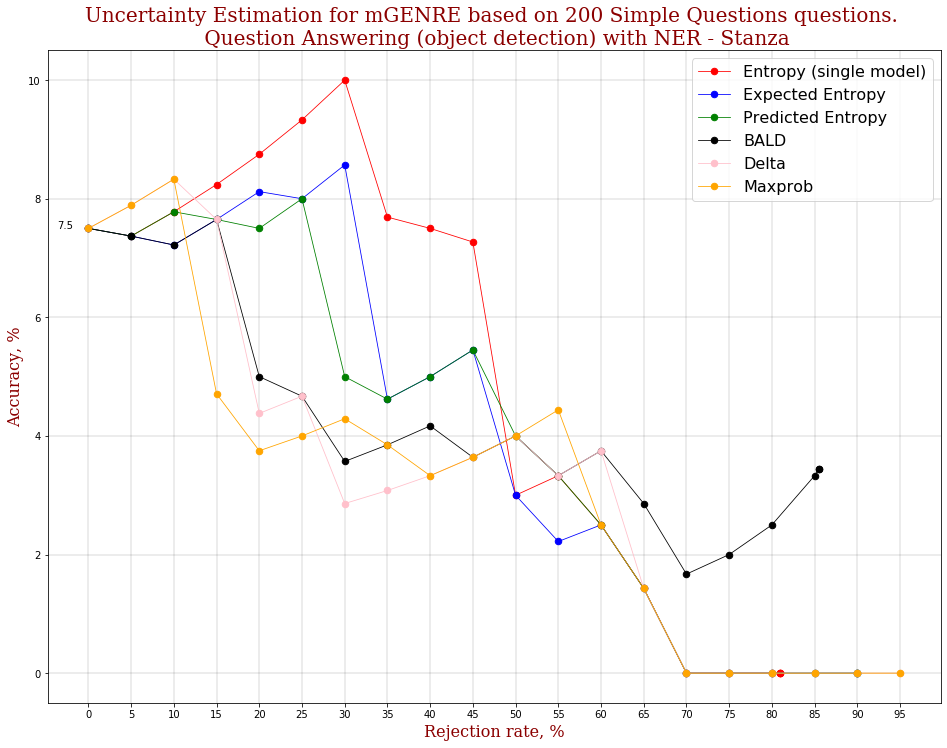

In [60]:
start_time_ue = datetime.now()

T_outs_200_QA_with_NER_as_is = UE_estimate(data = data,
                                        model = model_mGENRE_mcdropout,
                                        number_of_samples = 200,
                                        task='Question Answering (object detection)',
                                        target_col="object",
                                        NER="Stanza")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [61]:
with open('T_outs_200_QA_with_NER_as_is.json', 'w') as fp:
    json.dump(T_outs_200_QA_with_NER_as_is, fp)

# 1. (OBJECT) QA with mGENRE without NER (like experimental point) on Simple Questions as is

Started sampling variants using mGENRE
entropy
threshold =  0.27 	 accuracy =  10.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.40 	 accuracy =  5.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.64 	 accuracy =  6.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.74 	 accuracy =  5.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.85 	 accuracy =  4.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.93 	 accuracy =  5.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.96 	 accuracy =  4.29 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.98 	 accuracy =  3.75 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  1.01 	 accuracy =  3.33 %	 number of observations =  90 	 share of observations =  45.00 %
threshold =  1.05

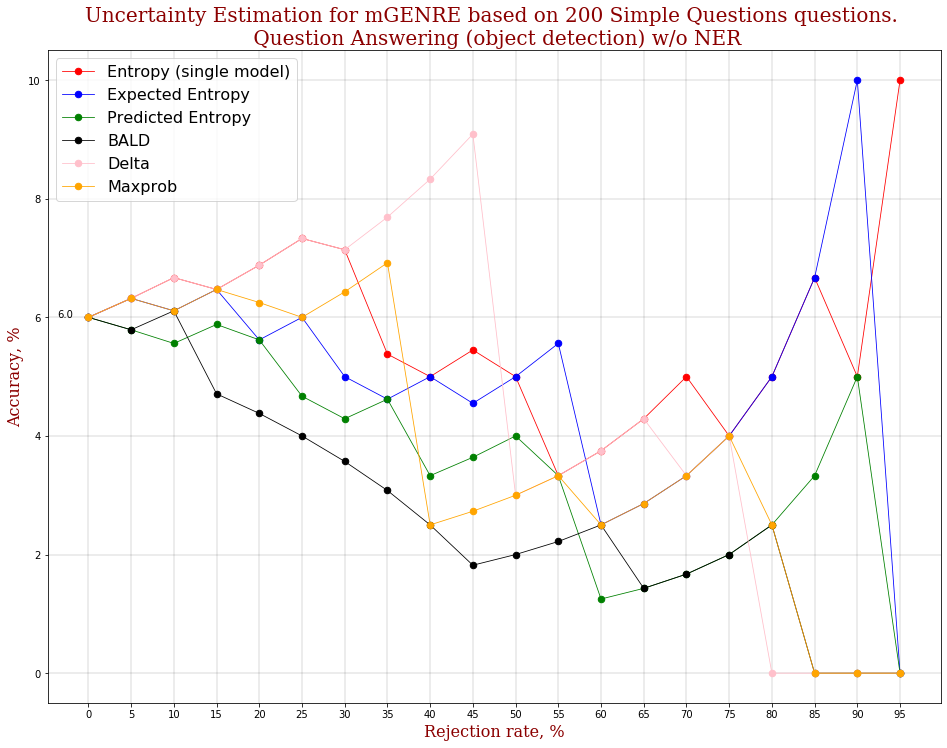

In [62]:
start_time_ue = datetime.now()

T_outs_200_QA_wo_NER = UE_estimate(data = data,
                                    model = model_mGENRE_mcdropout,
                                    number_of_samples = 200,
                                    task='Question Answering (object detection)',
                                    target_col="object",
                                    NER=None)

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [63]:
with open('T_outs_200_QA_wo_NER.json', 'w') as fp:
    json.dump(T_outs_200_QA_wo_NER, fp)

# 2. (SUBJECT) EL with mGENRE without NER (like experimental point) on Simple Questions as is

Started sampling variants using mGENRE
entropy
threshold =  0.27 	 accuracy =  60.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.40 	 accuracy =  55.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.64 	 accuracy =  46.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.74 	 accuracy =  42.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.85 	 accuracy =  42.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.93 	 accuracy =  36.67 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.96 	 accuracy =  31.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.98 	 accuracy =  27.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  1.01 	 accuracy =  25.56 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

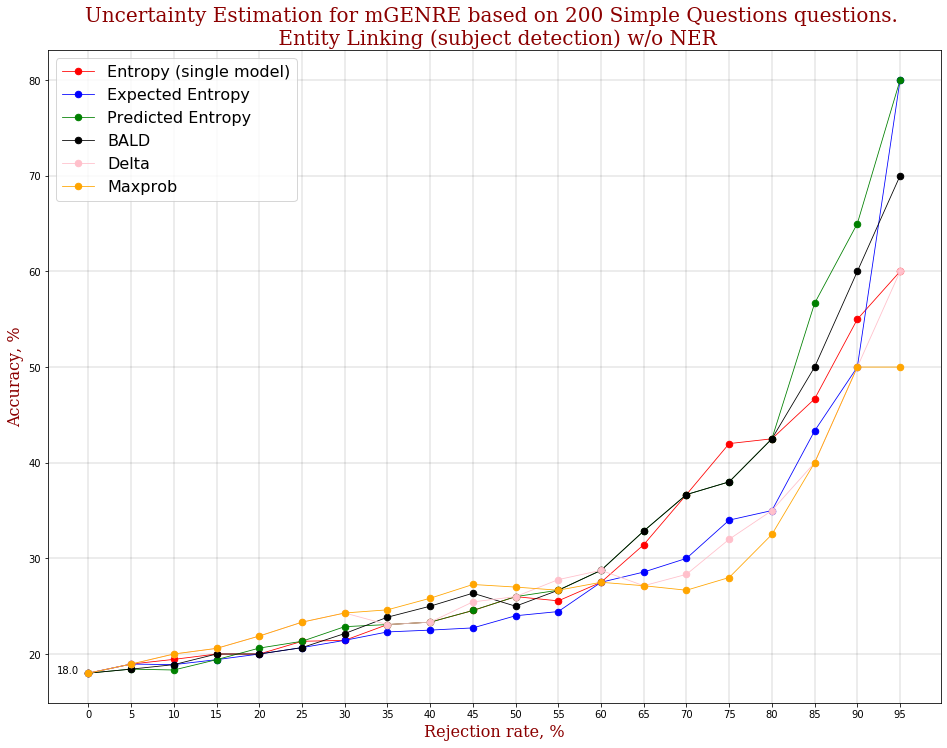

In [64]:
start_time_ue = datetime.now()

T_outs_200_EL_wo_NER_as_is = UE_estimate(data = data,
                                    model = model_mGENRE_mcdropout,
                                    number_of_samples = 200,
                                    task='Entity Linking (subject detection)',
                                    target_col="subject",
                                    NER=None)

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [65]:
with open('T_outs_200_EL_wo_NER_as_is.json', 'w') as fp:
    json.dump(T_outs_200_EL_wo_NER_as_is, fp)

# 3. (SUBJECT) EL with mGENRE with NER Stanza on Simple Questions as is

Started preparing text using NER


100%|██████████| 200/200 [03:59<00:00,  1.20s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  97.37 %	 number of observations =  38 	 share of observations =  19.00 %
threshold =  0.00 	 accuracy =  97.37 %	 number of observations =  38 	 share of observations =  19.00 %
threshold =  0.00 	 accuracy =  97.37 %	 number of observations =  38 	 share of observations =  19.00 %
threshold =  0.00 	 accuracy =  95.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.00 	 accuracy =  92.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.02 	 accuracy =  90.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.05 	 accuracy =  87.14 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.09 	 accuracy =  82.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.17 	 accuracy =  83.33 %	 number of observations =  90 	 share o

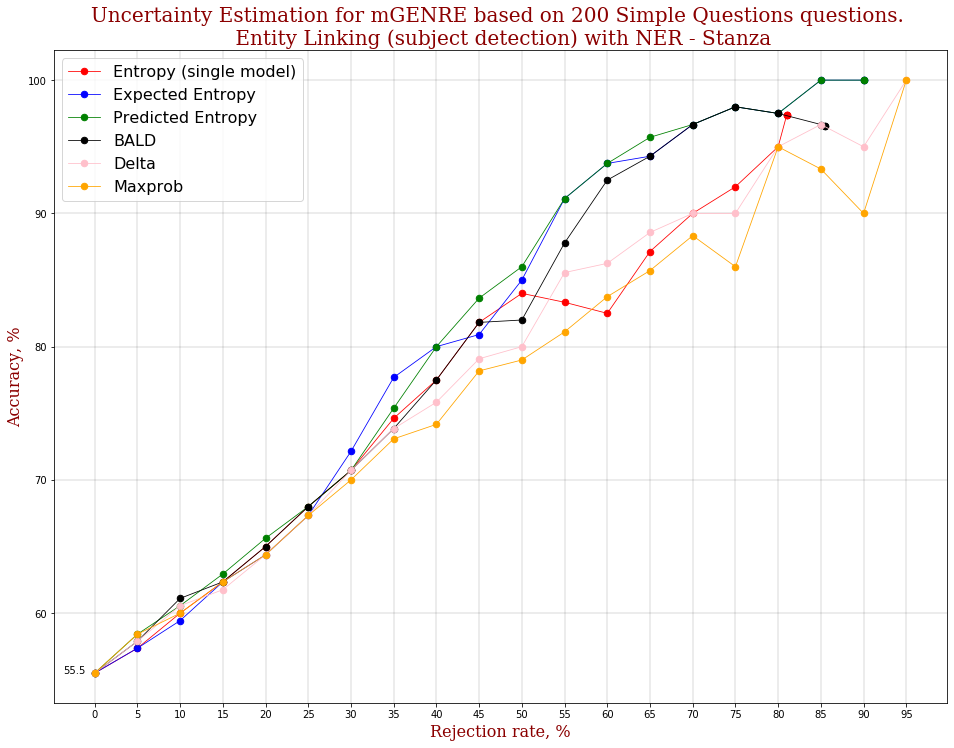

In [66]:
start_time_ue = datetime.now()

T_outs_200_EL_with_NER_as_is = UE_estimate(data = data,
                                    model = model_mGENRE_mcdropout,
                                    number_of_samples = 200,
                                    task='Entity Linking (subject detection)',
                                    target_col="subject",
                                    NER="Stanza")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [67]:
with open('T_outs_200_EL_with_NER_as_is.json', 'w') as fp:
    json.dump(T_outs_200_EL_with_NER_as_is, fp)

# 4. (OBJECT) QA with mGENRE without NER on Simple Questions where only 1 answer

Started sampling variants using mGENRE
entropy
threshold =  0.15 	 accuracy =  0.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.33 	 accuracy =  10.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.52 	 accuracy =  6.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.64 	 accuracy =  5.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.73 	 accuracy =  6.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.79 	 accuracy =  6.67 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.89 	 accuracy =  8.57 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.94 	 accuracy =  10.00 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.98 	 accuracy =  10.00 %	 number of observations =  90 	 share of observations =  45.00 %
threshold =  1.

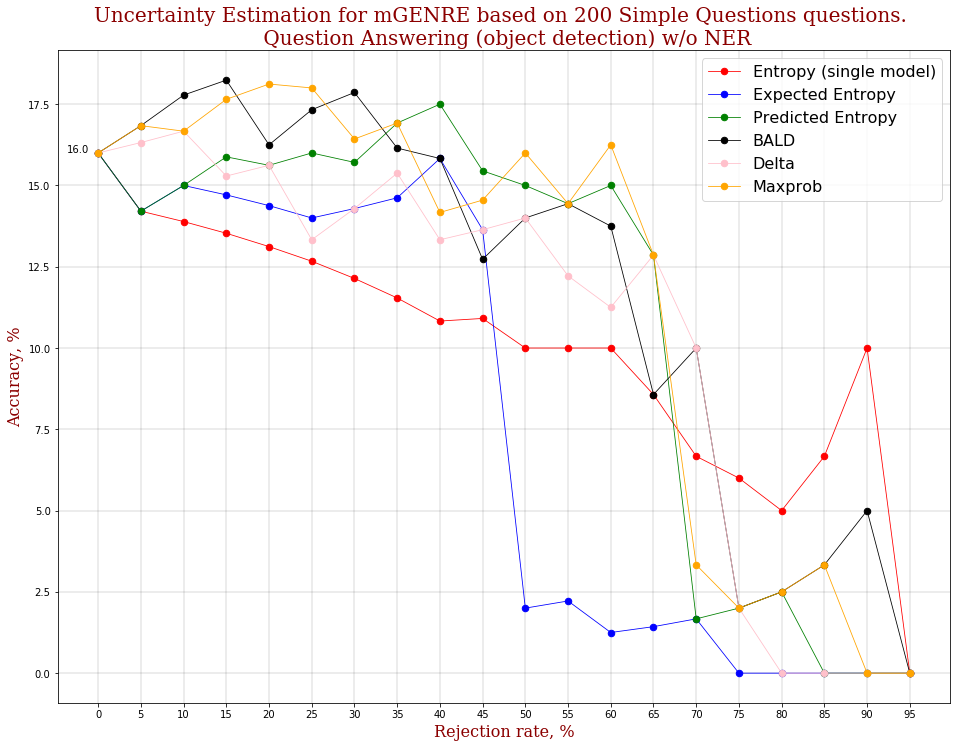

In [68]:
start_time_ue = datetime.now()

T_outs_200_QA_wo_NER_clean = UE_estimate(data = data_clean,
                                    model = model_mGENRE_mcdropout,
                                    number_of_samples = 200,
                                    task='Question Answering (object detection)',
                                    target_col="object",
                                    NER=None)

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [69]:
with open('T_outs_200_QA_wo_NER_clean.json', 'w') as fp:
    json.dump(T_outs_200_QA_wo_NER_clean, fp)

# 5. (OBJECT) QA with mGENRE with NER Stanza on Simple Questions where only 1 answer

Started preparing text using NER


100%|██████████| 200/200 [03:55<00:00,  1.18s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  23 	 share of observations =  11.50 %
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  23 	 share of observations =  11.50 %
threshold =  0.00 	 accuracy =  0.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.03 	 accuracy =  0.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.05 	 accuracy =  0.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.11 	 accuracy =  0.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.18 	 accuracy =  2.86 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.29 	 accuracy =  2.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.37 	 accuracy =  2.22 %	 number of observations =  90 	 share of observa

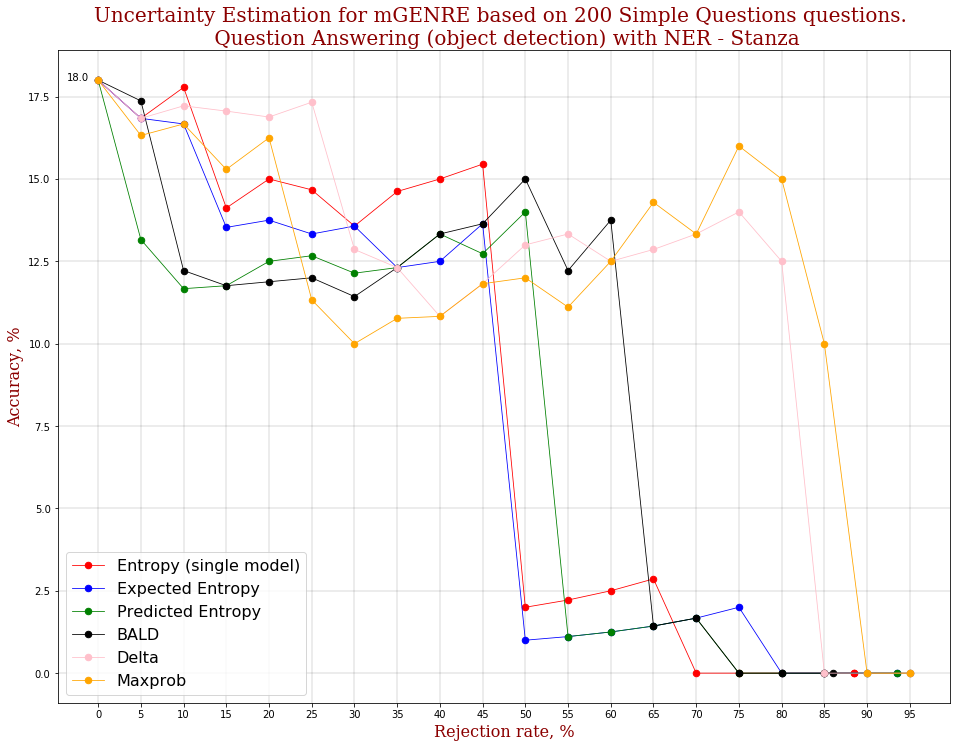

In [70]:
start_time_ue = datetime.now()

T_outs_200_QA_with_NER_clean = UE_estimate(data = data_clean,
                                    model = model_mGENRE_mcdropout,
                                    number_of_samples = 200,
                                    task='Question Answering (object detection)',
                                    target_col="object",
                                    NER="Stanza")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [71]:
with open('T_outs_200_QA_with_NER_clean.json', 'w') as fp:
    json.dump(T_outs_200_QA_with_NER_clean, fp)

# 6. (SUBJECT) EL with mGENRE without NER on Simple Questions where only 1 answer

Started sampling variants using mGENRE
entropy
threshold =  0.15 	 accuracy =  10.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.33 	 accuracy =  20.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.52 	 accuracy =  30.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.64 	 accuracy =  25.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.73 	 accuracy =  22.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.79 	 accuracy =  18.33 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.89 	 accuracy =  18.57 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.94 	 accuracy =  16.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.98 	 accuracy =  14.44 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

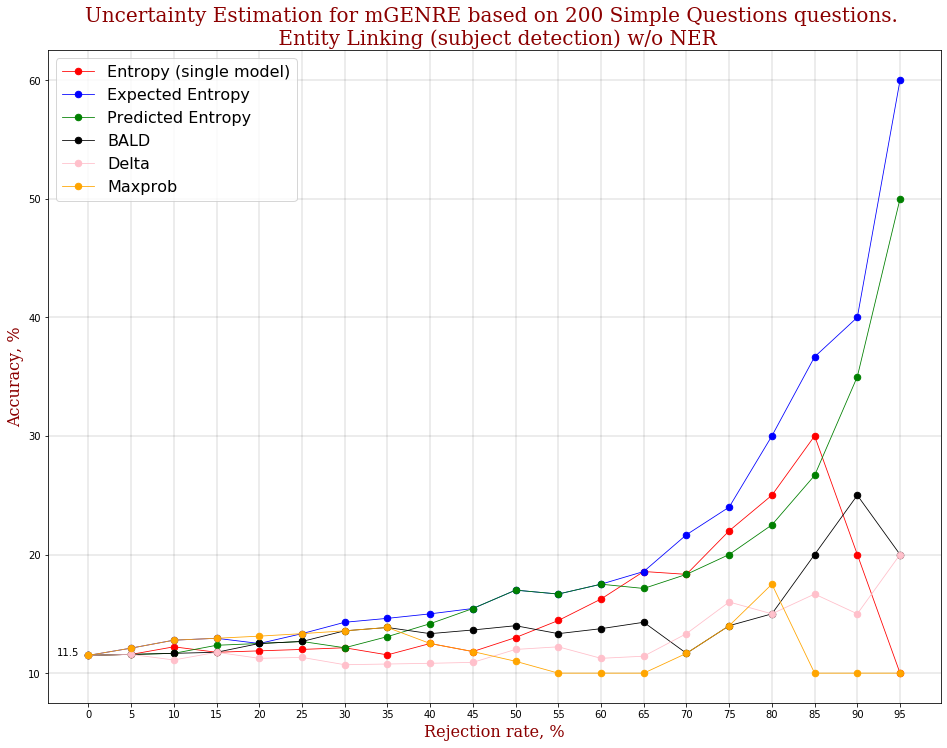

In [72]:
start_time_ue = datetime.now()

T_outs_200_EL_wo_NER_clean = UE_estimate(data = data_clean,
                                         model = model_mGENRE_mcdropout,
                                         number_of_samples = 200,
                                         task='Entity Linking (subject detection)',
                                         target_col="subject",
                                         NER=None)

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [73]:
with open('T_outs_200_EL_wo_NER_clean.json', 'w') as fp:
    json.dump(T_outs_200_EL_wo_NER_clean, fp)

# 7. (SUBJECT) EL with mGENRE with NER Stanza on Simple Questions where only 1 answer

Started preparing text using NER


100%|██████████| 200/200 [03:51<00:00,  1.16s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  78.26 %	 number of observations =  23 	 share of observations =  11.50 %
threshold =  0.00 	 accuracy =  78.26 %	 number of observations =  23 	 share of observations =  11.50 %
threshold =  0.00 	 accuracy =  83.33 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.03 	 accuracy =  85.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.05 	 accuracy =  84.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.11 	 accuracy =  85.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.18 	 accuracy =  82.86 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.29 	 accuracy =  81.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.37 	 accuracy =  76.67 %	 number of observations =  90 	 share o

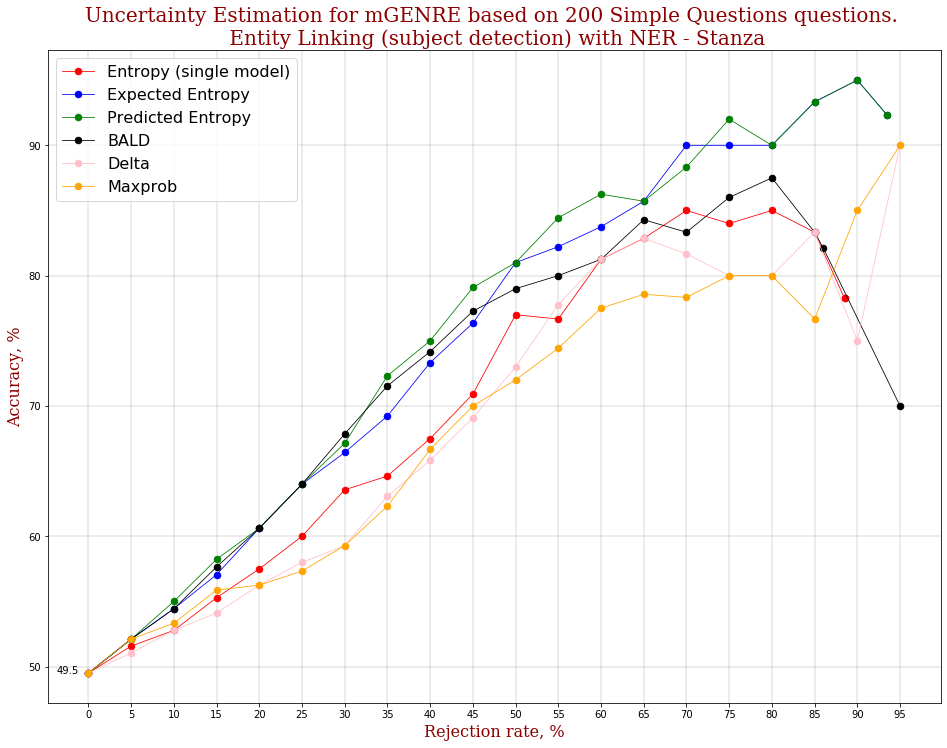

In [74]:
start_time_ue = datetime.now()

T_outs_200_EL_with_NER_clean = UE_estimate(data = data_clean,
                                         model = model_mGENRE_mcdropout,
                                         number_of_samples = 200,
                                         task='Entity Linking (subject detection)',
                                         target_col="subject",
                                         NER="Stanza")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [75]:
with open('T_outs_200_EL_with_NER_clean.json', 'w') as fp:
    json.dump(T_outs_200_EL_with_NER_clean, fp)

# RuBQ 2.0 dataset (add russian language and compare with english)

In [106]:
rubq_2 = pd.read_json("https://raw.githubusercontent.com/vladislavneon/RuBQ/master/RuBQ_2.0/RuBQ_2.0_dev.json")
rubq_2 = rubq_2[["question_text", "question_eng", "question_uris", "question_props", "answers"]]

rubq_2_test = pd.read_json("https://raw.githubusercontent.com/vladislavneon/RuBQ/master/RuBQ_2.0/RuBQ_2.0_test.json")
rubq_2_test = rubq_2_test[["question_text", "question_eng", "question_uris", "question_props", "answers"]]

for i, el in enumerate(pd.Series(rubq_2['question_uris'])):
    q = []
    if el is not None:
        for question in el:
            q.append(question.replace('http://www.wikidata.org/entity/', ''))
        rubq_2['question_uris'][i] = q
    else:
        rubq_2['question_uris'][i] = []

for i, el in enumerate(pd.Series(rubq_2['question_props'])):
    p = []
    if (el is not None) & (el != []):
        for property_ in el:
            if property_[4] == "P":
                p.append(property_.replace('wdt:', ''))
            else: 
                p.append("drop")
                break
                
        rubq_2['question_props'][i] = p
    else:
        rubq_2['question_props'][i] = []
        
total = []
for q, p in zip(rubq_2['question_uris'], rubq_2['question_props']):
    out = []
    if len(q) == len(p):
        for elem in range(len(q)):
            out.append((q[elem], p[elem]))
        total.append(out)
    else:
        total.append("drop")
        
        
rubq_2['query'] = pd.DataFrame(pd.Series(total))

first_part = rubq_2[rubq_2['query'] != 'drop']
answers = []
for answer in first_part['answers']:
    a = []
    for ans in answer:
        a.append(str(ans["value"])[31:])
    answers.append(a)

first_part['answer'] = pd.Series(answers)
first_part = first_part.dropna()
rubq_final = first_part[["question_text", "question_eng", "query", "answer"]]


part_1 = rubq_final
df_1 = part_1[part_1.astype(str)["answer"] != '[]'][:305]

rubq_2 = rubq_2_test

for i, el in enumerate(pd.Series(rubq_2['question_uris'])):
    q = []
    if el is not None:
        for question in el:
            q.append(question.replace('http://www.wikidata.org/entity/', ''))
        rubq_2['question_uris'][i] = q
    else:
        rubq_2['question_uris'][i] = []

for i, el in enumerate(pd.Series(rubq_2['question_props'])):
    p = []
    if (el is not None) & (el != []):
        for property_ in el:
            if property_[4] == "P":
                p.append(property_.replace('wdt:', ''))
            else: 
                p.append("drop")
                break
                
        rubq_2['question_props'][i] = p
    else:
        rubq_2['question_props'][i] = []
        
total = []
for q, p in zip(rubq_2['question_uris'], rubq_2['question_props']):
    out = []
    if len(q) == len(p):
        for elem in range(len(q)):
            out.append((q[elem], p[elem]))
        total.append(out)
    else:
        total.append("drop")
        
        
rubq_2['query'] = pd.DataFrame(pd.Series(total))

first_part = rubq_2[rubq_2['query'] != 'drop']
answers = []
for answer in first_part['answers']:
    a = []
    for ans in answer:
        a.append(str(ans["value"])[31:])
    answers.append(a)

first_part['answer'] = pd.Series(answers)
first_part = first_part.dropna()
rubq_final = first_part[["question_text", "question_eng", "query", "answer"]]
rubq_final.head()

part_2 = rubq_final
df = part_2[(part_2.astype(str)['query'] != '[]') | (part_2.astype(str)['answer'] != '[]') | (part_2.astype(str)['answer'] != '['']')][part_2[(part_2.astype(str)['query'] != '[]') | (part_2.astype(str)['answer'] != '[]') | (part_2.astype(str)['answer'] != '['']')].astype(str)["answer"] != '[]']
df = df[df.astype(str)['answer'].map(lambda x: len(x) > 4)].iloc[:-31,:].drop([680], axis=0)

RuBQ_2_0 = pd.concat([df_1, df], axis = 0)

to_drop = []
for i, query in enumerate(list(RuBQ_2_0["query"])):
    if query == []:
        to_drop.append(i)
    
RuBQ_2_0 = RuBQ_2_0.drop(RuBQ_2_0.index[to_drop], axis =0)
RuBQ_2_0["query"] = [i[0][0] for i in RuBQ_2_0["query"]]
RuBQ_2_0.rename(columns = {"query":"subject", "answer":"object",
                           "question_text":"question_ru", "question_eng":"question_en"}, inplace=True)
RuBQ_2_0 = RuBQ_2_0[["subject", "object", "question_ru", "question_en"]]
RuBQ_2_0 = RuBQ_2_0[RuBQ_2_0.object.apply(lambda x: len(x) == 1)].reset_index(drop = True)
RuBQ_2_0["object"] = [i[0] for i in RuBQ_2_0["object"]]
RuBQ_2_0.head()

,subject,object,question_ru,question_en
0,Q14452,Q298,Какой стране принадлежит знаменитый остров Пасхи?,Which country does the famous Easter island be...
1,Q1229234,Q656,Где находится Летний сад?,Where is the Summer garden?
2,Q874,Q23438,Какой город является столицей Туркмении?,Which city is the capital of Turkmenistan?
3,Q181157,Q96,В какой стране находится второй из самых высок...,Which country has the second highest active vo...
4,Q131120,Q847,В каком виде спорта прославилась Курникова?,In what sport was Kournikova famous?


In [78]:
stanza.download('ru')

## (SUBJECT) RuBQ 2.0. Entity Linking. RUS. w/o NER

Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  90.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.07 	 accuracy =  90.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.20 	 accuracy =  90.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.32 	 accuracy =  77.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.39 	 accuracy =  76.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.50 	 accuracy =  75.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.58 	 accuracy =  75.71 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.62 	 accuracy =  76.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.69 	 accuracy =  71.11 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

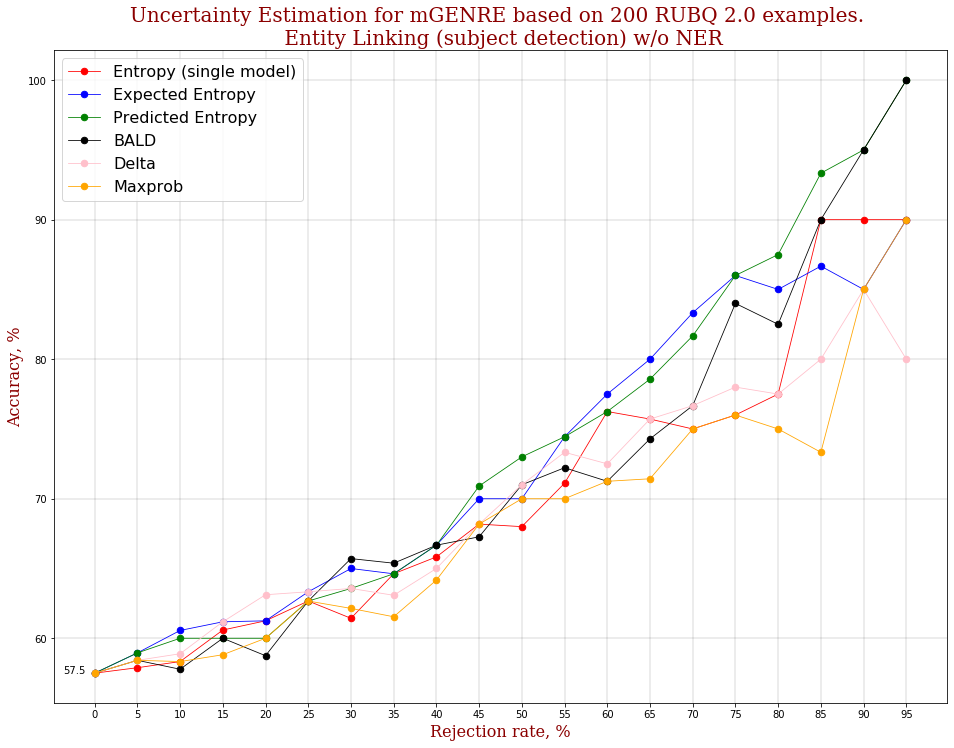

In [90]:
start_time_ue = datetime.now()

rubq_200_EL_without_NER = UE_estimate(data = RuBQ_2_0,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "RUBQ 2.0",
                                      language = "ru")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [91]:
with open('rubq_200_EL_without_NER.json', 'w') as fp:
    json.dump(rubq_200_EL_without_NER, fp)

## (SUBJECT) RuBQ 2.0. Entity Linking. ENG. w/o NER

Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  90.91 %	 number of observations =  11 	 share of observations =  5.50 %
threshold =  0.04 	 accuracy =  80.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.15 	 accuracy =  80.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.21 	 accuracy =  80.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.31 	 accuracy =  78.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.41 	 accuracy =  75.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.52 	 accuracy =  71.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.60 	 accuracy =  70.00 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.64 	 accuracy =  65.56 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

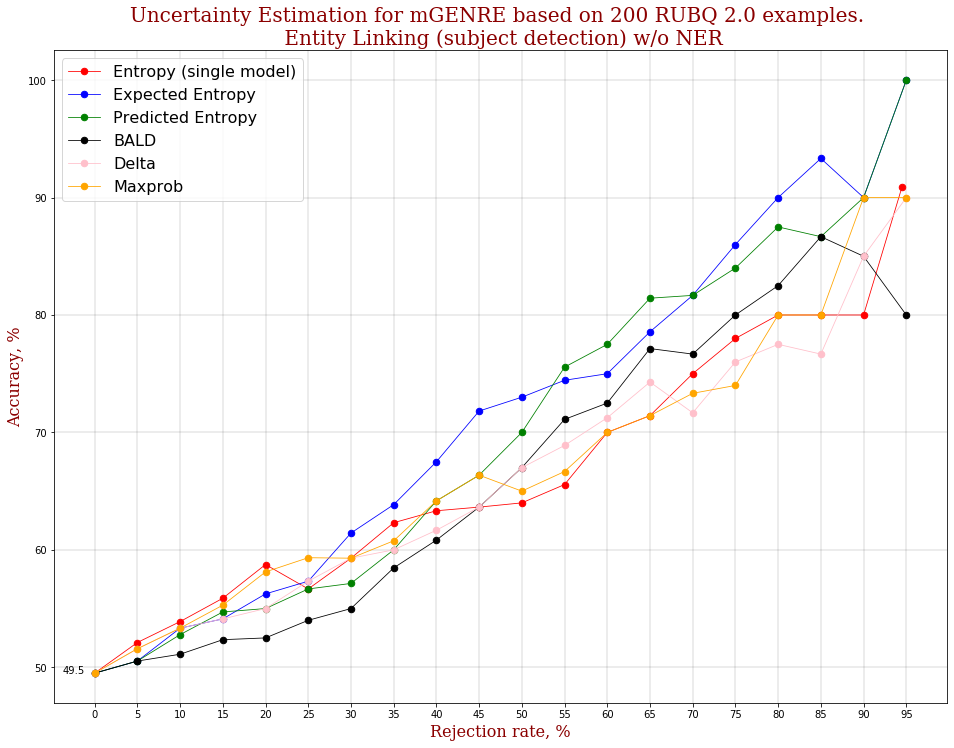

In [93]:
start_time_ue = datetime.now()

rubq_eng_200_EL_without_NER = UE_estimate(data = RuBQ_2_0,
                                          model = model_mGENRE_mcdropout,
                                          number_of_samples = 200,
                                          task='Entity Linking (subject detection)',
                                          target_col = "subject",
                                          NER = None,
                                          dataset = "RUBQ 2.0",
                                          language = "en")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [94]:
with open('rubq_eng_200_EL_without_NER.json', 'w') as fp:
    json.dump(rubq_eng_200_EL_without_NER, fp)

## (SUBJECT) RuBQ 2.0. Entity Linking. RUS. with NER

Started preparing text using NER


100%|██████████| 200/200 [06:38<00:00,  1.99s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  90.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.08 	 accuracy =  80.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.19 	 accuracy =  76.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.29 	 accuracy =  80.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.36 	 accuracy =  76.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.44 	 accuracy =  75.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.55 	 accuracy =  71.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.60 	 accuracy =  71.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.68 	 accuracy =  68.89 %	 number of observations =  90 	 share of

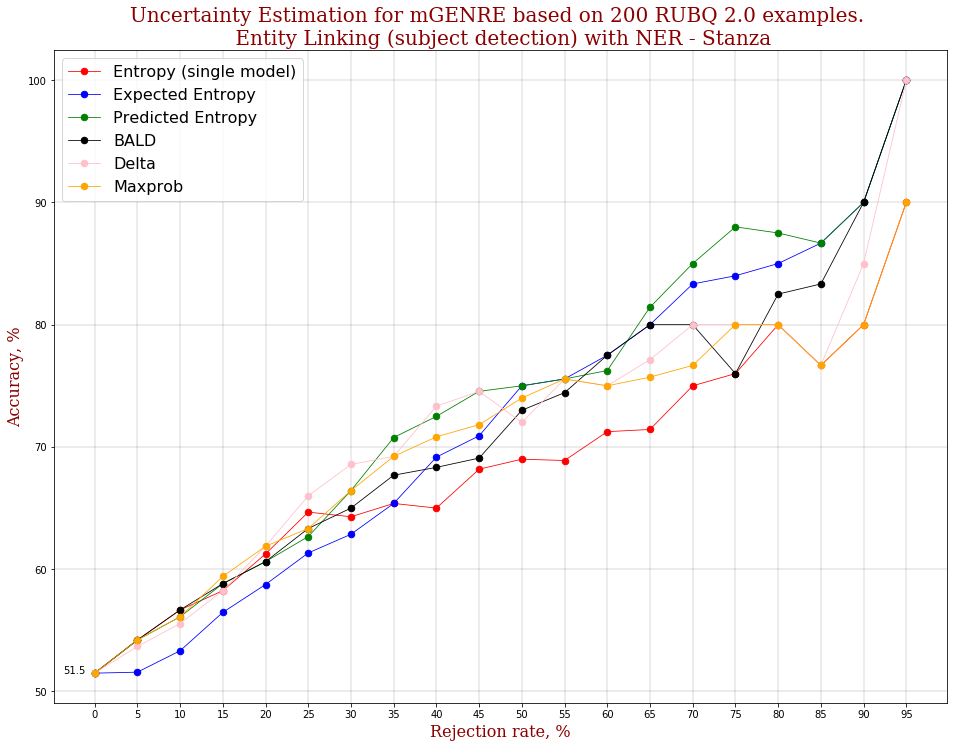

In [111]:
start_time_ue = datetime.now()

rubq_ru_200_EL_with_NER = UE_estimate(data = RuBQ_2_0,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "RUBQ 2.0",
                                      language = "ru")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [112]:
with open('rubq_ru_200_EL_with_NER.json', 'w') as fp:
    json.dump(rubq_ru_200_EL_with_NER, fp)

## (SUBJECT) RuBQ 2.0. Entity Linking. ENG. with NER

Started preparing text using NER


100%|██████████| 200/200 [04:07<00:00,  1.24s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  75.76 %	 number of observations =  33 	 share of observations =  16.50 %
threshold =  0.00 	 accuracy =  75.76 %	 number of observations =  33 	 share of observations =  16.50 %
threshold =  0.00 	 accuracy =  75.76 %	 number of observations =  33 	 share of observations =  16.50 %
threshold =  0.04 	 accuracy =  77.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.15 	 accuracy =  72.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.29 	 accuracy =  70.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.38 	 accuracy =  68.57 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.44 	 accuracy =  66.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.50 	 accuracy =  65.56 %	 number of observations =  90 	 share o

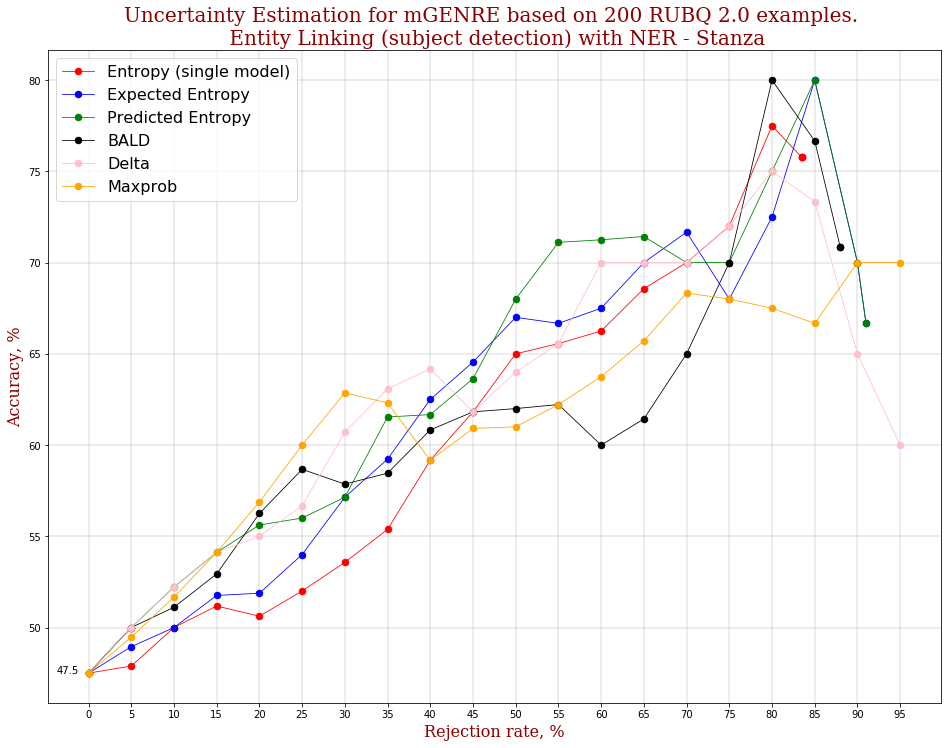

In [97]:
start_time_ue = datetime.now()

rubq_eng_200_EL_with_NER = UE_estimate(data = RuBQ_2_0,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "RUBQ 2.0",
                                      language = "en")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [98]:
with open('rubq_eng_200_EL_with_NER.json', 'w') as fp:
    json.dump(rubq_eng_200_EL_with_NER, fp)

# Mewsli-9 experiments

In [39]:
import gdown
import bz2
import pandas as pd

In [100]:
!gdown "1vMtRYwURuHMHq7Qirg9v3VEB-y2MYdLy"

Downloading...
From: https://drive.google.com/uc?id=1vMtRYwURuHMHq7Qirg9v3VEB-y2MYdLy
To: /home/petrakov/mGENRE_MEL/dataset.zip
100%|████████████████████████████████████████| 210M/210M [00:02<00:00, 79.2MB/s]


In [101]:
!unzip dataset.zip

Archive:  dataset.zip
   creating: dataset/
   creating: dataset/ar/
   creating: dataset/ar/wiki/
  inflating: dataset/ar/wiki/ar-8815  
  inflating: dataset/ar/wiki/ar-10209  
  inflating: dataset/ar/wiki/ar-16450  
  inflating: dataset/ar/wiki/ar-35436  
  inflating: dataset/ar/wiki/ar-14630  
  inflating: dataset/ar/wiki/ar-16839  
  inflating: dataset/ar/wiki/ar-11557  
  inflating: dataset/ar/wiki/ar-6122  
  inflating: dataset/ar/wiki/ar-11290  
  inflating: dataset/ar/wiki/ar-8029  
  inflating: dataset/ar/wiki/ar-13744  
  inflating: dataset/ar/wiki/ar-36615  
  inflating: dataset/ar/wiki/ar-36178  
  inflating: dataset/ar/wiki/ar-36703  
  inflating: dataset/ar/wiki/ar-11561  
  inflating: dataset/ar/wiki/ar-6333  
  inflating: dataset/ar/wiki/ar-11476  
  inflating: dataset/ar/wiki/ar-35362  
  inflating: dataset/ar/wiki/ar-37453  
  inflating: dataset/ar/wiki/ar-17857  
  inflating: dataset/ar/wiki/ar-17851  
  inflating: dataset/ar/wiki/ar-38344  
  inflating: dataset/ar/w

## Deutsch

In [463]:
%cd $init_dir

/home/petrakov/mGENRE_MEL


In [464]:
%cd dataset/de

mentions_de = pd.read_csv("mentions.tsv", sep = '\t')
mentions_de = mentions_de[:500]

/home/petrakov/mGENRE_MEL/dataset/de


In [465]:
sentences = []
for i, doc in enumerate(mentions_de["docid"]):
    with open("text/{}".format(doc), "r") as f:
        file = f.read()
        
    file = file.replace("\n", " ").replace("\xa0", "")
    file = file.replace("_", " ")
    file = file.replace("\n", " ")
    
    pos = mentions_de.loc[i, "position"]
    length = mentions_de.loc[i, "length"]
    sentence = file[pos-25:pos+length+25]
    sentences.append(sentence)
    

In [466]:
mentions_de['question'] = sentences
mentions_de.rename(columns = {"qid":"subject"}, inplace = True)
mentions_de = mentions_de[["subject", "question"]]
mentions_de

,subject,question
0,Q8826,holverbot am Ballermann Palma de Mallorca (Sp...
1,Q29,"mann Palma de Mallorca (Spanien), 15.06.2012 ..."
2,Q273296,für das Eimersaufen von Sangria. Damit soll j...
3,Q43070,"schleppt und verprügelt Donezk (Ukraine), 16...."
4,Q212,"und verprügelt Donezk (Ukraine), 16.06.2012 ..."
...,...,...
495,Q668,"sche Fischer Neu-Delhi (Indien), 19.07.2012 –..."
496,Q987,"des Außenministeriums in Neu-Delhi erklärte, d..."
497,Q1519,indische Botschafter in Abu Dhabi die Behörde...
498,Q878,u Dhabi die Behörden der Vereinigten Arabische...


## (SUBJECT) Mewsli9 (Deutsch). Entity Linking. w/o NER

In [467]:
stanza.download('de')

Started sampling variants using mGENRE
entropy
threshold =  0.12 	 accuracy =  60.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.28 	 accuracy =  60.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.39 	 accuracy =  60.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.49 	 accuracy =  57.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.62 	 accuracy =  56.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.69 	 accuracy =  53.33 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.73 	 accuracy =  54.29 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.83 	 accuracy =  55.00 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.87 	 accuracy =  53.33 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

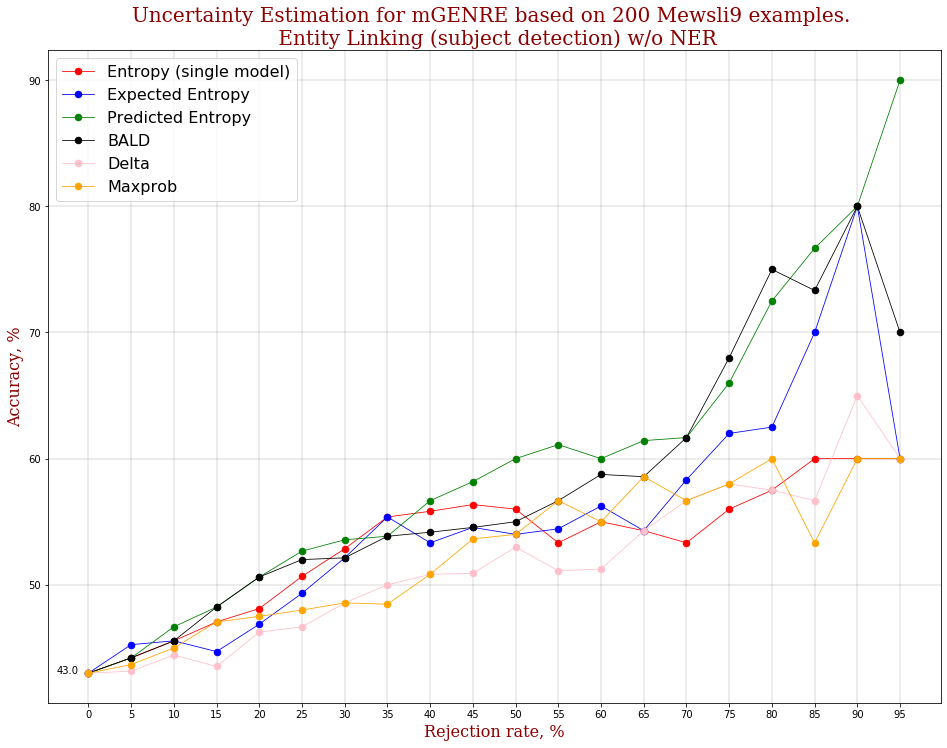

In [116]:
start_time_ue = datetime.now()

mewsli_de_200_EL_wo_NER = UE_estimate(data = mentions_de,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "de")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [117]:
with open('mewsli_de_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_de_200_EL_wo_NER, fp)

## (SUBJECT) Mewsli9 (Deutsch). Entity Linking. with NER

Started preparing text using NER


100%|██████████| 200/200 [06:41<00:00,  2.01s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  75.76 %	 number of observations =  33 	 share of observations =  16.50 %
threshold =  0.00 	 accuracy =  75.76 %	 number of observations =  33 	 share of observations =  16.50 %
threshold =  0.00 	 accuracy =  75.76 %	 number of observations =  33 	 share of observations =  16.50 %
threshold =  0.01 	 accuracy =  75.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.10 	 accuracy =  70.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.18 	 accuracy =  70.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.26 	 accuracy =  70.00 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.33 	 accuracy =  68.75 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.46 	 accuracy =  66.67 %	 number of observations =  90 	 share o

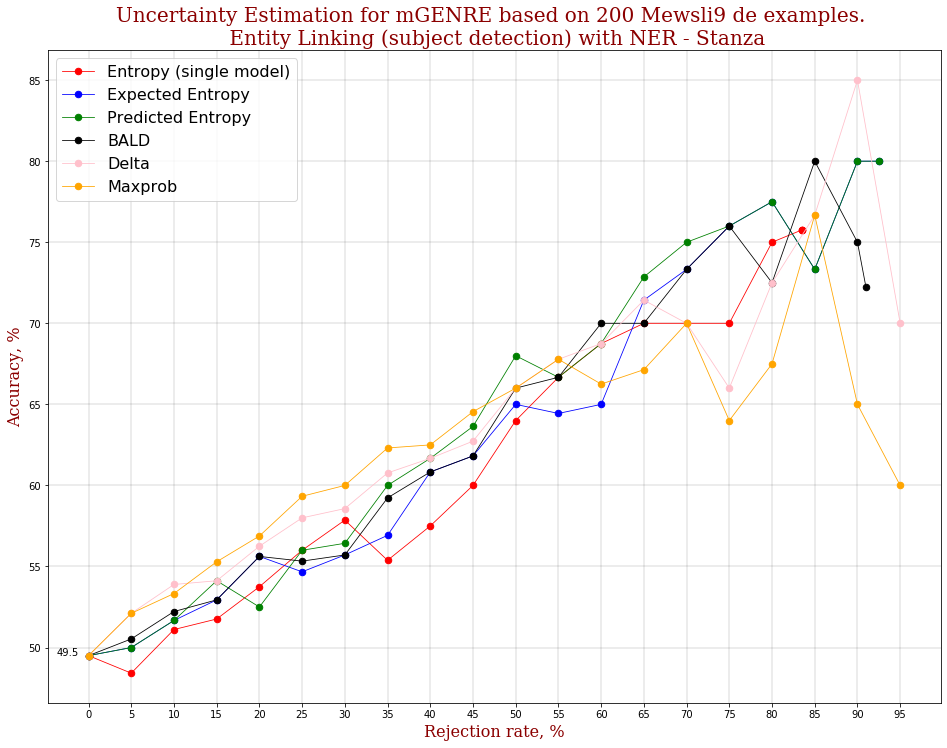

In [120]:
start_time_ue = datetime.now()

mewsli_de_200_EL_with_NER = UE_estimate(data = mentions_de,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "Mewsli9",
                                      language = "de")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [121]:
with open('mewsli_de_200_EL_with_NER.json', 'w') as fp:
    json.dump(mewsli_de_200_EL_with_NER, fp)

## Espanol

In [41]:
%cd $init_dir/dataset/es

stanza.download('es')

def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_es = get_data_from_mewsli9()
mentions_es.head()

/home/petrakov/mGENRE_MEL/dataset/es


2022-07-21 23:56:05 INFO: Downloading default packages for language: es (Spanish)...
2022-07-21 23:56:06 INFO: File exists: /home/petrakov/stanza_resources/es/default.zip
2022-07-21 23:56:11 INFO: Finished downloading models and saved to /home/petrakov/stanza_resources.


,subject,question
0,Q15090,"27 de noviembre de 2017 Lérida, Cataluña, Esp..."
1,Q29,"2017 Lérida, Cataluña, España — Un grupo de ..."
2,Q15090,el Col·legi Lestonnac de Lérida han denunciado...
3,Q1825410,n pelotas de goma de los antidisturbios dentro...
4,Q1835391,"eclaraciones que recoge ""Públic"", el director ..."


## (SUBJECT) Mewsli9 (Espanol). Entity Linking. without NER

Started sampling variants using mGENRE
entropy
threshold =  0.01 	 accuracy =  60.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.15 	 accuracy =  55.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.24 	 accuracy =  60.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.39 	 accuracy =  57.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.53 	 accuracy =  52.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.57 	 accuracy =  48.33 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.62 	 accuracy =  51.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.70 	 accuracy =  53.75 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.77 	 accuracy =  51.11 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

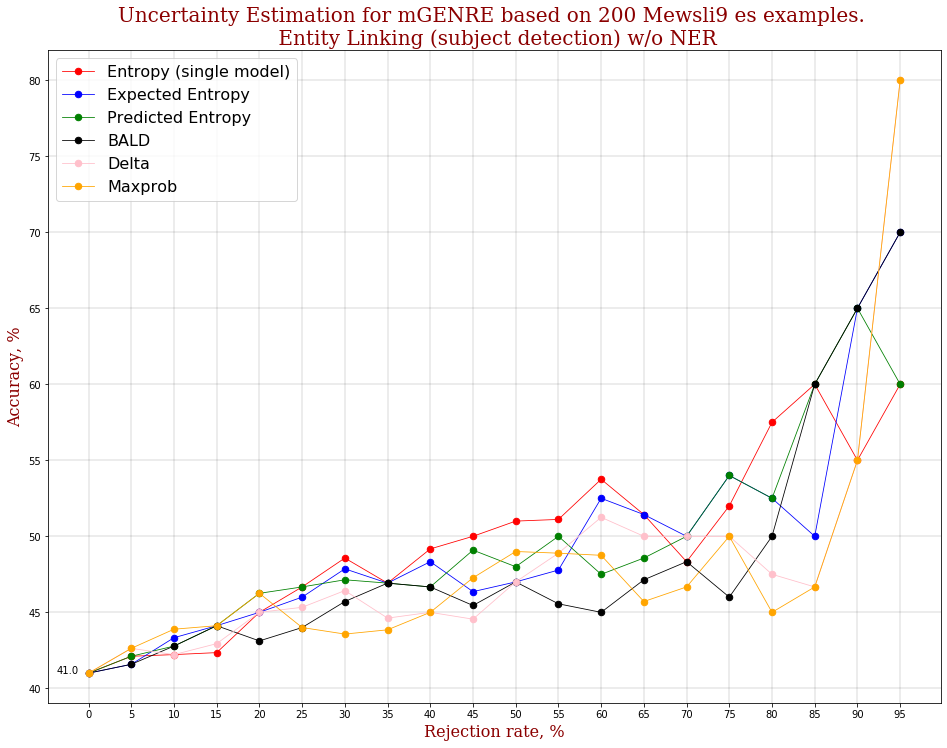

In [123]:
start_time_ue = datetime.now()

mewsli_es_200_EL_without_NER = UE_estimate(data = mentions_es,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "es")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [124]:
with open('mewsli_es_200_EL_without_NER.json', 'w') as fp:
    json.dump(mewsli_es_200_EL_without_NER, fp)

## (SUBJECT) Mewsli9 (Espanol). Entity Linking. with NER

Started preparing text using NER


100%|██████████| 200/200 [06:26<00:00,  1.93s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  46.67 %	 number of observations =  15 	 share of observations =  7.50 %
threshold =  0.02 	 accuracy =  40.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.08 	 accuracy =  36.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.15 	 accuracy =  35.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.24 	 accuracy =  36.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.39 	 accuracy =  35.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.48 	 accuracy =  37.14 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.58 	 accuracy =  35.00 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.63 	 accuracy =  33.33 %	 number of observations =  90 	 share of

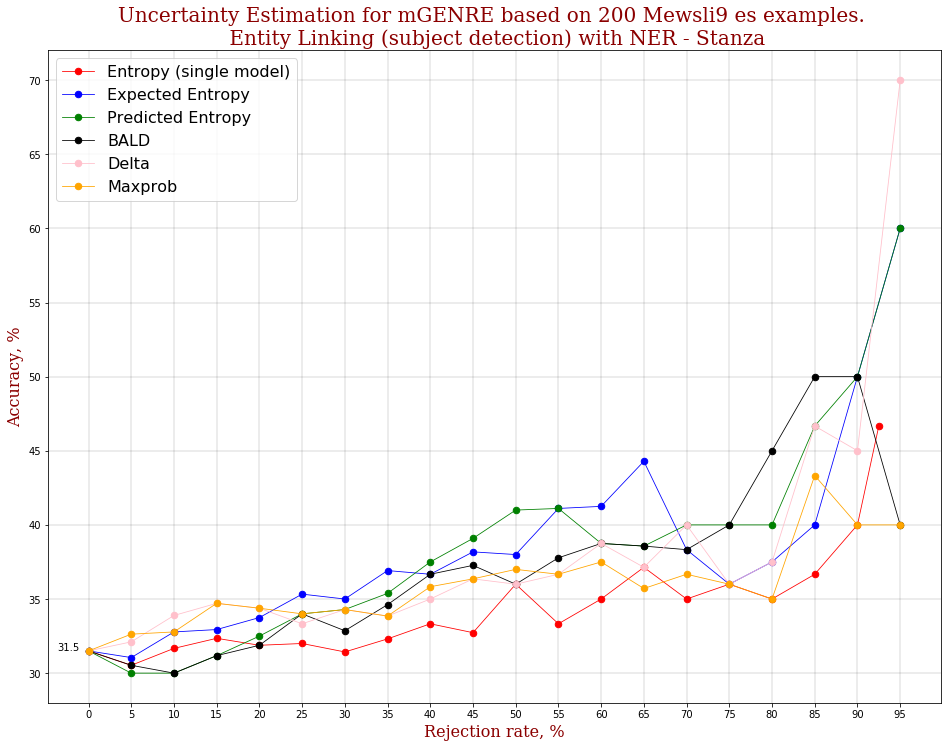

In [42]:
start_time_ue = datetime.now()

mewsli_es_200_EL_with_NER = UE_estimate(data = mentions_es,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "Mewsli9",
                                      language = "es")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [43]:
with open('mewsli_es_200_EL_with_NER.json', 'w') as fp:
    json.dump(mewsli_es_200_EL_with_NER, fp)

# Japanese

In [44]:
%cd $init_dir/dataset/ja

stanza.download('ja')

def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_ja = get_data_from_mewsli9()
mentions_ja.head()

/home/petrakov/mGENRE_MEL/dataset/ja


,subject,question
0,Q2813313,、プロ編入制度創設 【2006年5月29日】 日本将棋連盟は5月26日に東京都渋谷区で開...
1,Q193638,年5月29日】 日本将棋連盟は5月26日に東京都渋谷区で開かれた通常総会でプロ編入制度導入...
2,Q12680196,ついての票決を行い、アマチュア・女流棋士に対して、新進棋士奨励会に入会せず編入試験を行うこと...
3,Q11446505,10勝以上の結果をあげ、6割5分以上のアマチュア、女流棋士が対象。棋士との5番勝負による編入...
4,Q11538947,をあげ、6割5分以上のアマチュア、女流棋士が対象。棋士との5番勝負による編入試験を行い3勝2...


## (SUBJECT) Mewsli9 (Japanese). Entity Linking. without NER

Started sampling variants using mGENRE
entropy
threshold =  0.47 	 accuracy =  70.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.74 	 accuracy =  55.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.92 	 accuracy =  46.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  1.00 	 accuracy =  42.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  1.07 	 accuracy =  44.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  1.12 	 accuracy =  41.67 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  1.17 	 accuracy =  41.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  1.20 	 accuracy =  40.00 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  1.26 	 accuracy =  41.11 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

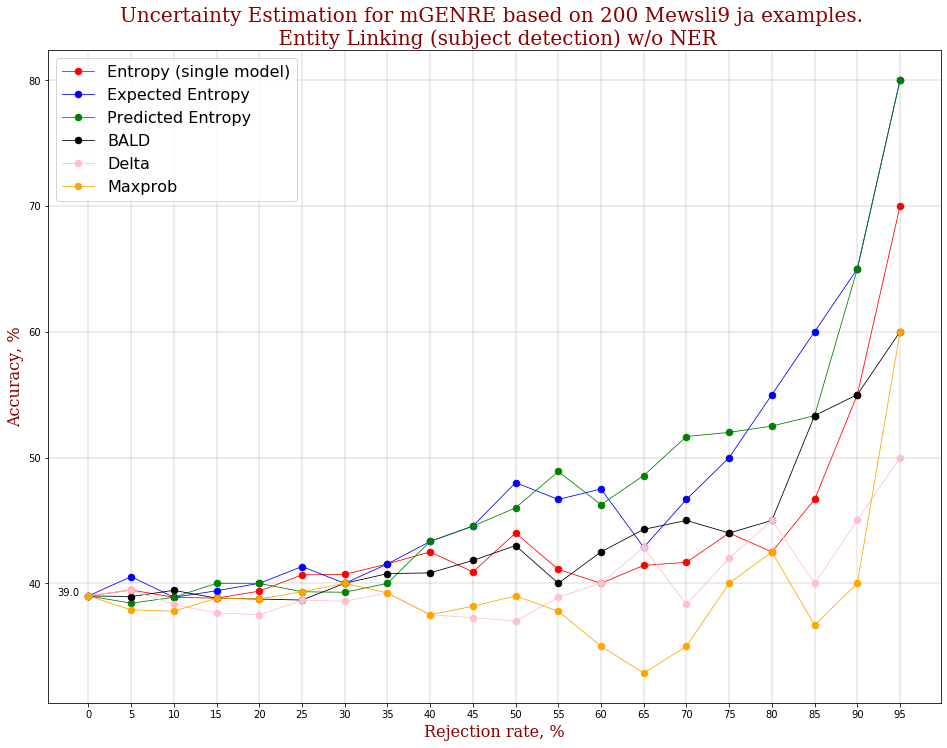

In [45]:
start_time_ue = datetime.now()

mewsli_ja_200_EL_wo_NER = UE_estimate(data = mentions_ja,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "ja")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [46]:
with open('mewsli_ja_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_ja_200_EL_wo_NER, fp)

## (SUBJECT) Mewsli9 (Japanese). Entity Linking. with NER

Started preparing text using NER


100%|██████████| 200/200 [04:24<00:00,  1.32s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.48 	 accuracy =  50.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.68 	 accuracy =  45.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.86 	 accuracy =  46.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.94 	 accuracy =  45.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  1.04 	 accuracy =  46.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  1.12 	 accuracy =  46.67 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  1.19 	 accuracy =  47.14 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  1.21 	 accuracy =  45.00 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  1.27 	 accuracy =  40.00 %	 number of observations =  90 	 share of

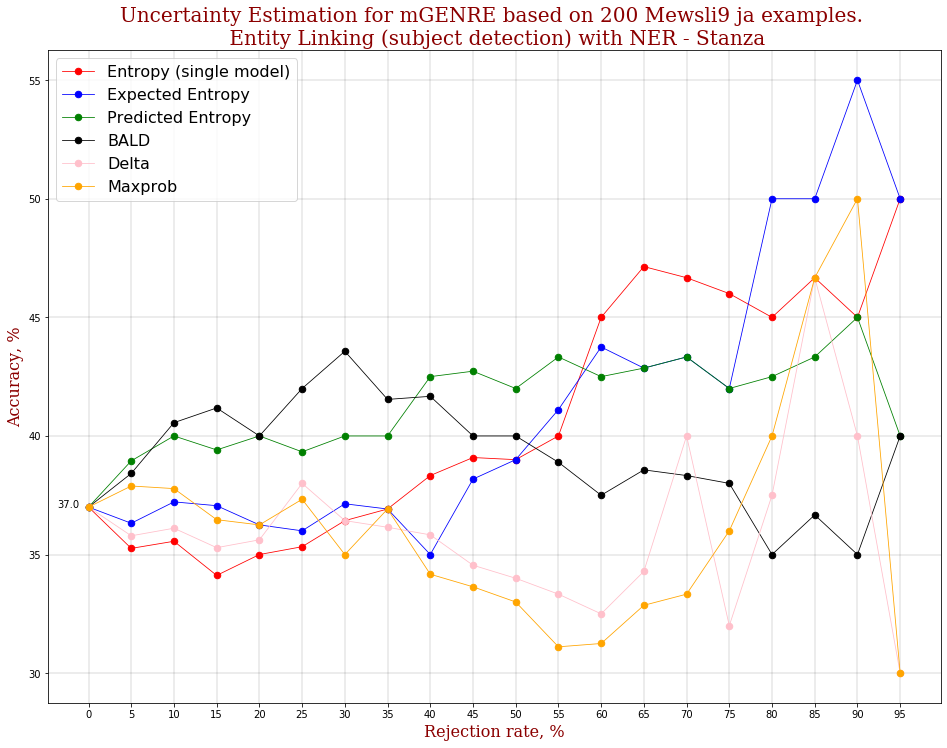

In [47]:
start_time_ue = datetime.now()

mewsli_ja_200_EL_with_NER = UE_estimate(data = mentions_ja,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "Mewsli9",
                                      language = "ja")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [48]:
with open('mewsli_ja_200_EL_with_NER.json', 'w') as fp:
    json.dump(mewsli_ja_200_EL_with_NER, fp)

# English

In [39]:
%cd $init_dir/dataset/en


def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_en = get_data_from_mewsli9()
mentions_en.head()

/home/petrakov/mGENRE_MEL/dataset/en


,subject,question
0,Q7122548,Administration's (NOAA) Pacific Marine Environ...
1,Q58731,"the Pacific Ocean from Baja California, Mexic..."
2,Q43518,"id Richard A. Feely, an oceanographer from the..."
3,Q2,"ns constantly clean the Earth's air, absorbing..."
4,Q1997,rbing 1/3 to 1/2 of the carbon dioxide generat...


Started sampling variants using mGENRE
entropy
threshold =  0.15 	 accuracy =  70.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.26 	 accuracy =  70.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.39 	 accuracy =  70.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.54 	 accuracy =  70.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.68 	 accuracy =  62.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.71 	 accuracy =  58.33 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.82 	 accuracy =  55.71 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.88 	 accuracy =  52.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.96 	 accuracy =  52.22 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

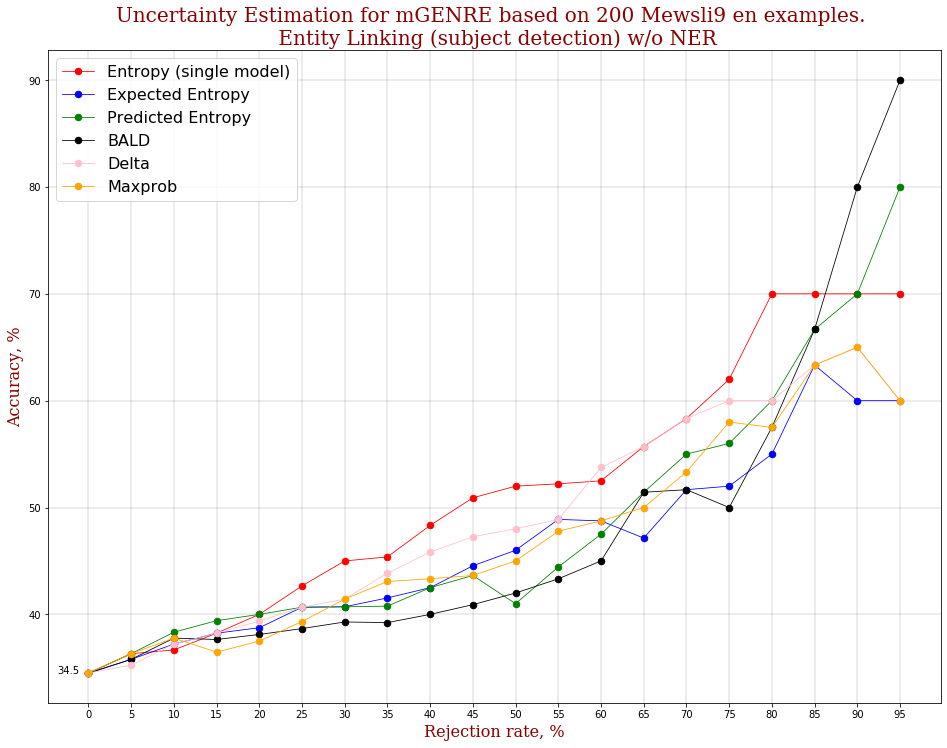

In [50]:
start_time_ue = datetime.now()

mewsli_en_200_EL_wo_NER = UE_estimate(data = mentions_en,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "en")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [51]:
with open('mewsli_en_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_en_200_EL_wo_NER, fp)

Started preparing text using NER


100%|██████████| 200/200 [03:45<00:00,  1.13s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  57.14 %	 number of observations =  21 	 share of observations =  10.50 %
threshold =  0.00 	 accuracy =  57.14 %	 number of observations =  21 	 share of observations =  10.50 %
threshold =  0.04 	 accuracy =  66.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.11 	 accuracy =  62.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.22 	 accuracy =  56.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.32 	 accuracy =  51.67 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.48 	 accuracy =  55.71 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.55 	 accuracy =  56.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.64 	 accuracy =  54.44 %	 number of observations =  90 	 share o

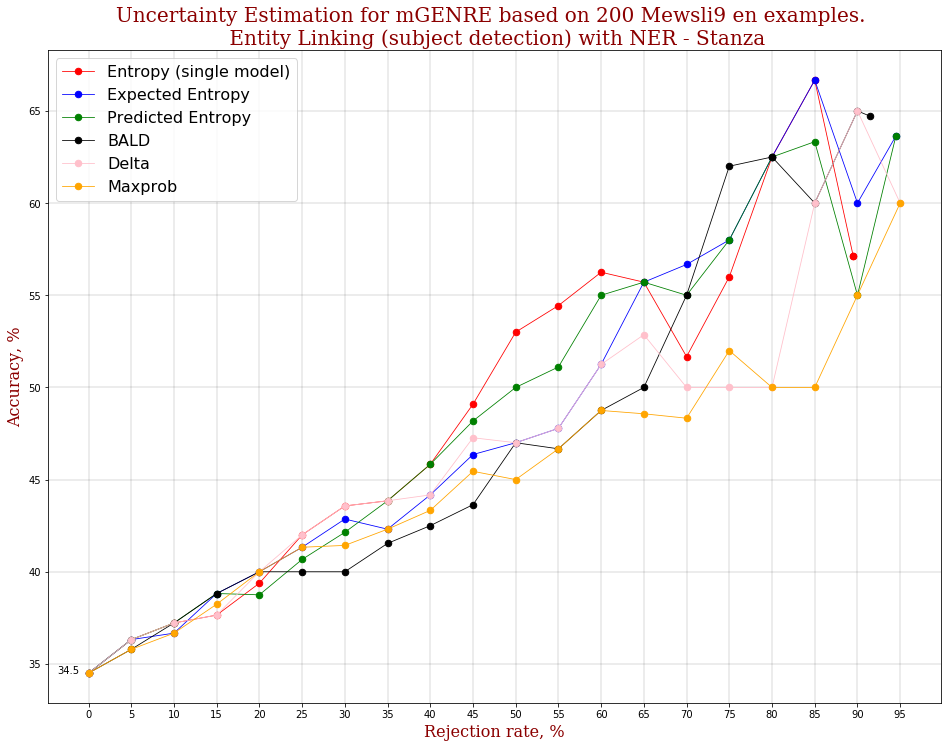

In [40]:
start_time_ue = datetime.now()

mewsli_en_200_EL_with_NER = UE_estimate(data = mentions_en,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "Mewsli9",
                                      language = "en")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [41]:
with open('mewsli_en_200_EL_with_NER.json', 'w') as fp:
    json.dump(mewsli_en_200_EL_with_NER, fp)

# Persian

In [47]:
%cd $init_dir/dataset/fa

stanza.download('fa')

def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_fa = get_data_from_mewsli9()
mentions_fa.head()

/home/petrakov/mGENRE_MEL/dataset/fa


,subject,question
0,Q170040,ر پیوستن علیرضا حقیقی به تیم روبین کازان روسیه...
1,Q7156,ال در دقایق ۴۹ و ۷۷ برای بارسلونا گل زدند و تن...
2,Q8682,رسلونا گل زدند و تنها گل رئال مادرید را رونالد...
3,Q1860,"یی زبان هیسپان تی‌وی (به انگلیسی: ""Hispan TV"")..."
4,Q57373,ی رئیس جمهور پاکستان شد آصف علی زرداری، رهبر ...


Started sampling variants using mGENRE
entropy
threshold =  0.05 	 accuracy =  70.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.21 	 accuracy =  55.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.38 	 accuracy =  53.33 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.51 	 accuracy =  57.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.57 	 accuracy =  52.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.63 	 accuracy =  48.33 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.68 	 accuracy =  48.57 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.72 	 accuracy =  47.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.76 	 accuracy =  50.00 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

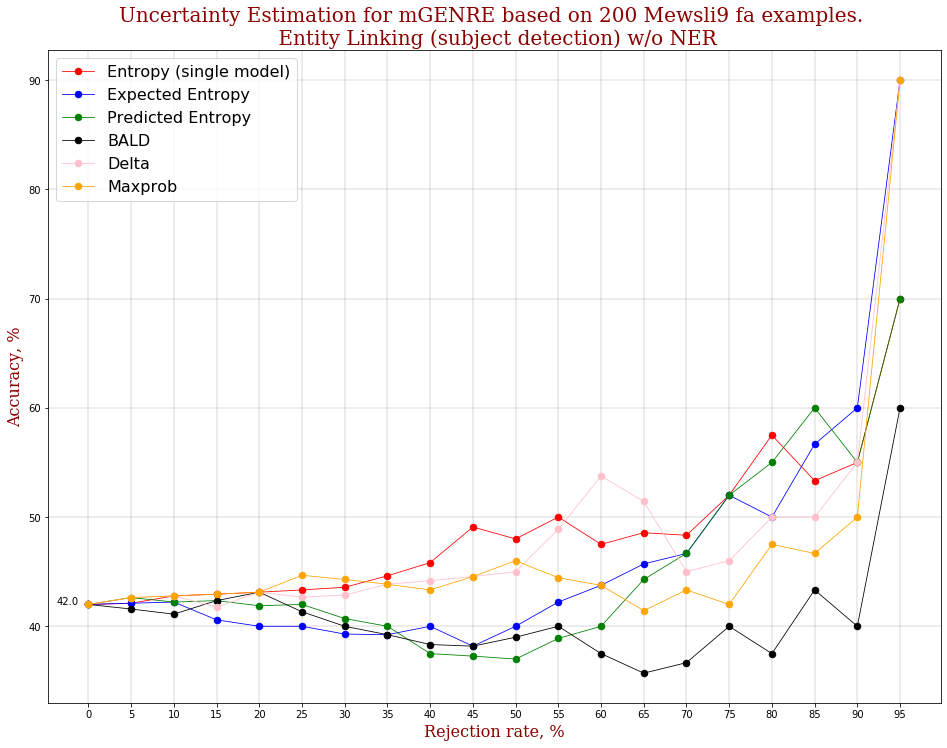

In [48]:
start_time_ue = datetime.now()

mewsli_fa_200_EL_wo_NER = UE_estimate(data = mentions_fa,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "fa")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [49]:
with open('mewsli_fa_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_fa_200_EL_wo_NER, fp)

Started preparing text using NER


100%|██████████| 200/200 [03:40<00:00,  1.10s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  80.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.02 	 accuracy =  70.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.04 	 accuracy =  63.33 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.08 	 accuracy =  57.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.11 	 accuracy =  54.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.15 	 accuracy =  50.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.24 	 accuracy =  54.29 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.30 	 accuracy =  57.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.42 	 accuracy =  56.67 %	 number of observations =  90 	 share of

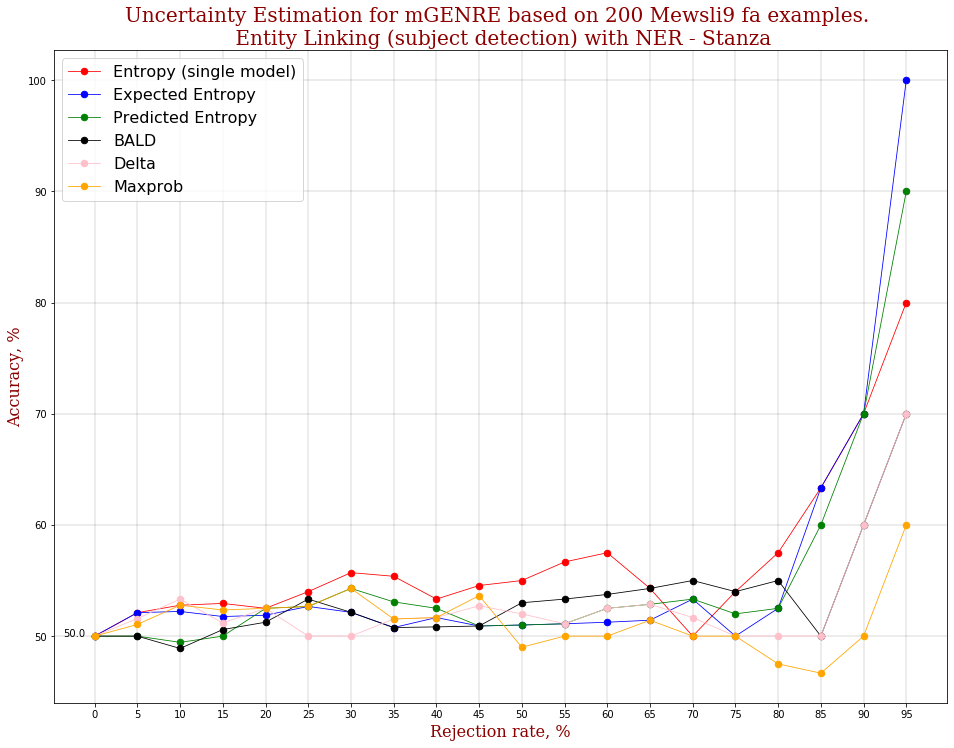

In [50]:
start_time_ue = datetime.now()

mewsli_fa_200_EL_with_NER = UE_estimate(data = mentions_fa,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "Mewsli9",
                                      language = "fa")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [51]:
with open('mewsli_fa_200_EL_with_NER.json', 'w') as fp:
    json.dump(mewsli_fa_200_EL_with_NER, fp)

# Serbian

In [52]:
%cd $init_dir/dataset/sr

stanza.download('sr')

def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_sr = get_data_from_mewsli9()
mentions_sr.head()

/home/petrakov/mGENRE_MEL/dataset/sr


,subject,question
0,Q216,jom 14. септембар 2011. Виљнус/ Литванија (B...
1,Q37,септембар 2011. Виљнус/ Литванија (Beta) - K...
2,Q25270,ovu 15. септембар 2011. Приштина- (Beta) - Ge...
3,Q4115712,EP 15. септембар 2011. Каунас/ Литванија (B...
4,Q37,септембар 2011. Каунас/ Литванија (Beta) - K...


Started sampling variants using mGENRE
entropy
threshold =  0.05 	 accuracy =  50.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.20 	 accuracy =  40.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.29 	 accuracy =  56.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.39 	 accuracy =  62.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.46 	 accuracy =  56.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.51 	 accuracy =  63.33 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.58 	 accuracy =  54.29 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.65 	 accuracy =  56.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.69 	 accuracy =  55.56 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

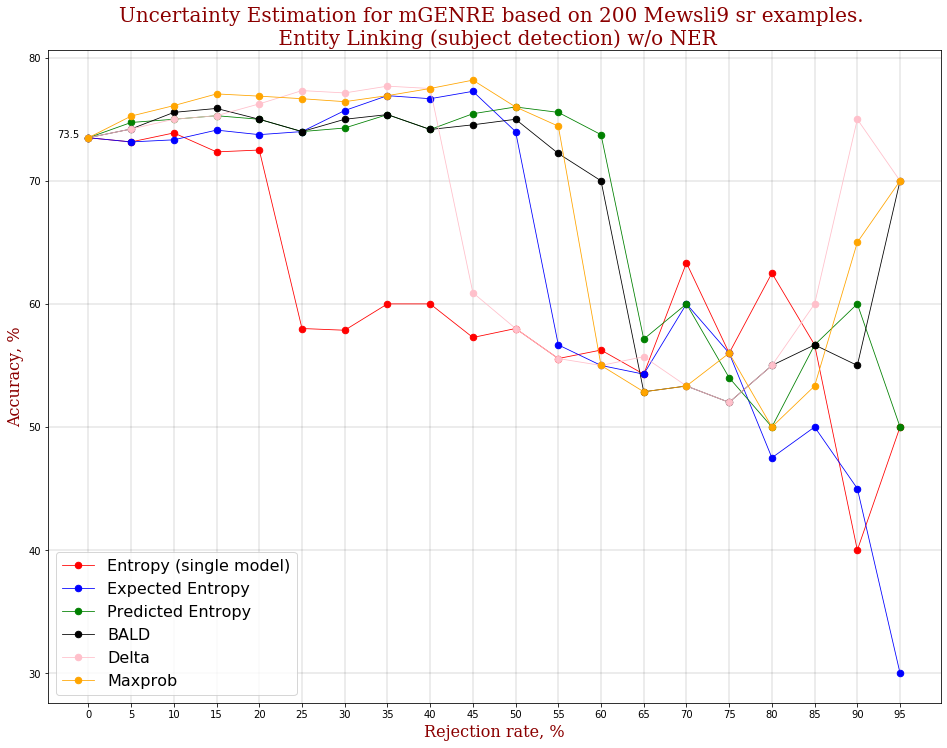

In [53]:
start_time_ue = datetime.now()

mewsli_sr_200_EL_wo_NER = UE_estimate(data = mentions_sr,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "sr")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [54]:
with open('mewsli_sr_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_sr_200_EL_wo_NER, fp)

In [219]:
# start_time_ue = datetime.now()

# mewsli_sr_200_EL_with_NER = UE_estimate(data = mentions_sr,
#                                       model = model_mGENRE_mcdropout,
#                                       number_of_samples = 200,
#                                       task='Entity Linking (subject detection)',
#                                       target_col = "subject",
#                                       NER = "Stanza",
#                                       dataset = "Mewsli9",
#                                       language = "sr")

# end_time_ue = datetime.now()
# print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [220]:
# with open('mewsli_sr_200_EL_with_NER.json', 'w') as fp:
#     json.dump(mewsli_sr_200_EL_with_NER, fp)

# Turkish

In [473]:
%cd $init_dir/dataset/tr

stanza.download('tr')

def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_tr = get_data_from_mewsli9()
mentions_tr.head()

/home/petrakov/mGENRE_MEL/dataset/tr


,subject,question
0,Q43,"nton, sınır komşusu olan Türkiye Cumhuriyeti v..."
1,Q399,n Türkiye Cumhuriyeti ve Ermenistan Cumhuriyet...
2,Q30,"işkin problemler arttı"" Amerika Birleşik Devl..."
3,Q11268,Birleşik Devletleri'nde Amerikan Kongresi tar...
4,Q2002752,niversitelerde uygulanan başörtüsü yasağıyla i...


Started sampling variants using mGENRE
entropy
threshold =  0.01 	 accuracy =  50.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.11 	 accuracy =  50.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.21 	 accuracy =  56.67 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.32 	 accuracy =  52.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.40 	 accuracy =  50.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.47 	 accuracy =  51.67 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.60 	 accuracy =  51.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.66 	 accuracy =  57.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.71 	 accuracy =  57.78 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

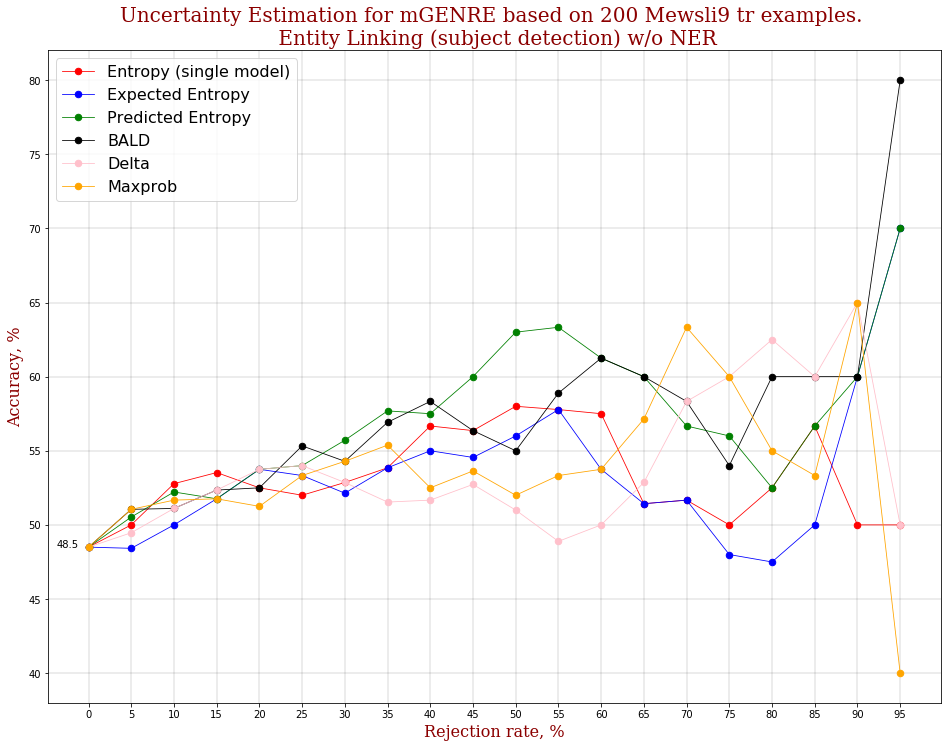

In [60]:
start_time_ue = datetime.now()

mewsli_tr_200_EL_wo_NER = UE_estimate(data = mentions_tr,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "tr")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [61]:
with open('mewsli_tr_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_tr_200_EL_wo_NER, fp)

Started preparing text using NER


100%|██████████| 200/200 [03:39<00:00,  1.10s/it]


Finished preparing text using NER
Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  60.00 %	 number of observations =  15 	 share of observations =  7.50 %
threshold =  0.01 	 accuracy =  45.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.04 	 accuracy =  50.00 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.10 	 accuracy =  57.50 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.14 	 accuracy =  62.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.21 	 accuracy =  60.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.29 	 accuracy =  58.57 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.39 	 accuracy =  56.25 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.48 	 accuracy =  54.44 %	 number of observations =  90 	 share of

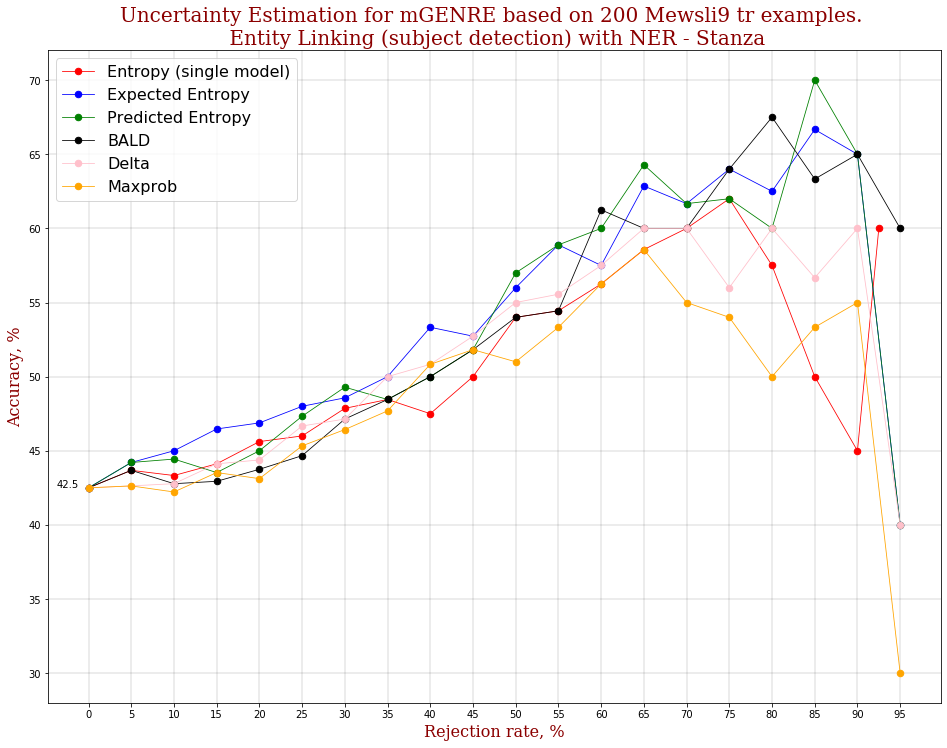

In [62]:
start_time_ue = datetime.now()

mewsli_tr_200_EL_with_NER = UE_estimate(data = mentions_tr,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = "Stanza",
                                      dataset = "Mewsli9",
                                      language = "tr")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [63]:
with open('mewsli_tr_200_EL_with_NER.json', 'w') as fp:
    json.dump(mewsli_tr_200_EL_with_NER, fp)

# Javanese (ta)

In [64]:
%cd $init_dir/dataset/ta

stanza.download('ta')

def get_data_from_mewsli9():

    mentions = pd.read_csv("mentions.tsv", sep = '\t')
    mentions = mentions[:500]

    sentences = []
    for i, doc in enumerate(mentions["docid"]):
        with open("text/{}".format(doc), "r") as f:
            file = f.read()

        file = file.replace("\n", " ").replace("\xa0", "")
        file = file.replace("_", " ")
        file = file.replace("\n", " ")

        pos = mentions.loc[i, "position"]
        length = mentions.loc[i, "length"]
        sentence = file[pos-25:pos+length+25]
        sentences.append(sentence)
    
    mentions['question'] = sentences
    mentions.rename(columns = {"qid":"subject"}, inplace = True)
    mentions = mentions[["subject", "question"]]
    
    return mentions

mentions_ta = get_data_from_mewsli9()
mentions_ta.head()

/home/petrakov/mGENRE_MEL/dataset/ta


,subject,question
0,Q854,்துவர் தேர்தலில் போட்டி இலங்கையில் சென்ற ஆண்ட...
1,Q16311518,இலங்கையில் சென்ற ஆண்டு வன்னியில் இடம்பெற்ற ஈ...
2,Q213394,ண்டு வன்னியில் இடம்பெற்ற ஈழப்போரின் போது போர்க...
3,Q3535349,் வி. சண்முகராஜா என்பவரே ஈரோஸ் என்ற கட்சி சார்...
4,Q80312,கூறியதை மறுத்திருந்தனர். விடுதலைப் புலிகளின் அ...


Started sampling variants using mGENRE
entropy
threshold =  0.00 	 accuracy =  90.00 %	 number of observations =  10 	 share of observations =  5.00 %
threshold =  0.03 	 accuracy =  70.00 %	 number of observations =  20 	 share of observations =  10.00 %
threshold =  0.07 	 accuracy =  63.33 %	 number of observations =  30 	 share of observations =  15.00 %
threshold =  0.16 	 accuracy =  60.00 %	 number of observations =  40 	 share of observations =  20.00 %
threshold =  0.21 	 accuracy =  60.00 %	 number of observations =  50 	 share of observations =  25.00 %
threshold =  0.28 	 accuracy =  60.00 %	 number of observations =  60 	 share of observations =  30.00 %
threshold =  0.38 	 accuracy =  61.43 %	 number of observations =  70 	 share of observations =  35.00 %
threshold =  0.50 	 accuracy =  62.50 %	 number of observations =  80 	 share of observations =  40.00 %
threshold =  0.55 	 accuracy =  61.11 %	 number of observations =  90 	 share of observations =  45.00 %
threshold

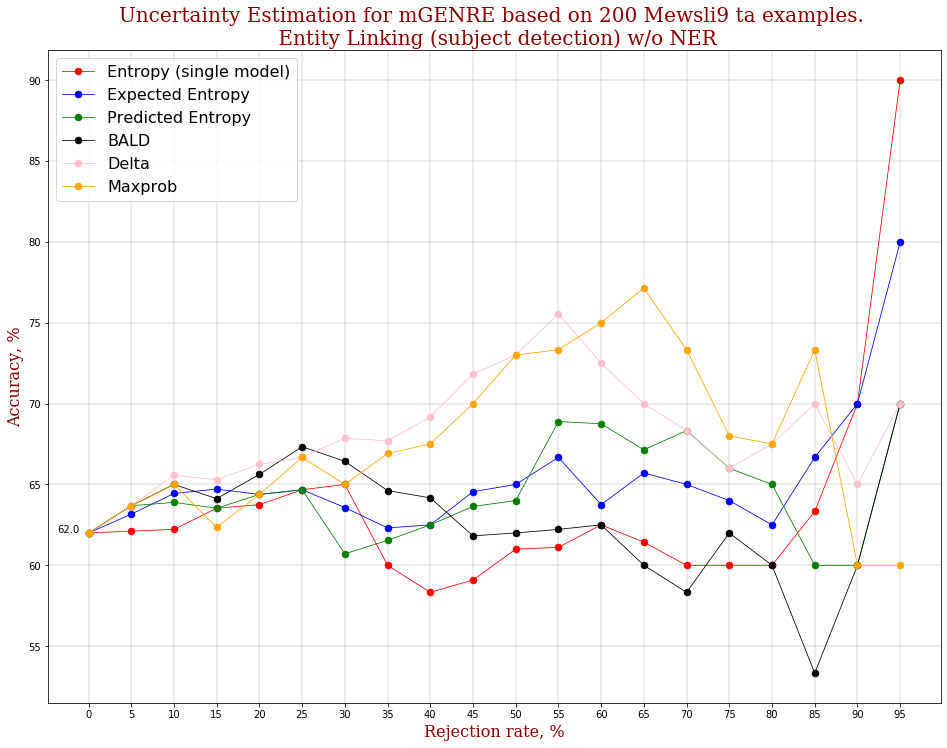

In [65]:
start_time_ue = datetime.now()

mewsli_ta_200_EL_wo_NER = UE_estimate(data = mentions_ta,
                                      model = model_mGENRE_mcdropout,
                                      number_of_samples = 200,
                                      task='Entity Linking (subject detection)',
                                      target_col = "subject",
                                      NER = None,
                                      dataset = "Mewsli9",
                                      language = "ta")

end_time_ue = datetime.now()
print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [66]:
with open('mewsli_ta_200_EL_wo_NER.json', 'w') as fp:
    json.dump(mewsli_ta_200_EL_wo_NER, fp)

In [224]:
# start_time_ue = datetime.now()

# mewsli_ta_200_EL_with_NER = UE_estimate(data = mentions_ta,
#                                       model = model_mGENRE_mcdropout,
#                                       number_of_samples = 200,
#                                       task='Entity Linking (subject detection)',
#                                       target_col = "subject",
#                                       NER = "Stanza",
#                                       dataset = "Mewsli9",
#                                       language = "ta")
# end_time_ue = datetime.now()
# print('Duration of uncertainty estimation: {}'.format(end_time_ue - start_time_ue))

In [ ]:
# with open('mewsli_ta_200_EL_with_NER.json', 'w') as fp:
#     json.dump(mewsli_ta_200_EL_with_NER, fp)

# AUC score

In [145]:
%cd $init_dir

/home/petrakov/mGENRE_MEL


In [157]:
%cd dataset/

/home/petrakov/mGENRE_MEL/dataset


In [148]:
%mkdir all_json_datasets

In [150]:
%cp **/*json all_json_datasets/

In [158]:
%cd all_json_datasets/

/home/petrakov/mGENRE_MEL/dataset/all_json_datasets


In [ ]:
%cd $init_dir

In [ ]:
%cp rubq* dataset/all_json_datasets/

In [161]:
%rm T_outs_100*

In [162]:
%ls

mewsli_de_200_EL_with_NER.json     mewsli_tr_200_EL_wo_NER.json
mewsli_de_200_EL_wo_NER.json       rubq_200_EL_without_NER.json
mewsli_en_200_EL_with_NER.json     rubq_eng_200_EL_with_NER.json
mewsli_en_200_EL_wo_NER.json       rubq_eng_200_EL_without_NER.json
mewsli_es_200_EL_with_NER.json     rubq_ru_200_EL_with_NER.json
mewsli_es_200_EL_without_NER.json  T_outs_200_EL_with_NER_as_is.json
mewsli_fa_200_EL_with_NER.json     T_outs_200_EL_with_NER_clean.json
mewsli_fa_200_EL_wo_NER.json       T_outs_200_EL_wo_NER_as_is.json
mewsli_ja_200_EL_with_NER.json     T_outs_200_EL_wo_NER_clean.json
mewsli_ja_200_EL_wo_NER.json       T_outs_200_QA_with_NER_as_is.json
mewsli_sr_200_EL_wo_NER.json       T_outs_200_QA_with_NER_clean.json
mewsli_ta_200_EL_wo_NER.json       T_outs_200_QA_wo_NER_clean.json
mewsli_tr_200_EL_with_NER.json     T_outs_200_QA_wo_NER.json


In [163]:
files = [
    "mewsli_de_200_EL_with_NER.json",
    "mewsli_de_200_EL_wo_NER.json",
    "mewsli_en_200_EL_with_NER.json",
    "mewsli_en_200_EL_wo_NER.json",
    "mewsli_es_200_EL_with_NER.json",
    "mewsli_es_200_EL_without_NER.json",
    "mewsli_fa_200_EL_with_NER.json",
    "mewsli_fa_200_EL_wo_NER.json",
    "mewsli_ja_200_EL_with_NER.json",
    "mewsli_ja_200_EL_wo_NER.json",
    "mewsli_sr_200_EL_wo_NER.json",
    "mewsli_ta_200_EL_wo_NER.json",
    "mewsli_tr_200_EL_with_NER.json",
    "mewsli_tr_200_EL_wo_NER.json",
    "rubq_200_EL_without_NER.json",
    "rubq_eng_200_EL_with_NER.json",
    "rubq_eng_200_EL_without_NER.json",
    "rubq_ru_200_EL_with_NER.json",
    "T_outs_200_EL_with_NER_as_is.json",
    "T_outs_200_EL_with_NER_clean.json",
    "T_outs_200_EL_wo_NER_as_is.json",
    "T_outs_200_EL_wo_NER_clean.json",
    "T_outs_200_QA_with_NER_as_is.json",
    "T_outs_200_QA_with_NER_clean.json",
    "T_outs_200_QA_wo_NER_clean.json",
    "T_outs_200_QA_wo_NER.json"   
]

In [164]:
from numpy import trapz
import numpy as np

In [227]:
# exp_ent_files = [
#     mewsli_de_200_EL_with_NER_expected_entropy,
#     mewsli_de_200_EL_wo_NER_expected_entropy,
#     mewsli_en_200_EL_with_NER_expected_entropy,
#     mewsli_en_200_EL_wo_NER_expected_entropy,
#     mewsli_es_200_EL_with_NER_expected_entropy,
#     mewsli_es_200_EL_without_NER_expected_entropy,
#     mewsli_fa_200_EL_with_NER_expected_entropy,
#     mewsli_fa_200_EL_wo_NER_expected_entropy,
#     mewsli_ja_200_EL_with_NER_expected_entropy,
#     mewsli_ja_200_EL_wo_NER_expected_entropy,
#     mewsli_sr_200_EL_wo_NER_expected_entropy,
#     mewsli_ta_200_EL_wo_NER_expected_entropy,
#     mewsli_tr_200_EL_with_NER_expected_entropy,
#     mewsli_tr_200_EL_wo_NER_expected_entropy,
#     rubq_200_EL_without_NER_expected_entropy,
#     rubq_eng_200_EL_with_NER_expected_entropy,
#     rubq_eng_200_EL_without_NER_expected_entropy,
#     rubq_ru_200_EL_with_NER_expected_entropy,
#     T_outs_200_EL_with_NER_as_is_expected_entropy,
#     T_outs_200_EL_with_NER_clean_expected_entropy,
#     T_outs_200_EL_wo_NER_as_is_expected_entropy,
#     T_outs_200_EL_wo_NER_clean_expected_entropy,
#     T_outs_200_QA_with_NER_as_is_expected_entropy,
#     T_outs_200_QA_with_NER_clean_expected_entropy,
#     T_outs_200_QA_wo_NER_clean_expected_entropy,
#     T_outs_200_QA_wo_NER_expected_entropy
# ]

In [1]:
# expected_entropy_res = []
# for file in exp_ent_files:
#     y = np.array(file)[:,0][::-1][:18]
#     x = (100 - np.array(file)[:,1])[::-1][:18]
#     area = trapz(y=y, x=x, dx = 1)
#     expected_entropy_res.append(np.round(area/100, 2))
    

In [305]:
overall_aucs = {}
for file in files:
    res = []
    not_revers = ["delta", "maxprob"]
    file_with_rej_curve = pd.read_json(file)

    for metric in ["entropy", "predicted entropy", "BALD", "delta", "maxprob", "expected entropy"]:
        if metric not in not_revers:
            x, y = file_with_rej_curve[metric][0][::-1][:18], file_with_rej_curve[metric][1][::-1][:18]
            area = trapz(y=y, x=x, dx = 1)
        else:
            x, y = file_with_rej_curve[metric][0][:18], file_with_rej_curve[metric][1][:18]
            area = trapz(y=y, x=x, dx = 1)
        
        res.append(np.round(area/100, 2))
        print("area of {} = ".format(metric), np.round(area/100, 2))
    overall_aucs[file] = res

area of entropy =  50.81
area of predicted entropy =  53.61
area of BALD =  53.17
area of delta =  53.18
area of maxprob =  52.9
area of entropy =  44.65
area of predicted entropy =  48.36
area of BALD =  47.36
area of delta =  42.8
area of maxprob =  43.99
area of entropy =  40.75
area of predicted entropy =  40.4
area of BALD =  38.93
area of delta =  38.41
area of maxprob =  37.31
area of entropy =  41.93
area of predicted entropy =  38.42
area of BALD =  36.95
area of delta =  40.14
area of maxprob =  38.41
area of entropy =  28.49
area of predicted entropy =  31.12
area of BALD =  30.71
area of delta =  30.45
area of maxprob =  30.04
area of entropy =  41.43
area of predicted entropy =  40.64
area of BALD =  38.99
area of delta =  39.36
area of maxprob =  38.92
area of entropy =  46.25
area of predicted entropy =  44.28
area of BALD =  44.35
area of delta =  43.73
area of maxprob =  43.44
area of entropy =  39.85
area of predicted entropy =  36.57
area of BALD =  33.71
area of del

In [491]:
summary_table = pd.DataFrame(pd.DataFrame(overall_aucs).T).rename(columns = {0 : "Entropy (single model)", 1 : "Predicted entropy", 2 : "BALD", 3 : "Delta", 4 : "Maxprob", 5 : "Expected Entropy"})
summary_table




,Entropy (single model),Predicted entropy,BALD,Delta,Maxprob,Expected Entropy
mewsli_de_200_EL_with_NER.json,50.81,53.61,53.17,53.18,52.90,52.71
mewsli_de_200_EL_wo_NER.json,44.65,48.36,47.36,42.80,43.99,45.27
mewsli_en_200_EL_with_NER.json,40.75,40.40,38.93,38.41,37.31,39.92
mewsli_en_200_EL_wo_NER.json,41.93,38.42,36.95,40.14,38.41,37.92
mewsli_es_200_EL_with_NER.json,28.49,31.12,30.71,30.45,30.04,31.24
mewsli_es_200_EL_without_NER.json,41.43,40.64,38.99,39.36,38.92,40.51
mewsli_fa_200_EL_with_NER.json,46.25,44.28,44.35,43.73,43.44,44.17
mewsli_fa_200_EL_wo_NER.json,39.85,36.57,33.71,38.72,37.25,36.57
mewsli_ja_200_EL_with_NER.json,33.83,35.08,33.60,30.46,30.24,33.78
mewsli_ja_200_EL_wo_NER.json,35.02,37.79,35.40,33.39,32.37,37.79


In [492]:
index_names = [
    "Mewsli 9-German-EL-with_Stanza-full",
    "Mewsli 9-German-EL-wo_NER-full",
    "Mewsli 9-English-EL-with_Stanza-full",
    "Mewsli 9-English-EL-wo_NER-full",
    "Mewsli 9-Spanish-EL-with_Stanza-full",
    "Mewsli 9-Spanish-EL-wo_NER-full",
    "Mewsli 9-Persian-EL-with_Stanza-full",
    "Mewsli 9-Persian-EL-wo_NER-full",
    "Mewsli 9-Japanese-EL-with_Stanza-full",
    "Mewsli 9-Japanese-EL-wo_NER-full",
    "Mewsli 9-Serbian-EL-wo_NER-full",
    "Mewsli 9-Javanese-EL-wo_NER-full",
    "Mewsli 9-Turkish-EL-with_Stanza-full",
    "Mewsli 9-Turkish-EL-wo_NER-full",
    "RUBQ 2.0-Russian-EL-wo_NER-single_answer",
    "RUBQ 2.0-English-EL-with_Stanza-single_answer",
    "RUBQ 2.0-English-EL-wo_NER-single_answer",
    "RUBQ 2.0-Russian-EL-with_Stanza-single_answer",
    "Simple Questions-English-EL-With_Stanza-full",
    "Simple Questions-English-EL-With_Stanza-single_answer",
    "Simple Questions-English-EL-wo_NER-full",
    "Simple Questions-English-EL-wo_NER-single_answer",
    "Simple Questions-English-QA-With_Stanza-full",
    "Simple Questions-English-QA-With_Stanza-single_answer",
    "Simple Questions-English-QA-wo_NER-single_answer",
    "Simple Questions-English-QA-wo_NER-full"
]

In [493]:
summary_table["Data and task"] = index_names

In [494]:
summary_table["Data and task"] = summary_table["Data and task"].apply(lambda x: x.split("-"))

In [495]:
summary_table["Dataset"] = summary_table["Data and task"].apply(lambda x: x[0])
summary_table["Language"] = summary_table["Data and task"].apply(lambda x: x[1])
summary_table["EL/QA"] = summary_table["Data and task"].apply(lambda x: x[2])
summary_table["With/without NER"] = summary_table["Data and task"].apply(lambda x: x[3])
summary_table["Number of answers"] = summary_table["Data and task"].apply(lambda x: x[4])

In [496]:
le_table = summary_table.copy()

In [480]:
summary_table = summary_table.set_index(["Dataset", "Language", "EL/QA", "With/without NER", "Number of answers"])
summary_table

Entropy (single model)  \
Dataset          Language EL/QA With/without NER Number of answers                           
Mewsli 9         German   EL    with_Stanza      full                                50.81   
                                wo_NER           full                                44.65   
                 English  EL    with_Stanza      full                                40.75   
                                wo_NER           full                                41.93   
                 Spanish  EL    with_Stanza      full                                28.49   
                                wo_NER           full                                41.43   
                 Persian  EL    with_Stanza      full                                46.25   
                                wo_NER           full                                39.85   
                 Japanese EL    with_Stanza      full                                33.83   
                                wo_NER           full                                35.02   
                 Serbian  EL    wo_NER           full                                52.80   
                 Javanese EL    wo_NER           full                                52.37   
                 Turkish  EL    with_Stanza      full                                43.28   
                                wo_NER           full                                45.60   
RUBQ 2.0         Russian  EL    wo_NER           single_answer                       57.71   
                 English  EL    with_Stanza      single_answer                       50.26   
                                wo_NER           single_answer                       54.73   
                 Russian  EL    with_Stanza      single_answer                       50.72   
Simple Questions English  EL    With_Stanza      full                                61.54   
                                                 single_answer                       59.10   
                                wo_NER           full                                22.81   
                                                 single_answer                       12.79   
                          QA    With_Stanza      full                                 4.40   
                                                 single_answer                        7.78   
                                wo_NER           single_answer                        9.02   
                                                 full                                 4.67   

                                                                    Predicted entropy  \
Dataset          Language EL/QA With/without NER Number of answers                      
Mewsli 9         German   EL    with_Stanza      full                           53.61   
                                wo_NER           full                           48.36   
                 English  EL    with_Stanza      full                           40.40   
                                wo_NER           full                           38.42   
                 Spanish  EL    with_Stanza      full                           31.12   
                                wo_NER           full                           40.64   
                 Persian  EL    with_Stanza      full                           44.28   
                                wo_NER           full                           36.57   
                 Japanese EL    with_Stanza      full                           35.08   
                                wo_NER           full                           37.79   
                 Serbian  EL    wo_NER           full                           59.24   
                 Javanese EL    wo_NER           full                           54.88   
                 Turkish  EL    with_Stanza      full                           45.21   
                                wo_NER           full                           47.92   
RUBQ 2.0   

In [437]:
summary_table.drop(["Data and task"], axis=1, inplace=True)

In [438]:
summary_table

Entropy (single model)  \
Dataset          Language EL/QA With/without NER Number of answers                           
Mewsli 9         German   EL    with_Stanza      full                                50.81   
                                wo_NER           full                                44.65   
                 English  EL    with_Stanza      full                                40.75   
                                wo_NER           full                                41.93   
                 Spanish  EL    with_Stanza      full                                28.49   
                                wo_NER           full                                41.43   
                 Persian  EL    with_Stanza      full                                46.25   
                                wo_NER           full                                39.85   
                 Japanese EL    with_Stanza      full                                33.83   
                                wo_NER           full                                35.02   
                 Serbian  EL    wo_NER           full                                52.80   
                 Javanese EL    wo_NER           full                                52.37   
                 Turkish  EL    with_Stanza      full                                43.28   
                                wo_NER           full                                45.60   
RUBQ 2.0         Russian  EL    wo_NER           single_answer                       57.71   
                 English  EL    with_Stanza      single_answer                       50.26   
                                wo_NER           single_answer                       54.73   
                 Russian  EL    with_Stanza      single_answer                       50.72   
Simple Questions English  EL    With_Stanza      full                                61.54   
                                                 single_answer                       59.10   
                                wo_NER           full                                22.81   
                                                 single_answer                       12.79   
                          QA    With_Stanza      full                                 4.40   
                                                 single_answer                        7.78   
                                wo_NER           single_answer                        9.02   
                                                 full                                 4.67   

                                                                    Predicted entropy  \
Dataset          Language EL/QA With/without NER Number of answers                      
Mewsli 9         German   EL    with_Stanza      full                           53.61   
                                wo_NER           full                           48.36   
                 English  EL    with_Stanza      full                           40.40   
                                wo_NER           full                           38.42   
                 Spanish  EL    with_Stanza      full                           31.12   
                                wo_NER           full                           40.64   
                 Persian  EL    with_Stanza      full                           44.28   
                                wo_NER           full                           36.57   
                 Japanese EL    with_Stanza      full                           35.08   
                                wo_NER           full                           37.79   
                 Serbian  EL    wo_NER           full                           59.24   
                 Javanese EL    wo_NER           full                           54.88   
                 Turkish  EL    with_Stanza      full                           45.21   
                                wo_NER           full                           47.92   
RUBQ 2.0   

In [439]:
summary_table["MEAN"] = np.round(list(summary_table.mean(axis = 1)), 2)

In [451]:
summary_table.style.set_properties(**{'border': '0.5px solid blue','color': 'red', 'index border':'black'})

In [504]:
le_table[le_table["EL/QA"] == "EL"].groupby("Dataset").mean().round(2)

,Entropy (single model),Predicted entropy,BALD,Delta,Maxprob,Expected Entropy
Dataset,,,,,,
Mewsli 9,42.65,43.82,42.64,42.43,42.13,42.97
RUBQ 2.0,53.36,56.45,54.61,54.80,54.26,57.41
Simple Questions,39.06,41.86,40.71,38.70,38.26,27.35


In [505]:
le_table[le_table["EL/QA"] == "EL"].groupby("Language").mean().round(2)

,Entropy (single model),Predicted entropy,BALD,Delta,Maxprob,Expected Entropy
Language,,,,,,
English,42.99,44.63,43.11,42.61,41.87,37.24
German,47.73,50.98,50.26,47.99,48.44,48.99
Japanese,34.42,36.44,34.50,31.92,31.30,35.78
Javanese,52.37,54.88,53.38,58.14,58.32,54.56
Persian,43.05,40.42,39.03,41.22,40.34,40.37
Russian,54.22,57.50,56.12,55.83,55.40,59.48
Serbian,52.80,59.24,58.46,56.13,58.60,57.01
Spanish,34.96,35.88,34.85,34.90,34.48,35.88
Turkish,44.44,46.56,45.98,44.56,44.00,45.04


# comparative advantage AUC table

In [ ]:
baseline_aucs = []
overall_aucs_comparative = {}
for file in files:
    comparative_res = []
    not_revers = ["delta", "maxprob"]
    file_with_rej_curve = pd.read_json(file)
    baseline_accuracy = file_with_rej_curve["entropy"][1][-1]
    baseline_auc = np.round(baseline_accuracy * 0.85,2)
    baseline_aucs.append(baseline_auc)
    print("baseline_auc", baseline_auc)

    for metric in ["entropy", "predicted entropy", "BALD", "delta", "maxprob"]:
        if metric not in not_revers:
            
            
            x, y = file_with_rej_curve[metric][0][::-1][:18], file_with_rej_curve[metric][1][::-1][:18]
            area = trapz(y=y, x=x, dx = 1)
        else:
            x, y = file_with_rej_curve[metric][0][:18], file_with_rej_curve[metric][1][:18]
            area = trapz(y=y, x=x, dx = 1)
        
        comparative_res.append(np.round(area/100 - baseline_auc, 2))
        print("area of {} = ".format(metric), np.round(area/100, 2))
    overall_aucs_comparative[file] = comparative_res

In [ ]:
summary_table = pd.DataFrame(pd.DataFrame(overall_aucs_comparative).T).rename(columns = {0 : "Entropy (single model)", 1 : "Predicted entropy", 2 : "BALD", 3 : "Delta", 4 : "Maxprob"})
summary_table["Expected Entropy"] = np.array(expected_entropy_res) - np.array(baseline_aucs)
summary_table["Data and task"] = index_names
summary_table["Data and task"] = summary_table["Data and task"].apply(lambda x: x.split("-"))
summary_table["Dataset"] = summary_table["Data and task"].apply(lambda x: x[0])
summary_table["Language"] = summary_table["Data and task"].apply(lambda x: x[1])
summary_table["EL/QA"] = summary_table["Data and task"].apply(lambda x: x[2])
summary_table["With/without NER"] = summary_table["Data and task"].apply(lambda x: x[3])
summary_table["Number of answers"] = summary_table["Data and task"].apply(lambda x: x[4])
le_table = summary_table.copy()

summary_table = summary_table.set_index(["Dataset", "Language", "EL/QA", "With/without NER", "Number of answers"])
summary_table.drop(["Data and task"], axis=1, inplace=True)
summary_table["MEAN"] = np.round(list(summary_table.mean(axis = 1)), 2)
summary_table.rename(columns = {"Expected Entropy":"Expected entropy"}, inplace = True)
summary_table.style.set_table_attributes("style='display:inline'").set_properties(**{'border': '0.5px solid blue','color': 'red', 'index border':'black'})






In [ ]:
le_table[le_table["EL/QA"] == "EL"].groupby("Dataset").mean().round(2)

In [ ]:
le_table[le_table["EL/QA"] == "EL"].groupby("Language").mean().round(2)

## Additionally experiments

In [28]:
class NER:
    def __init__(self, 
                 #text, 
                 model = "Babelscape/wikineural-multilingual-ner",
                 tokenizer = "Babelscape/wikineural-multilingual-ner"):
        
        #self.text = text
        self.model = model
        self.tokenizer = tokenizer
    
    def set_pipeline(self):   
        self.tokenizer = AutoTokenizer.from_pretrained(self.tokenizer)
        self.model = AutoModelForTokenClassification.from_pretrained(self.model)
        self.nlp = pipeline("ner",
                            model = self.model,
                            tokenizer = self.tokenizer)
        
    def receive_text(self, text):
        self.text = text
    
    def receive_words(self):
        self.text = re.sub('[!@#$?,]', '', self.text)
        out = re.split(r' ', self.text)
        return out
    
    
    def receive_enitity(self):
        ner_results = self.nlp(self.text)
        final = []
        result = [i["word"] for i in ner_results]
        print(result)
        for elem in result:    
            if (elem[:2] == "##") & (len(final) > 0):
                final[-1] = final[-1] + elem[2:]
            elif (elem[:2] == "##") & (len(final) == 0):
                final.append(elem[2:])
            else:
                final.append(elem)
        return final
    
    def text_with_marked_entities(self):
        output = ""
        entities = self.receive_enitity()
        list_of_words = self.receive_words()
        for word in list_of_words:
            if word not in entities:
                output = output + word + " "
            else:
                output = output + "[START] " + word +  " [END] "
        output = re.sub("\[END\] \[START\] ", "", output)
        output += "?"
        return output


[autoreload of numpy.lib.arrayterator failed: Traceback (most recent call last):
  File "/home/petrakov/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/home/petrakov/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 450, in superreload
    update_generic(old_obj, new_obj)
  File "/home/petrakov/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 387, in update_generic
    update(a, b)
  File "/home/petrakov/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 357, in update_class
    update_instances(old, new)
  File "/home/petrakov/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 317, in update_instances
    update_instances(old, new, obj, visited)
  File "/home/petrakov/anaconda3/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 300, in update_instances
    for ob

In [76]:
changed_texts = []
question = data.loc[19480, "question"]
    
print("Initial question: \n", question)

# load text
ner.receive_text(text = question)

# receive text with marked entities
new_text = ner.text_with_marked_entities()
changed_texts.append(new_text)

In [84]:
list(data.loc[12:15, "question"])

['Name an album by serge gainsbourg',
 'what is a book by laura ingalls wilder ',
 'Who was the cinematographer for the film endless love?',
 'what is a documentary film about the media']

In [85]:
res = model_mGENRE.sample(
                    list(data.loc[12:15, "question"]),
                    beam = 3,
                    prefix_allowed_tokens_fn=lambda batch_id, sent: [
                        e for e in trie.get(sent.tolist())
                        if e < len(model_mGENRE.task.target_dictionary)
                    ],
                    text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
                    marginalize=True,
                    verbose = True
                )

In [97]:
res

[[{'id': 'Q1698',
   'texts': ['Serge Gainsbourg >> en',
    'Serge Gainsbourg >> fr',
    'Serge Gainsbourg >> nl'],
   'scores': tensor([-0.0887, -0.8734, -1.0391], device='cuda:0'),
   'score': tensor(-0.0471, device='cuda:0')}],
 [{'id': 'Q7738003',
   'texts': ['The Great Wilderness >> en'],
   'scores': tensor([-1.0489], device='cuda:0'),
   'score': tensor(-2.9667, device='cuda:0')},
  {'id': 'Q7774934',
   'texts': ['The Wilderness >> en'],
   'scores': tensor([-1.2900], device='cuda:0'),
   'score': tensor(-3.4131, device='cuda:0')},
  {'id': 'Q3518720',
   'texts': ['The Wilderness of the Beastlands >> en'],
   'scores': tensor([-2.5591], device='cuda:0'),
   'score': tensor(-8.4874, device='cuda:0')}],
 [{'id': 'Q316',
   'texts': ['Love >> en'],
   'scores': tensor([-1.1282], device='cuda:0'),
   'score': tensor(-2.2564, device='cuda:0')},
  {'id': 'Q7112632',
   'texts': ['List of film-related topics >> en'],
   'scores': tensor([-1.2069], device='cuda:0'),
   'score': ten

In [92]:
# initialize class
method = "Babelscape/wikineural-multilingual-ner"

ner = NER(model = method,
          tokenizer = method)

# establish pipeline
ner.set_pipeline()


# NER
changed_texts = []
for question in tqdm(list(data.loc[12:15, "question"])):
    
    print("Initial question: \n", question)
    
    # load text
    ner.receive_text(text = question)
    
    # receive text with marked entities
    new_text = ner.text_with_marked_entities()
    print("new_text new_text: \n", new_text)
    changed_texts.append(new_text)

100%|██████████| 4/4 [00:00<00:00, 47.88it/s]

Initial question: 
 Name an album by serge gainsbourg
['ser', 'gains', '##bourg']
new_text new_text: 
 Name an album by serge [START] gainsbourg [END] ?
Initial question: 
 what is a book by laura ingalls wilder 
[]
new_text new_text: 
 what is a book by laura ingalls wilder  ?
Initial question: 
 Who was the cinematographer for the film endless love?
[]
new_text new_text: 
 Who was the cinematographer for the film endless love ?
Initial question: 
 what is a documentary film about the media
[]
new_text new_text: 
 what is a documentary film about the media ?


In [95]:
res_subject = model_mGENRE.sample(
                    changed_texts,
                    beam = 3,
                    prefix_allowed_tokens_fn=lambda batch_id, sent: [
                        e for e in trie.get(sent.tolist())
                        if e < len(model_mGENRE.task.target_dictionary)
                    ],
                    text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
                    marginalize=True,
                    verbose = True
                )

In [52]:
divider = 20
questions_1000 = []
for i in range(divider): 
    questions_1000.append(list(data.sample(n = 50, replace = False, random_state=i).loc[:, "question"]))

In [53]:
questions_1000 = sum(questions_1000, [])

In [54]:
# initialize class
method = "Babelscape/wikineural-multilingual-ner"

ner = NER(model = method,
          tokenizer = method)

# establish pipeline
ner.set_pipeline()


# NER
changed_texts = []
for question in tqdm(questions_1000):
    
    print("Initial question: \n", question)
    
    # load text
    ner.receive_text(text = question)
    
    # receive text with marked entities
    new_text = ner.text_with_marked_entities()
    changed_texts.append(new_text)
#     print("NER over initial question: \n", new_text)
    
#     print("\n")
#     print("#"*100)

  0%|          | 5/1000 [00:00<00:24, 41.30it/s]

Initial question: 
 Where is mónika veres from
['món']
Initial question: 
 where did franco angrisano die
['franco']
Initial question: 
 What actor was born in lodz
[]
Initial question: 
 what position does lee goodwin play in soccer
['soccer']
Initial question: 
 What was the nationality of vincent riotta
[]
Initial question: 
 which film is joie lee a story contributor for
[]
Initial question: 
 Where in europe was victim five filmed
['euro', '##pe']
Initial question: 
 which ethnicity is aloyisus leon higginbotham, jr.


  2%|▏         | 15/1000 [00:00<00:23, 41.65it/s]

['al', '##oy']
Initial question: 
 Who is the artist from the artwork flagellation of christ
[]
Initial question: 
 What college basketball coach was born in ellwood city?
['ell', '##wood']
Initial question: 
 who is a writer of a movie called white mischief
['white']
Initial question: 
 Name a character of the male gender
[]
Initial question: 
 What is virjibhai thummar's nationality?
['vir']
Initial question: 
 Who is a notable goalkeeper
[]
Initial question: 
 What genre of film is you only loved me twice?
[]
Initial question: 
 what is richard low's gender
[]
Initial question: 
 what type of movie is the border?
[]
Initial question: 
 Which gender is lily broberg


  2%|▎         | 25/1000 [00:00<00:22, 42.42it/s]

['li']
Initial question: 
 what is karl paryla's gender?
['kar']
Initial question: 
 What kind of film is public telephone?
[]
Initial question: 
 what kind of music is on sheila e.?
['she', '##ila']
Initial question: 
 where did fridolin von senger und etterlin die?
['fri', '##dol']
Initial question: 
 who was born in the location of mexico city?
['me', '##xico']
Initial question: 
 dino de laurentiis  produced what film
['din', '##o', 'de', 'lau', '##rent', '##iis']
Initial question: 
 where in germany was emil rameau's place of death?
['german']
Initial question: 
 Which country is julian richings from
['juli', '##an']
Initial question: 
 What kind of celestial object is zeta canis minoris


  4%|▎         | 35/1000 [00:00<00:22, 42.45it/s]

['ze', '##ta']
Initial question: 
 what is daniel altman's gender
['dan']
Initial question: 
 Which city and state was dennis johnson born in
['denn']
Initial question: 
 what country gives nationality to ibrahim mahlab
[]
Initial question: 
 Who produced my wifes relations
[]
Initial question: 
 Who was the author of the fireclown?
[]
Initial question: 
 what is an episode written by michelle ashford
['mich', '##elle', 'ash', '##ford']
Initial question: 
 what kind of film is drop squad
[]
Initial question: 
 where is the movie even pigeons go to heaven from 
[]
Initial question: 
 where was peter woodthorpe born


  4%|▍         | 40/1000 [00:00<00:21, 43.95it/s]

['pet']
Initial question: 
 where does dorothy garlock hold a passport 
['dor']
Initial question: 
 who was from henan
['hen']
Initial question: 
 what is the title of an administrative division in the united kingdom
[]
Initial question: 
 where in the world was jeannette batti born
['je', '##tte']
Initial question: 
 which city did francis warrington gillet die
['franc']
Initial question: 
 What is the name of an album from arcade fire
[]
Initial question: 
 What is lee nerison's place of birth?
['le', '##e', 'ner', '##ison']
Initial question: 
 Where was mike todorovich born


  5%|▌         | 50/1000 [00:01<00:23, 40.10it/s]

['mi', 'todo', '##rov', '##ich']
Initial question: 
 Which style of architecture is the wayne morse farm
['way', '##ne']
Initial question: 
 What is the nationality of doc cheatham?
['doc']
Initial question: 
 what's the default language of scenes from a mall
[]
Initial question: 
 who was born in cambodia?
['cam', '##bod', '##ia']
Initial question: 
 Which religion does jimmy delshad identify with 
['jim']
Initial question: 
 Name a person born in geseke.
['ge', '##sek', '##e']
Initial question: 
 What is a movie pierce brosnan produced?
[]
Initial question: 
 What kind of music is featured on ten new songs
[]
Initial question: 
 which episode was written by chris carter (screenwriter)


  6%|▌         | 60/1000 [00:01<00:21, 43.18it/s]

['ch']
Initial question: 
 What kind of celestial object is 1495 helsinki?
['hel', '##sin', '##ki']
Initial question: 
 what is chris offutt's gender 
['ch', 'off', '##utt']
Initial question: 
 Who is an african american character actor and retired professional wrestler? 
['af', '##rica', '##n', 'american']
Initial question: 
 Name a professional writer
[]
Initial question: 
 Which country is marcel landers from?
[]
Initial question: 
 what is an example of a city that can be found in  north american central time zone
['american']
Initial question: 
 In what language was inside man filmed?
[]
Initial question: 
 what genre is serpico in?
[]
Initial question: 
 What type of music is bobby kildea known for
['bob', '##by', 'ki', '##lde', '##a']
Initial question: 
 what was earle birney's birth place


  7%|▋         | 72/1000 [00:01<00:18, 49.98it/s]

['##ney']
Initial question: 
 who created the album the traveling wilburys collection
['wil', '##bury']
Initial question: 
 What kind of music does roman holiday record?
['roman']
Initial question: 
 What game play mode is the computer video game Yoshis Safari?
['Yo', '##shi', '##s', 'Safari']
Initial question: 
 Where exactly was marian goliński born
['mari', '##an', 'goli']
Initial question: 
 what type of album is after hours at the london house 
['lo']
Initial question: 
 what nationality is simon scardifield
['sim']
Initial question: 
 What film did mansoor khan contribute to?
['mans', '##oor']
Initial question: 
 what time zone is lindstrom in
['li']
Initial question: 
 what is mohamed safwat's gender
[]
Initial question: 
 which german city is faiz kevin mangat from
['german']
Initial question: 
 What nation is tulsi ramsay from?
['tu', '##ls', '##i']
Initial question: 
 Where did william hedgcock die


  8%|▊         | 84/1000 [00:01<00:17, 53.87it/s]

['will']
Initial question: 
 what is sonja skarstedt's place of birth?
['son', '##ja', 'ska', '##rst', '##edt']
Initial question: 
 who is someone born in barcelona
['bar', '##cel', '##ona']
Initial question: 
 What position does uroš tripković play?
['ur', '##oš']
Initial question: 
 what's kumar sangakkara's ethnicity?
[]
Initial question: 
 What is an album that was released by marc almond?
['marc', 'al', '##mond']
Initial question: 
 Which city was thilo kleibauer born in
['thi', '##lo', 'kl']
Initial question: 
 who is a parent of casey johnson
['case']
Initial question: 
 which artist records under columbia records
['col', '##um', '##bia']
Initial question: 
 Name a film written by jerry lewis
['jer']
Initial question: 
 What is 10161 nakanoshima classified as
['nak', '##anos', '##hima']
Initial question: 
 what series has the episode rosebud
[]
Initial question: 
 which artist records under the earache records label


 10%|▉         | 96/1000 [00:02<00:16, 56.09it/s]

['ear', '##ache']
Initial question: 
 This jazz was released in 1959.
['jazz']
Initial question: 
 what does 1255 schilowa orbit
['##a']
Initial question: 
 what games were published by ea sports
['ea']
Initial question: 
 Who is a missionary that was buried in highgate cemetery
['high']
Initial question: 
 Which city was robert s. langer born in
['robe', '##rt', 's', 'langer']
Initial question: 
 what religion does swaran singh practice
['s', '##wara']
Initial question: 
 Which label is the artist gil evans signed to
['W', 'gi']
Initial question: 
 which city was william grant stairs born
['will']
Initial question: 
 who wrote city of women
[]
Initial question: 
 where was carolyn mitchell born?
['car', '##ol', '##yn']
Initial question: 
 in what language was earthlings filmed
[]
Initial question: 
 Who was born in greenville, south carolina?


 11%|█         | 108/1000 [00:02<00:17, 51.86it/s]

['green', 'car']
Initial question: 
 what was the gender of the fictional character barry ohanlon
['bar', '##han', '##lon']
Initial question: 
 Which city was robert s. langer born in
['robe', '##rt', 's', 'langer']
Initial question: 
 what prince consort is princess alice of the united kingdom's father
[]
Initial question: 
 What is ludwig marcuse's gender?
['lu', '##dw', '##ig']
Initial question: 
 Where in italy did giuseppe chiappella die?
['it']
Initial question: 
 what is the language in the film manthri gari viyyankudu
['##yy', '##ank', '##udu']
Initial question: 
 what is sherman hemsley's race
['she']
Initial question: 
 What is the profession of anthea turner?
[]
Initial question: 
 what country is  charlie hough from
[]
Initial question: 
 which country is hikaru yamamoto from


 12%|█▏        | 115/1000 [00:02<00:16, 54.59it/s]

[]
Initial question: 
 What is the name of the weather channels smooth jazz album
[]
Initial question: 
 Which baseball player plays right fielder?
['baseball']
Initial question: 
 What's an example of a disaster film
[]
Initial question: 
 what is a musical film
[]
Initial question: 
 who is a guitar instrumentalist
[]
Initial question: 
 who is a punk rock artist
['punk']
Initial question: 
 Who is an example of a forward
['Who']
Initial question: 
 Name a professional lawyer.
[]
Initial question: 
 what gender is mary omalley?
['mar']
Initial question: 
 which country is cruel jaws filmed in?
[]
Initial question: 
 What's a video game published by sce studio liverpool
[]
Initial question: 
 Which position is played by chris wright
['ch']
Initial question: 
 who is father of vyasa


 13%|█▎        | 128/1000 [00:02<00:15, 56.01it/s]

['vya', '##sa']
Initial question: 
 What kind of celestial object is 23855 brandonshih
['238', '##ons']
Initial question: 
 who is a person born in ferrol
['ferro', '##l']
Initial question: 
 what biological gender is gerald mccullouch
['m', '##cc']
Initial question: 
 who created the fictional characterd oomsday
['##d', 'o', '##oms', '##day']
Initial question: 
 what nationality is Isa Abdul-Quddus?
['Isa', 'Abdul', '-', 'Qu', '##ddu', '##s']
Initial question: 
 Name a book written by david almond
['da']
Initial question: 
 Who was born in Svendborg?
['Sven', '##d', '##borg']
Initial question: 
 Who was the author of homeward bound
[]
Initial question: 
 who is the producer of blood money
[]
Initial question: 
 What baseball position does wally gerber play?
['baseball']
Initial question: 
 which gender is sampie terreblanche
['sam']
Initial question: 
 what is david bazay's gender?


 14%|█▍        | 142/1000 [00:02<00:14, 58.77it/s]

['da']
Initial question: 
 what war was samuel w. koster a part of 
['sam']
Initial question: 
 what football position does simon hofer play at?
['sim', '##on', 'hof', '##er']
Initial question: 
 who is bernard fanning signed with
['bern', '##ard']
Initial question: 
 What is (6303) 1989 el2?
['1989']
Initial question: 
 Where did john proctor die?
['Where', 'jo', '##hn']
Initial question: 
 where was martin bormann born
['mart']
Initial question: 
 what kind of music can be found on the album direction
[]
Initial question: 
 What does al waxman do for a living
['al']
Initial question: 
 who was born in cleveland, ohio
['ohi']
Initial question: 
 which movie was written by kirsten smith
['ki', '##rst', '##en']
Initial question: 
 what type of music is no more loud music: the singles
[]
Initial question: 
 who directed the savage is loose
[]
Initial question: 
 Which position does marko ljubinković play?


 15%|█▌        | 154/1000 [00:03<00:14, 58.13it/s]

['mark', '##inko', '##vić']
Initial question: 
 Who would be rock and roll
[]
Initial question: 
 who recorded christmas with yolanda adams
[]
Initial question: 
 What country was love at twenty filmed in
[]
Initial question: 
 What is the nationality of Ștefan kovács
['Ștefan', 'ko', '##vá', '##cs']
Initial question: 
 who was the author of the book titled  the six wives of henry viii
['wi', '##ves', 'of', 'hen', '##ry']
Initial question: 
 who was in beneath the valley of the ultra-vixens
['ultra']
Initial question: 
 What is the name of a city in gratiot county
[]
Initial question: 
 where did kurt hoffmann die?
['kur']
Initial question: 
 what country is love of grass leaves filmed in?
[]
Initial question: 
 What is the name of a poetry book?
[]
Initial question: 
 What is wilferd madelung's gender?
['wil', '##ferd']
Initial question: 
 What position did famara diedhiou play?


 17%|█▋        | 168/1000 [00:03<00:13, 59.85it/s]

['fama', '##ra', 'died', '##hio', '##u']
Initial question: 
 which player plays the midfielder football position
[]
Initial question: 
 What book did andre norton write?
['andre']
Initial question: 
 Name a politician
[]
Initial question: 
 which city did frank farrington decease in
[]
Initial question: 
 What kind of celestial object is 23855 brandonshih
['238', '##ons']
Initial question: 
 which game has single-player
[]
Initial question: 
 which language was spoken in strange fascination
[]
Initial question: 
 who is signed under the label tabu recordings
['tab', '##u']
Initial question: 
 what gender is peter dörfler 
['pet', '##er']
Initial question: 
 which footballer was born in keflavík?
['ke', '##f', '##lav', '##ík']
Initial question: 
 what is tilo wolff's chose style of music
['til', '##o']
Initial question: 
 Who is the child of raj kapoor?
['##oor']
Initial question: 
 what baseball player plays as a first baseman 


 18%|█▊        | 180/1000 [00:03<00:13, 59.26it/s]

['baseball']
Initial question: 
 where did bruce jackson die
[]
Initial question: 
 who was the military personnel involved in the world war ii?
[]
Initial question: 
 who recorded zetima
['ze', '##tima']
Initial question: 
 who was the music composer for susan lenox (her fall and rise)?
['sus', '##an', 'len']
Initial question: 
 which musician made live
[]
Initial question: 
 in what language was earthlings filmed
[]
Initial question: 
 who has a place of birth in moscow
['mos']
Initial question: 
 What is the name of a book that is classified as detective fiction
[]
Initial question: 
 which political party pursues libertarian socialism
['liber', '##tarian']
Initial question: 
 what is the gender of jay o'brien
['ja', '##y', 'o', "'", 'br', '##ien']
Initial question: 
 Is william atkins a male or female
['will', '##iam']
Initial question: 
 what position does  kieron st aimie play in soccer


 19%|█▉        | 193/1000 [00:03<00:13, 59.59it/s]

[]
Initial question: 
 which orbit has relationship with 2301 whitford
['230', '##1', 'w', '##hit', '##ford']
Initial question: 
 where was bridget of york born 
[]
Initial question: 
 what city and state was neil goldschmidt born in
[]
Initial question: 
 What sex is tasha yar's character
['tas', '##ha', 'ya', '##r']
Initial question: 
 Which position is played by dusty ryan in baseball
['baseball']
Initial question: 
 which english city was david buck born in
['engl', '##ish']
Initial question: 
 what is a horror film?
[]
Initial question: 
 whirl tour is what type of video game?
['w', '##hir', '##l', 'tour']
Initial question: 
 what sex is otto chr. bastiansen
['bas']
Initial question: 
 what is edgar lee mcwethy, jr.'s gender
['ed', '##gar', 'le', '##e', 'm', '##c', '##wet', '##hy', ',', 'jr']
Initial question: 
 what country is charles town, west virginia in
['vir', '##gini']
Initial question: 
 What is the name of a popular album by ryuichi sakamoto


 20%|██        | 205/1000 [00:03<00:14, 56.53it/s]

['ry']
Initial question: 
 What is the gender of jeremiah burrell
['jer', '##emia']
Initial question: 
 what position does john wilson play
['jo', '##hn', 'wil', '##son']
Initial question: 
 which track is created by mark linkous
[]
Initial question: 
 what is the producing company of dark fall
[]
Initial question: 
 What kind of music is on the art of fingerstyle jazz guitar
[]
Initial question: 
 angus r. goss was born where in the United States?
['United', 'States']
Initial question: 
 what country was a musical monologue produced
[]
Initial question: 
 What genre of film is images in a convent
[]
Initial question: 
 what films have been directed by kenji mizoguchi?
['ken', '##ji']
Initial question: 
 which state is patrick tracy burris from
['pat']
Initial question: 
 Which language is the film chauranga in
['W', 'language']
Initial question: 
 What is the name of the developer that developed avengers


 22%|██▏       | 217/1000 [00:04<00:13, 57.08it/s]

[]
Initial question: 
 which female model was born in sydney
['syd', '##ney']
Initial question: 
 What position did chris anstey play in basketball?
['basketball']
Initial question: 
 what is mario novelli's gender
['mari', '##o', 'novel']
Initial question: 
 what county is dock junction a part of
[]
Initial question: 
 what type of video game is sprung?
[]
Initial question: 
 who created deadliest catch?
[]
Initial question: 
 what position does ian brightwell play in football?
['ia']
Initial question: 
 which language audience was ongka's big moka released to first
['on', '##gka']
Initial question: 
 Who plays the position of forward?
[]
Initial question: 
 What killed george o'hanlon
['o', "'", 'han']
Initial question: 
 What position does footballer gary lavery play?
[]
Initial question: 
 what ethnicity is kyoko nakajima


 23%|██▎       | 231/1000 [00:04<00:13, 58.90it/s]

['ky']
Initial question: 
 Which genre is the artist sandro de américa?
[]
Initial question: 
 What is the name of a cantopop?
[]
Initial question: 
 What is the architectural style of palais garnier
['palais', '##nier']
Initial question: 
 what county is bradley beach, new jersey a part of
['bra']
Initial question: 
 what position does samuel itondo play 
['sam', '##uel']
Initial question: 
 which position does tony kenworthy play
[]
Initial question: 
 What was a book william tenn wrote?
['will', '##iam', 'ten']
Initial question: 
 which country does w. francis mcbeth come from
['franc']
Initial question: 
 what position does ignas dedura play
['ig', '##nas', 'de', '##dura']
Initial question: 
 which soccer position does muhannad naim play
['mu']
Initial question: 
 são vicente is a second level division of what country
['são', 'vice', '##nte']
Initial question: 
 what movie is written by hal roach?
['hal']
Initial question: 
 

 24%|██▍       | 243/1000 [00:04<00:12, 58.67it/s]

what structure is an example of colonial revival architecture?
[]
Initial question: 
 what position does baseball player norm mcneil play
['baseball']
Initial question: 
 what gender is devra davis 
['de', 'da']
Initial question: 
 What country was ambush murders made in?
[]
Initial question: 
 what is dubmood's gender
['dub']
Initial question: 
 which country did the devils daughter come from 
[]
Initial question: 
 what is the nationality of  jonathan malen
['jo']
Initial question: 
 which state did johnny lipon die
[]
Initial question: 
 who was born in trieste
['tries', '##te']
Initial question: 
 What is Byron Chamberlain's birthplace?
['Byron', 'Chamberlain']
Initial question: 
 is daviddevantandhisspiritwife indie rock or classical
[]
Initial question: 
 who died from myocardial infarction


 25%|██▍       | 249/1000 [00:04<00:13, 56.47it/s]

[]
Initial question: 
 what kind of film is the sarnos: a life in dirty movies
[]
Initial question: 
 what type of film is ashanti
['ash', '##anti']
Initial question: 
 who released the album post
[]
Initial question: 
 Where did maría díaz cortés die?
['mar', '##ía']
Initial question: 
 what is mahbubeh bayat's country of nationality?
['mah']
Initial question: 
 where is the birthplace of joseph proust
['jos']
Initial question: 
 which county contains clayton
['clay']
Initial question: 
 What river is mulberry river apart of?
['mu', '##lbe', '##rry']
Initial question: 
 What kind of job does john clayton (sportscaster) do
['jo', '##hn', 'clay', '##ton']
Initial question: 
 which country released rifftrax
['ri', '##fft']
Initial question: 
 What kind of music does roman holiday record?
['roman']


 26%|██▌       | 262/1000 [00:04<00:12, 58.19it/s]

Initial question: 
 which state did johnny lipon die
[]
Initial question: 
 mahmud ii's nationality is where?
['mah', '##mu', '##d', 'ii']
Initial question: 
 what is a city in bullitt county
['bu', '##tt']
Initial question: 
 what category is 26251 kiranmanne in?
[]
Initial question: 
 What is the name of a man born in sydney?
['syd', '##ney']
Initial question: 
 what state was melora hardin born
['me']
Initial question: 
 Name a person born in Naugatuck.
['Na', '##ugat', '##uck']
Initial question: 
 what genre does the film rare birds belong to
[]
Initial question: 
 what is the nationality of mark ferner 
[]
Initial question: 
 what language is game filmed in
[]
Initial question: 
 what language is i have two mothers and two fathers available in?
[]
Initial question: 
 What's a blues-rock album by rory gallagher


 27%|██▋       | 274/1000 [00:05<00:12, 56.31it/s]

[]
Initial question: 
 What nation is al helfer from
[]
Initial question: 
 Who directed the film the rugrats movie?
['ru', '##grat']
Initial question: 
 where did otto huber die
['otto']
Initial question: 
 how did elizabeth mcbride die
['eli', '##za', '##beth']
Initial question: 
 What is the genre that elena kats-chernin falls under
['ele']
Initial question: 
 who is the director of ladyhawke 
['lady', '##hawk', '##e']
Initial question: 
 what book genre is the perks of being a wallflower 
['wall']
Initial question: 
 Where in southern california did barbara lawrence die
['cal', '##if', '##orn', '##ia']
Initial question: 
 What genre of music does we fell to earth make?
[]
Initial question: 
 What is the name of a new wave music band
['new']
Initial question: 
 is harry barnes a male or female person?


 29%|██▊       | 286/1000 [00:05<00:13, 53.41it/s]

['harr', '##y', 'barne']
Initial question: 
 What position does jack reilly play
['ja']
Initial question: 
 Which label is kenneth stover on?
['ken']
Initial question: 
 is viola male or female
['viola']
Initial question: 
 Where was the discovery stie of (6490) 1991 nr2 
[]
Initial question: 
 what position did dillon gee play
['dil', '##lon']
Initial question: 
 in what eastern european country is the pârâul pietros river located
['p', '##âr', '##âu', '##l']
Initial question: 
 What profession is herman david koppel
['her']
Initial question: 
 where in france was constantin guys' place of death?
['franc', '##e']
Initial question: 
 in what puerto rican town was carlos delgado born
['puerto', 'rica']
Initial question: 
 what albums are by black sabbath?
[]
Initial question: 
 which german city was esad veledar born in


 30%|██▉       | 298/1000 [00:05<00:12, 56.34it/s]

['german']
Initial question: 
 What theatre of conflict occured in central europe?
['euro', '##pe']
Initial question: 
 Who produced the film death proof?
[]
Initial question: 
 Who was born in san jose, california?
['cal', '##if', '##orn']
Initial question: 
 Name someone born in cocagne, new brunswick.
['co', '##gne']
Initial question: 
 Where was rick sanchez born?
['ri', 'san', '##che', '##z']
Initial question: 
 Which country is abhinav bindra from
['ab', '##hina', '##v']
Initial question: 
 Where was narqath born
['nar']
Initial question: 
 Which position in football does ali pala play
['football']
Initial question: 
 which 1994 album was released by groovie ghoulies?
[]
Initial question: 
 What is the gameplay mode of deadlock: planetary conquest?
['dead']
Initial question: 
 where was walter silva born at?
['wa', 'sil', '##va']
Initial question: 
 What country produced the film Three Guys Named Mike.


 31%|███       | 311/1000 [00:05<00:12, 57.21it/s]

['Three', 'Guy', '##s', 'Named', 'Mike']
Initial question: 
 What is pavel fořt's position
['f']
Initial question: 
 who produced cruel intentions
[]
Initial question: 
 what conflict did victor crutchley participate in
[]
Initial question: 
 What is the hud county place of moore county
['mo']
Initial question: 
 is meiyang chang male or female
['mei']
Initial question: 
 what is a area in cibola county, new mexico
['cibo', '##la']
Initial question: 
 what is a city in brazil?
['bra']
Initial question: 
 where was robert s. scott given birth
['robe']
Initial question: 
 what position does ryan nece play 
['ry', '##an']
Initial question: 
 What are some written works by bertolt brecht
['be', '##lt', 'br', '##echt']
Initial question: 
 where did hugo zöller die
['hu']
Initial question: 
 What's an album written by mýa
['m', '##ý']
Initial question: 
 Who is a parent of charoensri chanamayu


 32%|███▏      | 323/1000 [00:06<00:11, 57.10it/s]

['char', '##oen']
Initial question: 
 which country does the beznea river flow into
['bez', '##nea']
Initial question: 
 what is a 1976 soul music album
[]
Initial question: 
 what genre is howling bells 
[]
Initial question: 
 which city did paul andréota pass away
['##ota']
Initial question: 
 What is Claire Stansfield's nationality?
['Claire', 'Stan', '##sfield']
Initial question: 
 what is sarah jarosz's gender
['ja', '##ros', '##z']
Initial question: 
 what coast does was nominated for Classical Album of the Year declare nationality
['Classical', 'Album', 'of', 'the', 'Year']
Initial question: 
 who is the artist on seven wishes
[]
Initial question: 
 which j-pop artist started out in 2003?
['j']
Initial question: 
 what game is played on multiplayer mode?
['multi']
Initial question: 
 Who is a soccer player that is a goalkeeper?
[]
Initial question: 
 Where was robert f. williams born?


 34%|███▎      | 335/1000 [00:06<00:11, 58.30it/s]

['robe', '##rt']
Initial question: 
 Who is madurodam named after
['ma', '##dur', '##oda']
Initial question: 
 what is the nationality of thad h. brown
['tha']
Initial question: 
 What is julia loktev's gender?
['juli', '##a']
Initial question: 
 Who is a female?
[]
Initial question: 
 what country is evgeniya belyakova from
['ev']
Initial question: 
 What is the name of a film in the war film genre?
[]
Initial question: 
 which country is alfred heurtaux from 
[]
Initial question: 
 which nationality is brian urlacher
['br']
Initial question: 
 what is the gender of clarence demar
[]
Initial question: 
 where was the 1966 united states grand prix held
[]
Initial question: 
 which country is anna friel from
[]
Initial question: 
 who directed the film the pillow book
[]
Initial question: 
 What did tibor fischer write?


 35%|███▍      | 347/1000 [00:06<00:11, 54.50it/s]

['ti', '##bor', 'fi', '##scher']
Initial question: 
 Which country is the film platform from
['W']
Initial question: 
 what type of celestial body is 39678 ammannito
['396', 'am', '##mann']
Initial question: 
 is kristjan sarv male or female
['kr', '##ist']
Initial question: 
 which country is the movie fox and his friends from
[]
Initial question: 
 What is the name of a Virginia county located in the united states?
['Virginia']
Initial question: 
 who is an outfielder
[]
Initial question: 
 What is the nationality of miklós ybl
['mi', '##kl', '##ós', 'y', '##bl']
Initial question: 
 What gender is fred f. sears
['fred']
Initial question: 
 What type of film is in the shadow of the wind
[]
Initial question: 
 What country is Matias Mirabaje from?
['Mat', '##ias', 'Mira', '##ba', '##je']
Initial question: 
 which album did cher release in 1982


 36%|███▌      | 360/1000 [00:06<00:11, 55.82it/s]

[]
Initial question: 
 Where was teresa rabal born
['ter', '##esa', '##bal']
Initial question: 
 who are popular psychedelic rock artists
['ps']
Initial question: 
 what is the gameplay mode of rallisport challenge
['ra', '##llis']
Initial question: 
 What is the country of origin for the film kiss the blood off my hands?
[]
Initial question: 
 In which municipality did richard katz die?
[]
Initial question: 
 who is sigismund i the old's child?
['sig', '##ismu']
Initial question: 
 what language is django shoots first spoken in?
['dj', '##ang', '##o']
Initial question: 
 What is the name of a swedish guitar instrumentalist?
['s', '##wed', '##ish']
Initial question: 
 what sort of book is the white album
[]
Initial question: 
 Which city is located inside allegheny county
['alle', '##ghe', '##ny']
Initial question: 
 what is a documentary film about food
[]
Initial question: 
 what is greg hands's country of origin?


 37%|███▋      | 373/1000 [00:06<00:11, 56.48it/s]

['gr', '##eg']
Initial question: 
 what constellation is phi piscium in
['phi']
Initial question: 
 who was born in belgrade?
['bel']
Initial question: 
 what is stephen rebello's country of origin?
['step']
Initial question: 
 Who produced the album once upon a star
['Who']
Initial question: 
 What artist would be called pop music
['pop']
Initial question: 
 where was john t. deweese burried
['##we']
Initial question: 
 Name a football player who plays as a midfielder.
[]
Initial question: 
 which country is black magic from
[]
Initial question: 
 who is the artist that created the album  blood of the earth
['blood', 'of']
Initial question: 
 What is the gender of aaron freeman?
['aa', '##ron']
Initial question: 
 what type of music does does it look like im here? have on it
[]
Initial question: 
 what film was pritam the music contributor for


 38%|███▊      | 379/1000 [00:07<00:11, 54.78it/s]

['prit', '##am']
Initial question: 
 what country is georges de moor a citizen of
[]
Initial question: 
 What war did walter bedell smith take part in
['wa']
Initial question: 
 What is the language of the film the waiting game?
[]
Initial question: 
 Where dii antun gustav matoš die
['Where', 'di', '##i']
Initial question: 
 what was gil friesen's place of death
['fri']
Initial question: 
 which country released 8 heads in a duffel bag
[]
Initial question: 
 who produced block busters?
[]
Initial question: 
 Who is vagif mustafazade's daughter
['must', '##zade']
Initial question: 
 Name a drama film.
[]
Initial question: 
 What label was dennis coffey signed to?
['denn', '##is']
Initial question: 
 what is the religion of roger garaudy?
[]
Initial question: 
 where in france was marian hannah winter born in?


 39%|███▉      | 392/1000 [00:07<00:11, 55.24it/s]

['franc']
Initial question: 
 which gender does joseph beckham belong to
['jos']
Initial question: 
 which film is joie lee a story contributor for
[]
Initial question: 
 what kind of music is daqui pro futuro
['da']
Initial question: 
 what gender is shahrum kashani 
['sh']
Initial question: 
 which central asian city was isaak illich rubin's place of death?
['asi']
Initial question: 
 Which religion does phumzile mlambo-ngcuka practice?
[]
Initial question: 
 which 1980s band released the album adventures of the smart patrol?
['adventure', '##s', 'of', 'the', 'smart', 'patrol']
Initial question: 
 what label is virgin prunes worth?
[]
Initial question: 
 What sport do the Dallas Stars play?
['Dallas', 'Stars']
Initial question: 
 What is the genre of jane winton
['jan']
Initial question: 
 Who was born in belle fourche?
[]
Initial question: 
 what italian footballer was born in ardea (rm)


 40%|████      | 404/1000 [00:07<00:10, 55.06it/s]

['italian', 'ar']
Initial question: 
 Name a japanese multiplayer video game released in Super Famicon.
['jap', 'Super', 'Fam', '##ico', '##n']
Initial question: 
 what is karl von vierordt's gender?
['kar', '##l', 'von', '##ord']
Initial question: 
 what type of film is the cowboy and the lady
[]
Initial question: 
 List a ps4 game published by sony computer entertainment
['ps', '##4']
Initial question: 
 where was hou baolin born
['hou', 'bao', '##lin']
Initial question: 
 what is the name of the place where john paul phelan was born
['jo']
Initial question: 
 Which style of architecture is the wayne morse farm
['way', '##ne']
Initial question: 
 Where was the place of death for marik vos-lundh
['mari']
Initial question: 
 whats the name of the artist that released the one and only
[]
Initial question: 
 Which baseball player plays right fielder?
['baseball']
Initial question: 
 Name an artist on emi record label


 42%|████▏     | 416/1000 [00:07<00:10, 54.42it/s]

['em', '##i']
Initial question: 
 what's the main gameplay mode of jaseiken necromancer
['ja', '##sei', '##ken']
Initial question: 
 what is raynald denoueix's place of birth?
['ray']
Initial question: 
 what is the cvg genre of timesplitters
['c', '##v', '##g']
Initial question: 
 what is the primary language of the film fly away baby
['fly', 'away']
Initial question: 
 what films are by national film board of canada?
['can']
Initial question: 
 what was earle birney's birth place
['##ney']
Initial question: 
 which south korean singer is also an actor?
['kor', '##ean']
Initial question: 
 What country is giessenlanden a part of
['gie', '##ssen', '##lande', '##n']
Initial question: 
 What type of sports team is criciúma esporte clube?
['c', '##rici', '##ú', '##ma']
Initial question: 
 What is a work authored by jeffrey eugenides?
[]
Initial question: 
 Who directed ashik kerib


 43%|████▎     | 428/1000 [00:07<00:10, 54.18it/s]

['ash']
Initial question: 
 What gender is william smith
['will', '##iam']
Initial question: 
 what is reshad strik's sex?
['res', '##had']
Initial question: 
 which artist recorded super roots 7
['7']
Initial question: 
 what is enrico de nicola's profession 
[]
Initial question: 
 whos the composer of  numb
[]
Initial question: 
 What kind of metal is played on the final sign of evil
[]
Initial question: 
 what gender is ram prasad bismil
['ra']
Initial question: 
 what is an example of a horror film?
[]
Initial question: 
 who was the director of diary of a mad black woman (film)?
[]
Initial question: 
 Who was born in Saint Petersburg?
['Saint', 'Petersburg']
Initial question: 
 Who produced the film mutant


 44%|████▍     | 440/1000 [00:08<00:10, 55.23it/s]

['mu']
Initial question: 
 this person is from baton rouge, louisiana.
['bat', '##on', 'rouge', 'lo', '##uis']
Initial question: 
 which video game did square enix publish
[]
Initial question: 
 who is someone that died from  tuberculosis
[]
Initial question: 
 where was jonathan bar giora born?
['jo']
Initial question: 
 what is the genre of the album lágrimas y gozos
['lá', '##gri', '##mas', 'y', 'go', '##zos']
Initial question: 
 Where was nadine chandrawinata born
['nad', '##ine', 'chan', '##dra', '##win', '##ata']
Initial question: 
 what genre is the film  going upriver
[]
Initial question: 
 Where exactly was marian goliński born
['mari', '##an', 'goli']
Initial question: 
 What is leslie wright's profession? 
['les', '##lie']
Initial question: 
 Where did william boyle, 12th earl of cork and orrery pass away
[]
Initial question: 
 what book genre is the perks of being a wallflower 
['wall']
Initial question: 
 which country gave edward dannreuther his nationality


 45%|████▌     | 452/1000 [00:08<00:09, 55.83it/s]

[]
Initial question: 
 what position does adam carriker play
['adam']
Initial question: 
 what kind of book is on photography?
[]
Initial question: 
 what artist is on the record label v2 records?
['v', '##2']
Initial question: 
 what artist is on the album flight, bremen 1961?
[]
Initial question: 
 what is the sex of irving saraf?
['sa', '##raf']
Initial question: 
 What is the name of a documentary film on netflix
['net', '##f', '##x']
Initial question: 
 what genre of film is the shielding shadow?
[]
Initial question: 
 Where did dharamvir bharati die
['d', '##m', '##vir']
Initial question: 
 Who directed uncovered: the war on iraq
[]
Initial question: 
 what artist made the album rise up with fists!!
[]
Initial question: 
 Which nation is mehdi sahnoune from?
[]
Initial question: 
 What's a game that features a single-player mode


 46%|████▋     | 464/1000 [00:08<00:09, 55.50it/s]

[]
Initial question: 
 what is sandro aguilar's country of nationality?
['sand']
Initial question: 
 Where in europe is theodorus janssonius van almeloveen from
['euro']
Initial question: 
 where did john ellis martineau die
['jo']
Initial question: 
 what language is the front line in
['language']
Initial question: 
 who is a parent of alfonso ix of leon
['al', '##fon', '##so']
Initial question: 
 what is peggy wood's place of birth?
['pe']
Initial question: 
 Who was ptolemy ii philadelphus's father
['##hus']
Initial question: 
 what country is the great warrior skanderbeg portrayed in
['ska', '##nder']
Initial question: 
 what game is published by ea sports?
['ea']
Initial question: 
 what country is meng bo filmed in?
['men', '##g', 'bo']
Initial question: 
 what is ron husband's gender
['ro']
Initial question: 
 what genre of music is episode


 48%|████▊     | 476/1000 [00:08<00:10, 52.40it/s]

[]
Initial question: 
 who was the producer of danton (1983 film)
['dan', '##ton']
Initial question: 
 What country produced the film betrayed
[]
Initial question: 
 Name an artist on emi record label
['em', '##i']
Initial question: 
 what is a gameplay mode featured on everquest ii: desert of flames
['ever', '##quest']
Initial question: 
 where did albert dietrich die
['alb']
Initial question: 
 is reginald jacques male or female
['regina']
Initial question: 
 where was jean-baptiste bénard de la harpe born
[]
Initial question: 
 what label is emmanuel pahud on 
['em', '##manu', '##el']
Initial question: 
 what is a 1976 soul music album
[]
Initial question: 
 from which european is heinz günthardt from


 49%|████▉     | 488/1000 [00:09<00:09, 55.02it/s]

['europea']
Initial question: 
 where was beniamina kaintikuaba born 
[]
Initial question: 
 what is the nationality of paco clos?
['pa']
Initial question: 
 Which country did the film the galíndez file come from
['gal', '##ín', '##dez']
Initial question: 
 what is the nationality of loretta swit
['lore']
Initial question: 
 what is the genre of the album black caesar
[]
Initial question: 
 what is yahiro kazama's gender
['ya', '##hiro', 'ka', '##zama']
Initial question: 
 What language is an elephant called slowly filmed in?
[]
Initial question: 
 What city in Scotland was kevin bradley born in?
['Scotland']
Initial question: 
 What is tatsugo kawaishi's nationality
['tat']
Initial question: 
 which languages were spoken in yu ming is ainm dom?
['yu']
Initial question: 
 What films has rick pearson edited?
[]
Initial question: 
 Who is the artist that recorded the album ramble at the ryman


 49%|████▉     | 494/1000 [00:09<00:09, 51.39it/s]

['Who']
Initial question: 
 What soccer position does guillermo eizaguirre play
['gu', '##zag', '##uir']
Initial question: 
 who is a man born in delaware county, pennsylvania 
['dela', '##ware', 'penn', '##sy', '##lva', '##nia']
Initial question: 
 what country is cynthia mckinney a citizen of
[]
Initial question: 
 Who perished from a stroke
[]
Initial question: 
 what genre is howling bells 
[]
Initial question: 
 where was the 6666 frö discovered 
['666']
Initial question: 
 what kind of music is on singer of sad songs?
[]
Initial question: 
 what genre is the artist korey cooper
['kor']
Initial question: 
 Which city was roman aparicio born in
['roman']
Initial question: 
 Name a musician born in sheffield
['she', '##ffi']
Initial question: 
 What is the architectural style of the palm cottage house?


 51%|█████     | 507/1000 [00:09<00:09, 53.23it/s]

[]
Initial question: 
 What kind of music is featured on always
[]
Initial question: 
 of what nationality is  Ľudmila cervanová 
['Ľ', '##ud', '##mila', 'ce']
Initial question: 
 What is the name of a child of olaf eller
['What', '##f']
Initial question: 
 which nationality is idrees bashir
['id']
Initial question: 
 what musical genre does  brandon reilly create
['brand']
Initial question: 
 Where did istván kardos die
['ist']
Initial question: 
 what is the country of mark twain's nationality?
[]
Initial question: 
 which asteroid group is 1684 iguassú a part of
['1684', 'ig', '##uas', '##s', '##ú']
Initial question: 
 what is the name of a midfielder in football
[]
Initial question: 
 what language is bouboulina filmed in?


 51%|█████▏    | 513/1000 [00:09<00:09, 50.16it/s]

['bou', '##bou', '##lina']
Initial question: 
 What kind of gameplay mode does the game dynasty warriors 3 utilize? 
['##s', '3']
Initial question: 
 what gender is xiao qian
['x', '##ia', '##o', 'q']
Initial question: 
 What type of rock does hefner (band) play
['he', '##fn', '##er']
Initial question: 
 Name a center (basketball).
['basketball']
Initial question: 
 what album was done by kris kristofferson
['kr', '##is', 'kr']
Initial question: 
 what language is from pink eye
[]
Initial question: 
 What time zone is magnolia township included in
['mag', '##noli', '##a']
Initial question: 
 what organization was founded by  nils nilsson
['ni', '##ls']
Initial question: 
 which actress was born in ponca city 


 53%|█████▎    | 526/1000 [00:09<00:09, 50.89it/s]

['po', '##nca']
Initial question: 
 what's the default language of scenes from a mall
[]
Initial question: 
 which movie was written by stuart gordon
['st']
Initial question: 
 who wrote the film the skin
[]
Initial question: 
 what's k. c. singh baba gender
['what']
Initial question: 
 What's a gameplay mode in ghost pilots
[]
Initial question: 
 which military person was involved in world war i?
[]
Initial question: 
 whats joanna szczepkowska's gender
['joan', '##na', 'sz', '##cze', '##p', '##kow', '##ska']
Initial question: 
 genki dean died where
['gen', '##ki']
Initial question: 
 what type of music is the album frogstomp?
[]
Initial question: 
 what film did regurgitationmusic direct?
[]
Initial question: 
 what is nebula's gender 
['nebula']
Initial question: 
 what is 1601 patry 
[]
Initial question: 
 who was born in lockport?


 54%|█████▍    | 539/1000 [00:10<00:08, 53.44it/s]

['lock']
Initial question: 
 where did duncan gordon boyes pass away at?
['dun', '##can']
Initial question: 
 what position does georgios samaras play?
['ge', '##org']
Initial question: 
 what is the religion of roger garaudy?
[]
Initial question: 
 Where was charles deaton born?
['char', '##les', '##ton']
Initial question: 
 Name a record produce by the dream pop duo from Baltimore
['Baltimore']
Initial question: 
 What baseball position does tommy obrien as?
['baseball']
Initial question: 
 what country made resident evil: apocalypse
[]
Initial question: 
 what is the name of a multiplayer game
['multi']
Initial question: 
 Who is a person of the bengali people
['ben', '##gali']
Initial question: 
 what type of film is season of love?
[]
Initial question: 
 what county and state is brooklet located in


 55%|█████▌    | 551/1000 [00:10<00:08, 52.98it/s]

['bro', '##ok', '##let']
Initial question: 
 Who directed magic?
[]
Initial question: 
 who is a man born in delaware county, pennsylvania 
['dela', '##ware', 'penn', '##sy', '##lva', '##nia']
Initial question: 
 What is the name of a place located in erath county
['erat', '##h']
Initial question: 
 Where in the US was michael nichols born
['US']
Initial question: 
 what asteroid group is 5333 kanaya a member of
['533', '##3', 'kana', '##ya']
Initial question: 
 What is the fourth album from artist loudon wainwright iii?
[]
Initial question: 
 who is the performer of party queen
[]
Initial question: 
 What football position does sam slocombe 
[]
Initial question: 
 Which country is the film bittersweet memories from
[]
Initial question: 
 Who was the publisher for the computer videogame time commando?
[]
Initial question: 
 what country is steve gomer from
[]
Initial question: 
 what is an album from the artist alexia (italian singer)?


 56%|█████▋    | 563/1000 [00:10<00:08, 53.02it/s]

['italian']
Initial question: 
 who was michael gerald ford's mother
['mich', '##ael', 'geral', '##d', 'ford']
Initial question: 
 what position does denis odoi play
['od']
Initial question: 
 what film was  noel coward the film story contributor of
[]
Initial question: 
 what kinds of music is breaking things
[]
Initial question: 
 What is a film that mike figgis has written?
['mi']
Initial question: 
 who has gemini 7
['ge']
Initial question: 
 what game series is metal gear acid 2
[]
Initial question: 
 what is zamora's country of nationality?
['za', '##mora']
Initial question: 
 What's a movie that william goetz produced
['will', '##iam', 'go', '##etz']
Initial question: 
 what is june preisser's gender
['ju']
Initial question: 
 What position does felix chimaokwu play
['fel', 'chim', '##ao', '##k', '##wu']
Initial question: 
 who created the character dave gibbons


 57%|█████▊    | 575/1000 [00:10<00:07, 54.31it/s]

['da']
Initial question: 
 what position does john crowley play in baseball
['baseball']
Initial question: 
 which artist made the album best of dolly parton, vol. 3
[]
Initial question: 
 what is daniel altman's gender
['dan']
Initial question: 
 in which italian city did vanna brosio die
['italian']
Initial question: 
 what is a city located in west sumatra
['suma', '##tra']
Initial question: 
 where is christopher wood (english painter) from
['engl']
Initial question: 
 what is jim hegan's gender?
['jim', 'he', '##gan']
Initial question: 
 What is the name of a real-time strategy game
['real']
Initial question: 
 What is a film that vladimir tarasov is known for?
['v', '##ladi', '##mir', 'tar', '##aso', '##v']
Initial question: 
 what is a pop music album
[]
Initial question: 
 What instrument did pat bergeson played?


 59%|█████▉    | 588/1000 [00:10<00:07, 56.87it/s]

['pat', 'berg', '##eson']
Initial question: 
 Name an opera artist
[]
Initial question: 
 Who did the cinematography for the film limbo
[]
Initial question: 
 where is todd palin from
['to', '##dd']
Initial question: 
 what organization was founded by david ben-gurion
['da']
Initial question: 
 What type of music is in all aglow again!
[]
Initial question: 
 how did walter of châtillon die
[]
Initial question: 
 who was born in hamburg?
['ham', '##burg']
Initial question: 
 what movie did pierce brosnan produce and star in
[]
Initial question: 
 what position does pete liske play in american football
['american']
Initial question: 
 where did felix manalo die
[]
Initial question: 
 what city did manilal doctor pass away in?
['mani']
Initial question: 
 Who was a notable figure that was born in palo alto
[]
Initial question: 
 what kind of celestial body is 3416 dorrit?


 60%|██████    | 601/1000 [00:11<00:06, 57.92it/s]

[]
Initial question: 
 Where was jim caldwell born
['jim']
Initial question: 
 Who is someone that was born in bellshill
['bells']
Initial question: 
 where did cathy downs pass away in
['cat']
Initial question: 
 is rick fehr from the united states or canada
[]
Initial question: 
 which band created the catatonia platinum collection
['cat', '##aton', '##ia']
Initial question: 
 What is duncan cameron's gender
['dun', '##can', 'came']
Initial question: 
 Where was n.k. salil born
['sal']
Initial question: 
 What language is the film house of frankenstein recorded in?
['fra', '##nken', '##stein']
Initial question: 
 who was born in the location beaumont?
['beau', '##mont']
Initial question: 
 What is amber borycki's profession?
['amb', '##er', 'bor', '##yck', '##i']
Initial question: 
 what did pat roberts do as a career 
['pat']
Initial question: 
 What gender is lol solman


 61%|██████▏   | 614/1000 [00:11<00:06, 56.94it/s]

['lo', '##l']
Initial question: 
 how did charles david keeling die?
[]
Initial question: 
 what is steve shea's profession
['st', '##eve', 'she', '##a']
Initial question: 
 What country is the doctor and the devils from?
[]
Initial question: 
 what genre is howling bells 
[]
Initial question: 
 which team uses the buck shaw stadium as the home stadium
[]
Initial question: 
 from which country is bryce soderberg from
['br', 'so', '##berg']
Initial question: 
 what musician played the bass guitar?
[]
Initial question: 
 What is the gender of nicky jones
['nic']
Initial question: 
 is nick barmby male or female 
[]
Initial question: 
 how did charles ruggles die?
['char']
Initial question: 
 whats the lower classification of motacillidae
[]
Initial question: 
 who is the author of extreme measures?


 62%|██████▏   | 620/1000 [00:11<00:06, 54.78it/s]

[]
Initial question: 
 how would halil kut be classified regarding gender
[]
Initial question: 
 what type of movie was the netflix title  dont answer the phone
['net', '##f', '##li', '##x']
Initial question: 
 Who's a parent of james francis ginty
['jam']
Initial question: 
 What were the film story credits by vittorio mussolini?
['vit']
Initial question: 
 who is james i of scotland's son
['s', '##cot', '##land']
Initial question: 
 what is the nationality of jeff cotton
[]
Initial question: 
 what gender is arthur moore lascelles?
['art']
Initial question: 
 what kind of film was jesus?
['je', '##sus']
Initial question: 
 what language is alien intruder in?
[]
Initial question: 
 Which organization was founded by robert bosch
['W', 'robe']
Initial question: 
 where was Álvaro guerrero born
['Álvaro', 'guerre', '##ro']
Initial question: 
 Who is vairamuthu the child of?


 63%|██████▎   | 633/1000 [00:11<00:06, 57.12it/s]

['vai', '##ram', '##uth', '##u']
Initial question: 
 which city did christoffer gabel pass away in
['ch']
Initial question: 
 which body of water spanned by the parkersburg bridge
['park', '##ers', '##burg']
Initial question: 
 which disease caused willem rooseboom's death
['will', '##em', 'ro', '##ose', '##bo', '##om']
Initial question: 
 what nationality is ronald defeo, jr.?
['ro']
Initial question: 
 Who's a musician associated with astralwerks
['as', '##werks']
Initial question: 
 what structure is an example of châteauesque
['château']
Initial question: 
 Who's the directed credited for anna and the king of siam
[]
Initial question: 
 What instrument does brian karscig play?
['br']
Initial question: 
 what is the time zone of meadow brook township?
[]
Initial question: 
 whats josh heinrichs's biological sex
['he', '##in', '##rich']
Initial question: 
 What is the name of a country artist
[]
Initial question: 
 What is a film that chuck jones wrote?


 64%|██████▍   | 645/1000 [00:11<00:06, 56.78it/s]

['chu']
Initial question: 
 what genre does fair ground belong to
[]
Initial question: 
 what is jean a. stuntz's gender?
['je']
Initial question: 
 what is a city in jefferson county
['je', '##ffers', '##on']
Initial question: 
 which city in ireland was sean finn born
['finn']
Initial question: 
 Name a professional songwriter.
[]
Initial question: 
 What is the country of origin of the program alfred j. kwak?
['al', '##fre', '##d', 'j', '.', 'kwa', '##k']
Initial question: 
 where is ingram located 
['ing']
Initial question: 
 Who directed the film edward scissorhands
['ed', '##ward', 'sci', '##sso', '##r', '##hand', '##s']
Initial question: 
 which film is joie lee a story contributor for
[]
Initial question: 
 What is the music genre of the album yume miru uchuu?
['yu', '##me', 'mir', '##u', 'u', '##chu', '##u']
Initial question: 
 What is the name of a singer born in stockholm?
['stock', '##holm']
Initial question: 
 what type of book is a medicine for melancholy


 66%|██████▌   | 658/1000 [00:12<00:05, 57.50it/s]

[]
Initial question: 
 What country is elahi bux soomro from?
[]
Initial question: 
 what is the genre of the album boys night out
[]
Initial question: 
 is frank cook male or female
['fra']
Initial question: 
 who directed the secret agent club
[]
Initial question: 
 where did Óscar míguez die
['Óscar', 'míg', '##ue', '##z']
Initial question: 
 What language is spoken in portrait of hell
[]
Initial question: 
 who is the child of agustin de iturbide?
['agus', '##rb', '##ide']
Initial question: 
 what is the position that bryan dominguez played?
['br']
Initial question: 
 What gender is archduchess maria elisabeth of austria
['aust', '##ria']
Initial question: 
 What is ilya khrzhanovsky's profession?
['il', '##ya', 'k', '##hr', '##zh', '##ano', '##vsky']
Initial question: 
 which language is used in priyasakhi
['pri', '##yasa', '##kh', '##i']
Initial question: 
 what is the gender of sabine lancelin


 67%|██████▋   | 670/1000 [00:12<00:05, 57.42it/s]

['sa', '##bine']
Initial question: 
 Where did norman l. bowen die
['norma']
Initial question: 
 What is lucas Fernández's gender?
['Fernández']
Initial question: 
 what country did cursed originate from?
[]
Initial question: 
 where was wesam rizik born
['we', '##sam', 'ri', '##zik']
Initial question: 
 who authored a year with swollen appendices
[]
Initial question: 
 What line of work is john e. peterson in
['jo']
Initial question: 
 what is a drama film released in 2007?
[]
Initial question: 
 what language is spoken in candleshoe
['cand']
Initial question: 
 what time zone is brian head in
['br']
Initial question: 
 what was matthew gaines's place of death
[]
Initial question: 
 What kind of movie is the ordered to love
[]
Initial question: 
 Where was ian mosley born?


 68%|██████▊   | 683/1000 [00:12<00:05, 57.07it/s]

['ia']
Initial question: 
 in which language is resurrection
[]
Initial question: 
 What is Vera Vitali's nationality?
['Vera', 'Vita', '##li']
Initial question: 
 where was jan laskowski born?
['jan', 'las', '##kowski']
Initial question: 
 is rudolf wickel male or female 
['rud', '##ol']
Initial question: 
 what's the name of a linebacker who was born in los angeles
[]
Initial question: 
 Is bill quinlan a male or female?
['bill']
Initial question: 
 What netflix genre does the jayne mansfield story belong to
['ja']
Initial question: 
 what religion does keith mitchell practice
['ke']
Initial question: 
 who is the director of two flags west 
[]
Initial question: 
 what does erik stolhanske do
[]
Initial question: 
 Name a person who has died from pancreatic cancer.
['pan', '##atic']
Initial question: 
 Where in missouri was joel shanker born


 70%|██████▉   | 695/1000 [00:12<00:05, 57.40it/s]

[]
Initial question: 
 What genre of music does  simone bittencourt de oliveira create
[]
Initial question: 
 who is an artist that contributes to tiger in the rain
[]
Initial question: 
 What soccer player died from cirrhosis?
[]
Initial question: 
 What's a sega published game
['What', 'seg', '##a']
Initial question: 
 what was ragini's cause of death
['ra', '##gini']
Initial question: 
 What nationality is nozomi hazuki?
['no', '##zom', '##i']
Initial question: 
 who wrote the film 200 motels
['200', 'mot', '##els']
Initial question: 
 What is vitālijs maksimenko position
['What', 'vit', '##āli']
Initial question: 
 who plays shooting guard
[]
Initial question: 
 whats alonzo clayton's ethnicity
['al', '##zo']
Initial question: 
 Name a drama film
[]
Initial question: 
 who in the world was born in wallsend


 71%|███████   | 708/1000 [00:12<00:05, 57.74it/s]

['walls']
Initial question: 
 what artist is under sony music entertainment?
[]
Initial question: 
 who composed i have dreamed
['i']
Initial question: 
 what is eric weissberg's place of birth?
['eri', '##ss', '##berg']
Initial question: 
 Name a person born in geseke.
['ge', '##sek', '##e']
Initial question: 
 What country does yellow emanuelle take place?
['yellow']
Initial question: 
 what country is love me forever from
[]
Initial question: 
 what country is justin holiday from?
[]
Initial question: 
 What label did carmen record with 
[]
Initial question: 
 what was david m. ronne's place of death?
['da', 'm']
Initial question: 
 Who was a significant figure from barbados
['bar', '##bado']
Initial question: 
 who is a person born in  alexandria, virginia
['ale']
Initial question: 
 what is a disaster film?


 72%|███████▏  | 720/1000 [00:13<00:04, 57.45it/s]

[]
Initial question: 
 Who is a German former football player from reutlingen?
['German']
Initial question: 
 Who was the raman spectroscopy named after?
['rama']
Initial question: 
 Name one musician that played the bass guitar
[]
Initial question: 
 what constellation is hd 157819 in
['h']
Initial question: 
 who wrote the film cars 2
[]
Initial question: 
 is farajullah salahshur a man or a woman
[]
Initial question: 
 What soccer position does john mcphee play?
['jo']
Initial question: 
 Which artist recorded the album flaming pie
[]
Initial question: 
 which gender is tracy barlow
['tra']
Initial question: 
 Where was satyagraha shot
['sat', '##ya', '##gra']
Initial question: 
 What profession was antonio labacco?
['ant', '##oni', '##o']
Initial question: 
 is igor pretnar male or female


 73%|███████▎  | 732/1000 [00:13<00:04, 54.89it/s]

[]
Initial question: 
 Which artist is from the album ray brown / milt jackson
[]
Initial question: 
 what killed david w. allen
['da']
Initial question: 
 which city was helena mattsson born 
['hele']
Initial question: 
 who discovered 4350 shibecha?
[]
Initial question: 
 is yakuza weapon from japan or china
['jap', '##an']
Initial question: 
 what mode can you play bionicle heroes
[]
Initial question: 
 What is Chase McBride's profession?
['Chase', 'M', '##c', '##Bride']
Initial question: 
 What is sergei nemchinov's nationality
['##v']
Initial question: 
 which city was gerold schwarzenbach born in 
['gero', '##bach']
Initial question: 
 who is the child of agustin de iturbide?
['agus', '##rb', '##ide']
Initial question: 
 which country is the mad whirl from


 74%|███████▍  | 738/1000 [00:13<00:05, 51.32it/s]

[]
Initial question: 
 what is chris withe's gender?
['ch', '##e']
Initial question: 
 what series is the episode demons from
[]
Initial question: 
 what city in new york was smith ely jelliffe born in 
['new']
Initial question: 
 What is the gender of denise caruso?
['car', '##uso']
Initial question: 
 Name someone buried in crown hill cemetery
[]
Initial question: 
 what artists are signed to desoto records
['des', '##oto']
Initial question: 
 In which city was william s. tilton born?
['will', '##iam']
Initial question: 
 What was the name of the son of  leopold ii, holy roman emperor?
['leo', '##pol', '##d', 'ii', 'roman']
Initial question: 
 Where was the pool hustlers released?


 75%|███████▍  | 749/1000 [00:13<00:05, 49.09it/s]

[]
Initial question: 
 who is a third baseman
[]
Initial question: 
 where was paul monnier's death
['pau']
Initial question: 
 what is a city in cuyahoga county
['cuya', '##hog', '##a']
Initial question: 
 what is gwen margolis's gender?
['mar', '##gol']
Initial question: 
 What is matt serra's gender?
['serra']
Initial question: 
 sammo hung is given producer credit for what vampire film
['sam', '##mo', 'hung']
Initial question: 
 which tv series features bodyswap as an episode 
[]
Initial question: 
 which country produced x factor
[]
Initial question: 
 who is the author of the book liars in love
[]
Initial question: 
 is the movie i was a mail order bride in french or english language


 76%|███████▌  | 760/1000 [00:14<00:04, 49.03it/s]

['engl', '##ish']
Initial question: 
 What country was boris babochkin born in?
['ba']
Initial question: 
 is lola and billy the kid in french or the german language
['german']
Initial question: 
 who is a person born in seville
[]
Initial question: 
 What's a book that eric flint wrote
['eri']
Initial question: 
 who died from hanging
[]
Initial question: 
 what genre of film is shoeshine
['sh']
Initial question: 
 Name a person born in Kolkata.
['Kolkata']
Initial question: 
 what is the film genre of old-fashioned world?
[]
Initial question: 
 what films have been directed by nancy walker?
[]
Initial question: 
 where did bill monroe kick the bucket
[]
Initial question: 
 What is an east coast hip hop album?
['east']
Initial question: 
 Who is a notable person that was born in pori


 77%|███████▋  | 773/1000 [00:14<00:04, 54.80it/s]

['por', '##i']
Initial question: 
 How did samuel davies die?
['sam', '##uel']
Initial question: 
 what albums are by the temptations?
[]
Initial question: 
 WHere is ron melendez from
['W', '##H', '##ere']
Initial question: 
 which gender is quintin berry
['qui']
Initial question: 
 whats a second level division in  united kingdom
[]
Initial question: 
 is 3017 petrovič an asteroid or a star
['301', '##7', 'pet', '##rov', '##ič']
Initial question: 
 where is knoll lake located
['kn']
Initial question: 
 he plays forward in soccer.
['soccer']
Initial question: 
 What genre is his lordships dilemma?
[]
Initial question: 
 What gender is the character man-bat
['man', 'bat']
Initial question: 
 in which city did burhanuddin harahap die
['bu']
Initial question: 
 what position does osama elsamni play 


 78%|███████▊  | 785/1000 [00:14<00:03, 54.26it/s]

['osam', '##a']
Initial question: 
 What is a film in the genre documentary film?
[]
Initial question: 
 Who directed the film freud’s leaving home?
[]
Initial question: 
 What is peter weiß's country of origin?
['pet', '##er', 'weiß']
Initial question: 
 who directed wild target
[]
Initial question: 
 Where is mike morrell from
[]
Initial question: 
 What is the place of barbara cook's birth?
['bar', '##bara']
Initial question: 
 which baseball player is known for playing left fielder
['baseball']
Initial question: 
 What band has the album holy diver 
['holy']
Initial question: 
 what soccer position does manuel kanté play
[]
Initial question: 
 Who composed the music featured in the film the third secret
[]
Initial question: 
 what is robert olen butler's profession in the literature industry?


 80%|███████▉  | 797/1000 [00:14<00:04, 48.92it/s]

[]
Initial question: 
 What company did alex seropian found
['ale', '##x']
Initial question: 
 What's a film from dick clark productions
[]
Initial question: 
 What position does kostas kaimakoglou play?
['ko', '##stas']
Initial question: 
 What was the cause of death of Toni Fisher?
['Toni', 'Fisher']
Initial question: 
 Name a musician. 
[]
Initial question: 
 which film did shintaro katsu produce
['shi', '##ntar']
Initial question: 
 tecmo developed what computer videogame?
['te', '##cm', '##o']
Initial question: 
 what county is crawford found in
['c', '##ford']
Initial question: 
 Which city in europe was gabriel-hippolyte destailleur born in
['euro']
Initial question: 
 Where is rudolf brandt originally from?


 80%|████████  | 803/1000 [00:14<00:03, 51.57it/s]

['rud']
Initial question: 
 who is a player that plays the position of defender?
[]
Initial question: 
 what country is beyond the rocks filmed in 
[]
Initial question: 
 where is the place of death of ella cora hind?
['ella']
Initial question: 
 Name a film directed by alfred hitchcock
['al']
Initial question: 
 what is blake costanzo's gender 
['costa']
Initial question: 
 who is an artist signed to liberty records
['liber']
Initial question: 
 which gender is buddie petit
['bu', '##ddi']
Initial question: 
 what music instrument does bryan sutton play
['br']
Initial question: 
 Which timezone is quebec located in
['que', '##bec']
Initial question: 
 what type of music is a peleja do diabo com o dono do céu
[]
Initial question: 
 What is marilyn burns's nationality?


 82%|████████▏ | 815/1000 [00:15<00:03, 49.77it/s]

[]
Initial question: 
 Who is someone that is african american?
['af']
Initial question: 
 who produced midnight cowboy
[]
Initial question: 
 What type of film is "Two In the Wave"?
['Two', 'In', 'the', 'Wave']
Initial question: 
 What is the gender of david hudson
['da']
Initial question: 
 which game is of the cvg genre beat em up
['c', '##v', '##g', 'beat', 'em', 'up']
Initial question: 
 where was  paulo maluf born
['pau', '##lo', 'mal', '##uf']
Initial question: 
 what country was the overcoat released in
[]
Initial question: 
 What nation filmed le cirque: a table in heaven
[]
Initial question: 
 what genre is the film bombai ka babu
['bomba', '##i', 'ka', 'ba', '##bu']
Initial question: 
 what gender is angelica page


 83%|████████▎ | 826/1000 [00:15<00:03, 47.26it/s]

['ang']
Initial question: 
 what operation was zvonimir Červenko a part of 
['z', '##von', '##imi', '##r', 'Če', '##rven', '##ko']
Initial question: 
 What's a work written by james hilton?
[]
Initial question: 
 Who is the artist from the premier hits album
['Who']
Initial question: 
 what football position does randy coffield play at?
[]
Initial question: 
 Which country was the film grahasthi from
[]
Initial question: 
 what kind of music is stacey q known for?
['sta', '##cey', 'q']
Initial question: 
 around which celestial body does the 2503 liaoning asteroid moves around
['250', '##3', 'li', '##ao', '##ning']
Initial question: 
 who created gemini
['ge']
Initial question: 
 what city was cornell burbage born in 
[]
Initial question: 
 where in germany did lisa helwig die?


 84%|████████▍ | 838/1000 [00:15<00:03, 49.81it/s]

['german']
Initial question: 
 What is howard mccrary's ethnicity?
['how']
Initial question: 
 whats a film by mutual film
['what']
Initial question: 
 Who is a German former football player from reutlingen?
['German']
Initial question: 
 what is a game played on single-player mode?
[]
Initial question: 
 What position does football player michael howard play?
['mich', '##ael', 'how', '##ard']
Initial question: 
 what is kainaz motivala's nationality?
['kai']
Initial question: 
 which tv show for kids did bill walsh (producer) create
[]
Initial question: 
 where was jamaica kincaid born
['jam', '##aic', '##a']
Initial question: 
 which city did fritz odemar die
[]
Initial question: 
 what country created the film  tan-badan
['tan']
Initial question: 
 of what nationality is joyce ziske


 85%|████████▌ | 851/1000 [00:15<00:02, 54.34it/s]

['jo', '##yce']
Initial question: 
 what type of movie is the third wave?
[]
Initial question: 
 Which fictional character did geoff johns create?
[]
Initial question: 
 Where did the tv show amerika originate
['am', '##eri']
Initial question: 
 what country is bill fisk from
[]
Initial question: 
 what is vicki anderson's gender 
['vi', 'anders', '##on']
Initial question: 
 what language is spoken in the film wish 143
[]
Initial question: 
 is frank cappuccino male or female
['fra']
Initial question: 
 which country made her escape 
[]
Initial question: 
 who is a person born in breda
['bred', '##a']
Initial question: 
 what is the developer company of the portal video game
[]
Initial question: 
 who's one of the musicians signed to emi music japan
['em']
Initial question: 
 what position does charlie moore play 


 86%|████████▋ | 864/1000 [00:16<00:02, 57.17it/s]

[]
Initial question: 
 what country was of human hearts filmed in?
[]
Initial question: 
 Which country is the conchos river in?
['con']
Initial question: 
 what film does gregory la cava direct?
['grego', '##ry']
Initial question: 
 who is a person that was born in plasencia
['pla']
Initial question: 
 what position does dick mccormick play 
['m']
Initial question: 
 what is the name of a small pigeon species
[]
Initial question: 
 What country was otto eisenschiml born in?
['otto', 'ei', '##sens', '##ml']
Initial question: 
 which painter was born in arezzo?
['are', '##zzo']
Initial question: 
 Which film did tarsem singh direct?
[]
Initial question: 
 who is a famous person born in goa
['go', '##a']
Initial question: 
 what country is san mateo in
[]
Initial question: 
 What is the name of an american actress?
['american']


 88%|████████▊ | 877/1000 [00:16<00:02, 58.48it/s]

Initial question: 
 what genre is forbidden floor under
[]
Initial question: 
 is scott mellanby a male or female
[]
Initial question: 
 What country does the madre de dios river run through
['madre', 'de']
Initial question: 
 Which country is kristian hefte from
['kr', '##isti', '##an']
Initial question: 
 what county is fortuna in
[]
Initial question: 
 Where was the place claudio guzmán deceased?
['c', '##lau', '##dio', 'gu', '##zm']
Initial question: 
 What is the sex of calvin peete?
[]
Initial question: 
 which language is crime wave filmed in?
[]
Initial question: 
 which defensive position does amedeo calliari play
['am', '##ede', '##o', '##i']
Initial question: 
 where did eric marsh die?
['eri']
Initial question: 
 Where did mischa spoliansky die
['mis', '##cha', 'sp', '##nsky']
Initial question: 
 pather panchali is an adaptation of what work
['path', '##er']
Initial question: 
 what is maria bartiromo's nationality?
['mari', '##a']
Initial question: 
 whats josh heinrichs's

 89%|████████▉ | 890/1000 [00:16<00:01, 59.28it/s]

['he', '##in', '##rich']
Initial question: 
 What is a game that 1c company published?
['1', '##c']
Initial question: 
 what country is song without end from
[]
Initial question: 
 who was the producer for ek tho chance
['ek', 'th', '##o', 'chance']
Initial question: 
 where is jason pierre-paul from
['jaso']
Initial question: 
 which production company made the film born yesterday
[]
Initial question: 
 is josé maría rosa a female or male
['jos']
Initial question: 
 allan haines loughead founded which prominent organization?
['allan']
Initial question: 
 what country was crooklyn filmed in
['c', '##lyn']
Initial question: 
 Who created the character of two-face?
['two']
Initial question: 
 whats an example of a drama film
[]
Initial question: 
 what is a silent film?
['silent']
Initial question: 
 what operation was zvonimir Červenko a part of 
['z', '##von', '##imi', '##r', 'Če', '##rven', '##ko']
Initial question: 
 who is a person born in gothenburg


 90%|█████████ | 903/1000 [00:16<00:01, 59.61it/s]

['got', '##hen', '##burg']
Initial question: 
 Who is a football striker born in ouagadougou?
['ou', '##aga', '##dou', '##gou']
Initial question: 
 What is a film that was produced by british lion films
['brit']
Initial question: 
 What gender is Nguyen nhat Anh?
['Nguyen', 'n', '##hat', 'Anh']
Initial question: 
 what is an album by usher?
[]
Initial question: 
 Where was Luke French born?
['Luke', 'French']
Initial question: 
 Where did kathy staff spend her last day?
['kat', '##hy']
Initial question: 
 What is marco rodríguez's nationality?
['marco']
Initial question: 
 is judith lucy male or female
['ju']
Initial question: 
 who died from tuberculosis
['tuberculosis']
Initial question: 
 what country gives nationality to stewart liff
[]
Initial question: 
 where was gary william friedman born
[]
Initial question: 
 Which country does joseph zuken have citizenship in
[]
Initial question: 
 What observatory discovered 4609 pizarro


 91%|█████████ | 910/1000 [00:16<00:01, 59.77it/s]

[]
Initial question: 
 what is oscar marx's gender identity
['os', 'mar', '##x']
Initial question: 
 who was born in chittagong district
['chi', '##tta', '##gong']
Initial question: 
 which brazilian actress was born in limeira?
['bra', '##zili']
Initial question: 
 Name a politician
[]
Initial question: 
 what kind of music is on singer of sad songs?
[]
Initial question: 
 Who was an individual involved with the korean war? 
['kor', '##ean']
Initial question: 
 which 1982 polish film was written by ryszard bugajski?
['ry']
Initial question: 
 Where was payo enriquez de rivera born?
['pay', '##o', 'en', '##rique', '##z', 'de', 'river', '##a']
Initial question: 
 who is a person that died due to  prostate cancer
[]
Initial question: 
 what position does william gallagher play?
['will', '##iam', 'gall', '##agh', '##er']
Initial question: 
 What professional footballer was born in basingstoke
['basin', '##gst', '##oke']
Initial question: 
 What position did Çetin güngö play?


 92%|█████████▏| 922/1000 [00:16<00:01, 57.62it/s]

['Ç', '##etin']
Initial question: 
 what genre of music is the album released in?
[]
Initial question: 
 what country created the film the royal mounted rides again
[]
Initial question: 
 Where in indiana was jill bennett born
['india']
Initial question: 
 who is the author of the art of detection?
[]
Initial question: 
 What is the nationality of jade macrae
[]
Initial question: 
 what is the nationality of samantha moore
['saman']
Initial question: 
 what type of film is the quarry?
[]
Initial question: 
 what player plays the position midfielder?
[]
Initial question: 
 name a folk rock album
[]
Initial question: 
 What is the profession of heinrich ries?
['he', '##in', '##rich']
Initial question: 
 Who is the arist from the album remixes & live
[]
Initial question: 
 what is high fidelity an adaptation of


 94%|█████████▎| 935/1000 [00:17<00:01, 53.12it/s]

[]
Initial question: 
 What is a cartoon that jeff smith (cartoonist) had written
['je', '##ff']
Initial question: 
 Who directed penny paradise?
[]
Initial question: 
 which film is steve niles a story contributor 
[]
Initial question: 
 is  peter hynes male or female
['pet']
Initial question: 
 where did marcelle praince die
['marc']
Initial question: 
 Which category of celestial object is 534 nassovia
['nas', '##sov', '##ia']
Initial question: 
 What program did tyra banks create?
['ty', '##ra']
Initial question: 
 What kind of metal is featured on the album faceless
[]
Initial question: 
 what is an episode of star trek directed by patrick stewart 
[]
Initial question: 
 who authored dragonfly: nasa and the crisis aboard mir?


 95%|█████████▍| 948/1000 [00:17<00:00, 54.25it/s]

['dragon']
Initial question: 
 What was bambi adapted from
['ba']
Initial question: 
 which country is under the administrative division of wrexham county borough
['w', '##re', '##x', '##ham']
Initial question: 
 72 tenants of prosperity was directed by who?
[]
Initial question: 
 What language is andra avenyn available in
['andra', 'ave', '##ny', '##n']
Initial question: 
 what genre is lassie come home
[]
Initial question: 
 what city in texas was omar uresti born in
['te', '##xas']
Initial question: 
 what country is william osler from
['will']
Initial question: 
 what language is spoken in the enigma of kaspar hauser
['kas']
Initial question: 
 Who wrote the painted veil
[]
Initial question: 
 Where is t. t. toliver from?
[]
Initial question: 
 What was the birth place of Édgar gonzález?


 95%|█████████▌| 954/1000 [00:17<00:00, 52.23it/s]

['É', '##d', '##gar', 'go', '##nz', '##ále', '##z']
Initial question: 
 Who's a female vocalist that performs opera
['Who']
Initial question: 
 which position in the infield did cory bailey play
[]
Initial question: 
 Which position did pierre pibarot play?
['pierre']
Initial question: 
 what is the gender of harvir baidwan
[]
Initial question: 
 what country gives nationality to wayne westmark
[]
Initial question: 
 what music classification was the album doe or die 
[]
Initial question: 
 What is the profession of cathie ryan
[]
Initial question: 
 what was gunnar säve-söderbergh's cause of death
['säv', 'söder', '##berg', '##h']
Initial question: 
 who wrote the film igby goes down 
['ig']
Initial question: 
 what is the name of one of kerry von erich's children


 97%|█████████▋| 967/1000 [00:17<00:00, 54.27it/s]

['ker', '##ry', 'von', 'eri', '##ch']
Initial question: 
 Who is someone born in wittlich
[]
Initial question: 
 what kind of music is daqui pro futuro
['da']
Initial question: 
 what type of game is  hyrule warriors
['hy', '##rul', '##e']
Initial question: 
 who was the singer that made the album docabilly
['doc']
Initial question: 
 what country is cynthia mckinney a citizen of
[]
Initial question: 
 the album is what music genre
[]
Initial question: 
 what kind of film is 41
[]
Initial question: 
 Of which genre is the film the rainbow man?
[]
Initial question: 
 what type of music is innercity griots?
[]
Initial question: 
 what position has sachin gawas ever played
[]
Initial question: 
 Who was born in El Paso?
['El', 'Paso']
Initial question: 
 Name a football defender
['football']
Initial question: 
 Which language is the film  jump tomorrow in
['W', 'language']
Initial question: 
 What was the name of the son of  leopold ii, holy roman emperor?


 98%|█████████▊| 979/1000 [00:18<00:00, 54.64it/s]

['leo', '##pol', '##d', 'ii', 'roman']
Initial question: 
 Where was prince ernst august of hanover born
[]
Initial question: 
 what is the main language spoken in tarzan's fight for life
['tar']
Initial question: 
 which film was fred koenekamp a cinematographer for?
['fred', 'koe', '##nek', '##amp']
Initial question: 
 what is martin greif ptofession
['mart']
Initial question: 
 what events took place at swedish pomerania?
['s', '##wed']
Initial question: 
 What language is the film hamesha in?
['ham']
Initial question: 
 What profession is richard swartz?
[]
Initial question: 
 Who authored prince caspian
['cas', '##pian']
Initial question: 
 Which county is midlothian in?
['mid', '##lot', '##hian']
Initial question: 
 what is the genre of the artist d'masiv
['d', "'", 'mas']
Initial question: 
 bob dylan  was the music contributor to what film
['bob', 'dy', '##lan']
Initial question: 
 

 99%|█████████▉| 991/1000 [00:18<00:00, 55.04it/s]

what is samuel willard father's name
['sam']
Initial question: 
 what is john glenn's biological sex
['jo']
Initial question: 
 is heat single-player or multi-player
['heat']
Initial question: 
 which country is mashona washington from
['mas', '##hing']
Initial question: 
 Who wrote the red violin?
[]
Initial question: 
 what position has duane bickett played in american football?
[]
Initial question: 
 Which album is a latin pop album>
['latin']
Initial question: 
 what label is zoogz rift under?
['zoo', '##g', '##z']
Initial question: 
 What position did alain gouaméné used to play?
['ala', 'go', '##ua', '##mé', '##né']
Initial question: 
 what constellation of gamma canis majoris is 
['gamma']
Initial question: 
 which nation was charles van wyck born in


100%|██████████| 1000/1000 [00:18<00:00, 54.26it/s]

['char']
Initial question: 
 steve wariner wrote what album?
['st', '##eve', 'war', '##iner']
Initial question: 
 which country released hell on frisco bay
[]
Initial question: 
 which country is katharine mcphee from 
['kat', '##hari']
Initial question: 
 who does skywriter belong to
['sky', '##writer']
Initial question: 
 where was shane lee yaw born 
['sh']


In [55]:
torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
model_mGENRE_mcdropout.to(device)

GENREHubInterface(
  (models): ModuleList(
    (0): BARTModel(
      (encoder): TransformerEncoder(
        (dropout_module): FairseqDropout()
        (embed_tokens): Embedding(256001, 1024, padding_idx=1)
        (embed_positions): LearnedPositionalEmbedding(1026, 1024, padding_idx=1)
        (layernorm_embedding): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (layers): ModuleList(
          (0): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (dropout_module): FairseqDropout()
              (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
              (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
            )
            (self_attn_layer_norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
            (dropout_module): FairseqDro

In [58]:
questions_1000[0]

'Where is mónika veres from'

In [59]:
model_mGENRE_mcdropout.sample([questions_1000[0]],
                                  beam = 4,
                                  prefix_allowed_tokens_fn=lambda batch_id, sent: [
                                      e for e in trie.get(sent.tolist())
                                      if e < len(model_mGENRE_mcdropout.task.target_dictionary)
                                  ],
                                  text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
                                  marginalize=True,
                                  verbose = True,
                                  seed = 0)

[[{'id': 'Q16783922',
   'texts': ['Glossary of algebraic geometry >> en'],
   'scores': tensor([-0.6345], device='cuda:3'),
   'score': tensor(-2.1979, device='cuda:3')},
  {'id': 'Q166507',
   'texts': ['Glossary of graph theory terms >> en'],
   'scores': tensor([-0.7063], device='cuda:3'),
   'score': tensor(-2.2334, device='cuda:3')},
  {'id': 'Q571113',
   'texts': ['Glossary of chess >> en'],
   'scores': tensor([-0.7721], device='cuda:3'),
   'score': tensor(-2.3163, device='cuda:3')},
  {'id': 'Q6980743',
   'texts': ['Natural order >> en'],
   'scores': tensor([-1.0723], device='cuda:3'),
   'score': tensor(-2.3977, device='cuda:3')}]]

In [60]:

start_time = datetime.now()

mGENRE_entropy_1000_ner = []
for i in range(divider):
    random.seed(i)
    torch.manual_seed(i)
    np.random.seed(i)
    mGENRE_entropy_1000_ner.append(model_mGENRE_mcdropout.sample(questions_1000[i],
                                  beam = 10,
                                  prefix_allowed_tokens_fn=lambda batch_id, sent: [
                                      e for e in trie.get(sent.tolist())
                                      if e < len(model_mGENRE_mcdropout.task.target_dictionary)
                                  ],
                                  text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
                                  marginalize=True,
                                  verbose = True,
                                  seed = i))
    print("\n")
    print("part ", i, " done!")


end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))



part  0  done!


part  1  done!


part  2  done!


part  3  done!


part  4  done!


part  5  done!


part  6  done!


part  7  done!


part  8  done!


part  9  done!


part  10  done!


part  11  done!


part  12  done!


part  13  done!


part  14  done!


part  15  done!


part  16  done!


part  17  done!


part  18  done!


part  19  done!
Duration: 0:00:38.615785


In [67]:
len(questions_1000)

1000

In [65]:
sum(mGENRE_entropy_1000_ner, [])

[{'text': 'Glossary of musical terminology >> en',
  'score': tensor(-0.6176, device='cuda:3')},
 {'text': 'Glossary of climbing terms >> en',
  'score': tensor(-0.7120, device='cuda:3')},
 {'text': 'Glossary of ballet >> en',
  'score': tensor(-0.7905, device='cuda:3')},
 {'text': 'Interval (music) >> en', 'score': tensor(-0.8064, device='cuda:3')},
 {'text': 'Grammatical mood >> en', 'score': tensor(-0.8097, device='cuda:3')},
 {'text': 'Glossary of contract bridge terms >> en',
  'score': tensor(-0.8199, device='cuda:3')},
 {'text': 'Glossary of Japanese history >> en',
  'score': tensor(-1.0338, device='cuda:3')},
 {'text': 'Glossary of graffiti >> en',
  'score': tensor(-1.1583, device='cuda:3')},
 {'text': 'Glossary of Japanese words of Dutch origin >> en',
  'score': tensor(-1.4324, device='cuda:3')},
 {'text': 'Glossary of contract bridge >> en',
  'score': tensor(-1.5424, device='cuda:3')},
 {'text': 'France in the Middle Ages >> en',
  'score': tensor(-0.7070, device='cuda:3'

In [ ]:
predictions = [i[0]['id'] for i in sum(mGENRE_results_entropy, [])]
accuracy_entropy_40 = []
share_of_observations_entropy_40 = []

for threshold in thresholds[1:]:
    
    
    list_a = list(range(40))
    fil = entropies < threshold
    
    
    y_pred = list(compress(predictions, fil))
    y_true = list(df.reset_index().iloc[list(compress(list_a, fil)),:]["object"])
    
    result = [x in y_pred for x in y_true] 
    accuracy = np.round(sum(result)/len(result), 4)*100
    accuracy_entropy_40.append(accuracy)
    share = np.round(len(result)/n*100, 4)
    share_of_observations_entropy_40.append(share)
    
    print("threshold = ", format(threshold, '.2f'), "\t",
          "accuracy = ", format(accuracy, '.2f'), "%\t", 
          "number of observations = ", len(result), '\t',
          "share of observations = ",  format(share, '.2f'), "%")

In [75]:
import random

In [92]:
def set_seed(seed):
    random.seed(seed)
    torch.manual_seed(seed)
    np.random.seed(seed)

In [93]:
seeds = [1,2,3,4,5]

for seed in seeds:
    set_seed(seed)
    
    res = model_mGENRE_mcdropout.sample(
        [data.loc[1, "question"]],
        beam = 3,
        prefix_allowed_tokens_fn=lambda batch_id, sent: [
            e for e in trie.get(sent.tolist())
            if e < len(model_mGENRE_mcdropout.task.target_dictionary)
        ],
        text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
        marginalize=True,
        verbose = True,
        seed = seed,
        random_state = seed
    )
    print(res)
    print("\n")
    
    

[[{'id': 'Q315', 'texts': ['Language >> en'], 'scores': tensor([-1.0492], device='cuda:0'), 'score': tensor(-2.0985, device='cuda:0')}, {'id': 'Q15956340', 'texts': ['Cinema of Pakistan >> en'], 'scores': tensor([-1.0374], device='cuda:0'), 'score': tensor(-2.5410, device='cuda:0')}, {'id': 'Q3304693', 'texts': ['Cinema of Bangladesh >> en'], 'scores': tensor([-1.0889], device='cuda:0'), 'score': tensor(-2.6672, device='cuda:0')}]]


[[{'id': 'Q315', 'texts': ['Language >> en'], 'scores': tensor([-1.0492], device='cuda:0'), 'score': tensor(-2.0985, device='cuda:0')}, {'id': 'Q15956340', 'texts': ['Cinema of Pakistan >> en'], 'scores': tensor([-1.0374], device='cuda:0'), 'score': tensor(-2.5410, device='cuda:0')}, {'id': 'Q3304693', 'texts': ['Cinema of Bangladesh >> en'], 'scores': tensor([-1.0889], device='cuda:0'), 'score': tensor(-2.6672, device='cuda:0')}]]


[[{'id': 'Q315', 'texts': ['Language >> en'], 'scores': tensor([-1.0492], device='cuda:0'), 'score': tensor(-2.0985, device=

# NER + MEL

In [66]:
from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline

tokenizer = AutoTokenizer.from_pretrained("Babelscape/wikineural-multilingual-ner")
model = AutoModelForTokenClassification.from_pretrained("Babelscape/wikineural-multilingual-ner")

nlp = pipeline("ner", model=model, tokenizer=tokenizer,)



Downloading:   0%|          | 0.00/333 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/972k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.87M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.16k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/676M [00:00<?, ?B/s]

In [67]:
questions = ["Who is Pushkin?",
             "Is Pushkinskaya metro station located in Saint Petersburg?",
             "Is Saint Petersburg located on Mississipi?",
             
             "Did Stephen Hawking discover theory of relativity?",
             
             "When Caesar was an imperor of the Roman empire?",
             "How many times have people won the jackpot at Caesar?",
             "Is Caesar a part of the Italian national cuisine?",
             
             "What did Tsiolkovsky invent?",
             
             "Was George Washington the first American President?",
             "Does Denver State border Washington State?",
             "How long Alexander Ovechkin play for Washington Capitals?"]



In [372]:
from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline
import warnings
warnings.filterwarnings('ignore')

class NER:
    def __init__(self, 
                 #text, 
                 model = "Babelscape/wikineural-multilingual-ner",
                 tokenizer = "Babelscape/wikineural-multilingual-ner"):
        
        #self.text = text
        self.model = model
        self.tokenizer = tokenizer
    
    def set_pipeline(self):   
        self.tokenizer = AutoTokenizer.from_pretrained(self.tokenizer)
        self.model = AutoModelForTokenClassification.from_pretrained(self.model)
        self.nlp = pipeline("ner",
                            model = self.model,
                            tokenizer = self.tokenizer)
        
    def receive_text(self, text):
        self.text = text
    
    def receive_words(self):
        self.text = re.sub('[!@#$?,]', '', self.text)
        out = re.split(r' ', self.text)
        return out
    
    
    def receive_enitity(self):
        ner_results = self.nlp(self.text)
        final = []
        result = [i["word"] for i in ner_results]
        for elem in result:    
            if elem[:2] == "##":
                final[-1] = final[-1] + elem[2:]
            else:
                final.append(elem)
        return final
    
    def text_with_marked_entities(self):
        output = ""
        entities = self.receive_enitity()
        list_of_words = self.receive_words()
        for word in list_of_words:
            if word not in entities:
                output = output + word + " "
            else:
                output = output + "[START] " + word +  " [END] "
        output = re.sub("\[END\] \[START\] ", "", output)
        output += "?"
        return output
    
    
        
    
    
  

In [56]:
#ner = NER(text = "How many times have people won the jackpot at Caesar?")

# initialize class
ner = NER()

# establish pipeline
ner.set_pipeline()

# load text
ner.receive_text(text = "How many times have people won the jackpot at Caesar?")

# receive text with marked entities
output = ner.text_with_marked_entities()
output

'How many times have people won the jackpot at [START] Caesar [END] ?'

In [63]:
changed_texts = []
for question in questions:
    print("Initial question: \n", question)
    
    ner.receive_text(text = question)
    
    new_text = ner.text_with_marked_entities()
    changed_texts.append(new_text)
    print("NER over initial question: \n", new_text)
    
    print("\n")
    print("#"*100)

Initial question: 
 Who is Pushkin?
NER over initial question: 
 Who is [START] Pushkin [END] ?


####################################################################################################
Initial question: 
 Is Pushkinskaya metro station located in Saint Petersburg?
NER over initial question: 
 Is [START] Pushkinskaya [END] metro station located in [START] Saint Petersburg [END] ?


####################################################################################################
Initial question: 
 Is Saint Petersburg located on Mississipi?
NER over initial question: 
 Is [START] Saint Petersburg [END] located on [START] Mississipi [END] ?


####################################################################################################
Initial question: 
 Did Stephen Hawking discover theory of relativity?
NER over initial question: 
 Did [START] Stephen Hawking [END] discover theory of relativity ?


###################################################################

In [64]:
changed_texts

['Who is [START] Pushkin [END] ?',
 'Is [START] Pushkinskaya [END] metro station located in [START] Saint Petersburg [END] ?',
 'Is [START] Saint Petersburg [END] located on [START] Mississipi [END] ?',
 'Did [START] Stephen Hawking [END] discover theory of relativity ?',
 'When [START] Caesar [END] was an imperor of the [START] Roman [END] empire ?',
 'How many times have people won the jackpot at [START] Caesar [END] ?',
 'Is [START] Caesar [END] a part of the [START] Italian [END] national cuisine ?',
 'What did [START] Tsiolkovsky [END] invent ?',
 'Was [START] George Washington [END] the first [START] American [END] President ?',
 'Does [START] Denver State [END] border [START] Washington State [END] ?',
 'How long [START] Alexander Ovechkin [END] play for [START] Washington Capitals [END] ?']

In [65]:
sentences = [changed_texts[0]]
model_mGENRE.sample(
    sentences,
    beam = 5,
    prefix_allowed_tokens_fn=lambda batch_id, sent: [
        e for e in trie.get(sent.tolist())
        if e < len(model_mGENRE.task.target_dictionary)
    ],
    text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
    marginalize=True,
    verbose = True
)

[[{'id': 'Q7200',
   'texts': ['Alexander Pushkin >> en',
    'Aleksandr Pushkin >> en',
    'Alexandr Pushkin >> en',
    'Pushkin >> en',
    'Aleksandr Pushkin >> es'],
   'scores': tensor([-0.0850, -0.7231, -0.8690, -0.9665, -0.9766], device='cuda:4'),
   'score': tensor(0.2237, device='cuda:4')}]]

In [69]:
for i in range(len(changed_texts)):
    sentences = [changed_texts[i]]
    print(model_mGENRE.sample(
        sentences,
        beam = 5,
        prefix_allowed_tokens_fn=lambda batch_id, sent: [
            e for e in trie.get(sent.tolist())
            if e < len(model_mGENRE.task.target_dictionary)
        ],
        text_to_id=lambda x: max(lang_title2wikidataID[tuple(reversed(x.split(" >> ")))], key=lambda y: int(y[1:])),
        marginalize=True,
        verbose = True
    ))
    print("\n")

[[{'id': 'Q7200', 'texts': ['Alexander Pushkin >> en', 'Aleksandr Pushkin >> en', 'Alexandr Pushkin >> en', 'Pushkin >> en', 'Aleksandr Pushkin >> es'], 'scores': tensor([-0.0850, -0.7231, -0.8690, -0.9665, -0.9766], device='cuda:4'), 'score': tensor(0.2237, device='cuda:4')}]]


[[{'id': 'Q2079447', 'texts': ['Pushkinskaya (Saint Petersburg Metro) >> en'], 'scores': tensor([-0.1192], device='cuda:4'), 'score': tensor(-0.3955, device='cuda:4')}, {'id': 'Q1627587', 'texts': ['Pushkinskaya (Moscow Metro) >> en'], 'scores': tensor([-0.2643], device='cuda:4'), 'score': tensor(-0.9156, device='cuda:4')}, {'id': 'Q7261815', 'texts': ['Pushkinskaya >> en'], 'scores': tensor([-0.8117], device='cuda:4'), 'score': tensor(-1.9882, device='cuda:4')}, {'id': 'Q2444846', 'texts': ['Pushkinskaya (Minsk Metro) >> en'], 'scores': tensor([-0.6415], device='cuda:4'), 'score': tensor(-2.1277, device='cuda:4')}, {'id': 'Q250225', 'texts': ['Saint Petersburg Metro >> en'], 'scores': tensor([-0.9126], device